In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle competitions download -c equity-post-HCT-survival-predictions
!unzip /content/equity-post-HCT-survival-predictions.zip
!rm /content/equity-post-HCT-survival-predictions.zip

Mounted at /content/drive
  0% 0.00/1.27M [00:00<?, ?B/s]
100% 1.27M/1.27M [00:00<00:00, 65.2MB/s]
Archive:  /content/equity-post-HCT-survival-predictions.zip
  inflating: test.csv                
  inflating: data_dictionary.csv     
  inflating: sample_submission.csv   
  inflating: train.csv               


In [ ]:
%%capture
# !pip install autogluon.tabular[all]
!pip install optuna
!pip install catboost
!pip install lifelines
!pip install cleanlab

## Import Packages

In [ ]:
import numpy as np
import pandas as pd
import polars as pl
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, GammaRegressor, Ridge
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold
import matplotlib.pyplot as plt
import xgboost as xgb
import seaborn as sns
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import make_scorer, roc_auc_score
from sklearn.inspection import permutation_importance


import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
# from keras_tuner import HyperModel
# from keras_tuner import RandomSearch
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras import layers, models

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression

from sklearn.base import BaseEstimator, ClassifierMixin

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import HistGradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

from sklearn.ensemble import HistGradientBoostingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lifelines.utils import concordance_index
import pandas.api.types

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import KFold

import optuna
# from autogluon.tabular import TabularDataset, TabularPredictor

from cleanlab.regression.learn import CleanLearning

## Load Data

In [ ]:
train = pd.read_csv('/content/train.csv', index_col = 0)
test = pd.read_csv('/content/test.csv', index_col = 0)
sub = pd.read_csv('/content/sample_submission.csv')
rs = 30 # Random State
target = 'efs'

In [ ]:
cols = test.columns.tolist()

In [ ]:
sub.head()

,ID,prediction
0,28800,0.5
1,28801,0.5
2,28802,0.5


### Create Target

<ipython-input-6-42932c3e3e6f>:20: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='efs')


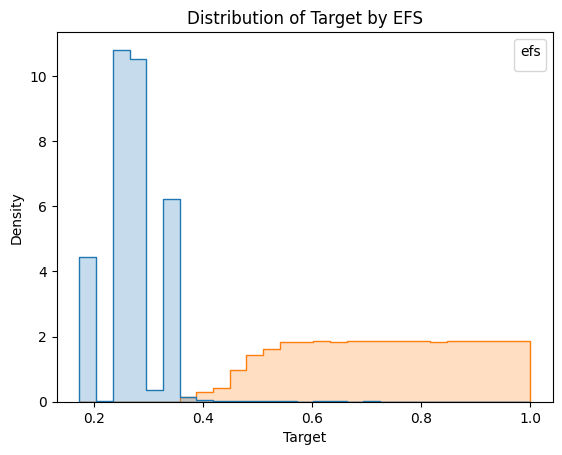

In [ ]:
from lifelines import KaplanMeierFitter
def transform_survival_probability(df, time_col='efs_time', event_col='efs'):

    kmf = KaplanMeierFitter()

    kmf.fit(df[time_col], event_observed=df[event_col])

    survival_probabilities = kmf.survival_function_at_times(df[time_col]).values.flatten()

    return survival_probabilities

race_group=sorted(train['race_group'].unique())
for race in race_group:
    train.loc[train['race_group']==race,"target"] = transform_survival_probability(train[train['race_group']==race], time_col='efs_time', event_col='efs')
    gap=0.2
    #0.7*(train.loc[(train['race_group']==race)&(train['efs']==0)]['target'].max()-train.loc[(train['race_group']==race)&(train['efs']==1)]['target'].min())/2
    train.loc[(train['race_group']==race)&(train['efs']==0),'target']-=gap

sns.histplot(data=train, x='target', hue='efs', element='step', stat='density', common_norm=False)
plt.legend(title='efs')
plt.title('Distribution of Target by EFS')
plt.xlabel('Target')
plt.ylabel('Density')
plt.show()

# train.drop(['efs','efs_time'],axis=1,inplace=True)

### Feature Engineering

In [ ]:
def create_age_bins_with_missing(train, column_name='donor_age', new_column_name='donor_age_group'):
    """
    Bins the donor_age column into categorical age groups, handling missing values.

    Parameters:
    - train (DataFrame): The DataFrame containing the donor_age column.
    - column_name (str): The name of the column to bin (default: 'donor_age').
    - new_column_name (str): The name of the new binned column (default: 'donor_age_group').

    Returns:
    - DataFrame: The DataFrame with the new categorical age group column.
    """
    # Define age bins and labels
    bins = [18, 30, 45, 60, 75, 100]  # Adjust as necessary
    labels = [ '18-30', '31-45', '46-60', '61-75', '76+']

    # Create the binned column
    train[new_column_name] = pd.cut(train[column_name], bins=bins, labels=labels, right=False)

    # Handle missing values by assigning 'Unknown'
    train[new_column_name] = train[new_column_name].cat.add_categories('Missing')
    train[new_column_name].fillna('Missing', inplace=True)

    return train


def feat_eng(df):
  df['donor_age_diff'] = df['donor_age']-df['age_at_hct']
  df['hla_aggregate'] = df[['hla_match_c_high', 'hla_match_drb1_high']].mean(axis=1)
  df['hla_range'] = df[['hla_match_c_high', 'hla_match_drb1_high']].max(axis=1) - df[['hla_match_c_high', 'hla_match_drb1_high']].min(axis=1)
  df['hla_c_to_drb1_ratio'] = df['hla_match_c_high'] / (df['hla_match_drb1_high'] + 1e-5)
  df['hla_c_drb1_product'] = df['hla_match_c_high'] * df['hla_match_drb1_high']

  df['hla_nmdp_6'] = df[['hla_match_a_low', 'hla_match_b_low', 'hla_match_drb1_high']].fillna(0).sum(axis=1)
  df['hla_low_res_6'] = df[['hla_match_a_low', 'hla_match_b_low', 'hla_match_drb1_low']].fillna(0).sum(axis=1)
  df['hla_high_res_6'] = df[['hla_match_a_high', 'hla_match_b_high', 'hla_match_drb1_high']].fillna(0).sum(axis=1)

  df['hla_low_res_8'] = df[['hla_match_a_low', 'hla_match_b_low', 'hla_match_c_low', 'hla_match_drb1_low']].fillna(0).sum(axis=1)
  df['hla_high_res_8'] = df[['hla_match_a_high', 'hla_match_b_high', 'hla_match_c_high', 'hla_match_drb1_high']].fillna(0).sum(axis=1)

  df['hla_low_res_10'] = df[['hla_match_a_low', 'hla_match_b_low', 'hla_match_c_low', 'hla_match_drb1_low', 'hla_match_dqb1_low']].fillna(0).sum(axis=1)
  df['hla_high_res_10'] = df[['hla_match_a_high', 'hla_match_b_high', 'hla_match_c_high', 'hla_match_drb1_high', 'hla_match_dqb1_high']].fillna(0).sum(axis=1)

  return df

def generate_aggregations_and_interactions(df, features):
    """
    Generate feature aggregations and interaction terms for a given list of features.

    Parameters:
    - df: pd.DataFrame, the input DataFrame.
    - features: list, the list of feature column names to use for aggregations and interactions.

    Returns:
    - pd.DataFrame: DataFrame with the original and new features added.
    """
    # Create a copy of the input DataFrame
    df = df.copy()

    # Aggregation features
    df['agg_mean'] = df[features].mean(axis=1)
    df['agg_sum'] = df[features].sum(axis=1)
    df['agg_std'] = df[features].std(axis=1)
    df['agg_range'] = df[features].max(axis=1) - df[features].min(axis=1)

    # Interaction features: Pairwise ratios and products
    for i, feature1 in enumerate(features):
        for feature2 in features[i+1:]:
            ratio_col = f"{feature1}_to_{feature2}_ratio"
            product_col = f"{feature1}_x_{feature2}_product"

            # Avoid division by zero
            df[ratio_col] = df[feature1] / (df[feature2] + 1e-5)
            df[product_col] = df[feature1] * df[feature2]

    return df

In [ ]:
#nunique=2
nunique2=[col for col in train.columns if train[col].nunique()==2 and col!='efs']
#nunique<50
nunique50=[col for col in train.columns if train[col].nunique()<50 and col!='efs']+['age_group','dri_score_NA']

def FE(df):
    print("< deal with outlier >")
    df['nan_value_each_row'] = df.isnull().sum(axis=1)
    #year_hct=2020 only 4 rows.
    df['year_hct']=df['year_hct'].replace(2020,2019)
    df['age_group']=df['age_at_hct']//10
    #karnofsky_score 40 only 10 rows.
    df['karnofsky_score']=df['karnofsky_score'].replace(40,50)
    #hla_high_res_8=2 only 2 rows.
    df['hla_high_res_8']=df['hla_high_res_8'].replace(2,3)
    #hla_high_res_6=0 only 1 row.
    df['hla_high_res_6']=df['hla_high_res_6'].replace(0,2)
    #hla_high_res_10=3 only 1 row.
    df['hla_high_res_10']=df['hla_high_res_10'].replace(3,4)
    #hla_low_res_8=2 only 1 row.
    df['hla_low_res_8']=df['hla_low_res_8'].replace(2,3)
    df['dri_score']=df['dri_score'].replace('Missing disease status','N/A - disease not classifiable')
    df['dri_score_NA']=df['dri_score'].apply(lambda x:int('N/A' in str(x)))
    for col in ['diabetes','pulm_moderate','cardiac']:
        df.loc[df[col].isna(),col]='Not done'

    print("< cross feature >")
    df['donor_age-age_at_hct']=df['donor_age']-df['age_at_hct']
    df['comorbidity_score+karnofsky_score']=df['comorbidity_score']+df['karnofsky_score']
    df['comorbidity_score-karnofsky_score']=df['comorbidity_score']-df['karnofsky_score']
    df['comorbidity_score*karnofsky_score']=df['comorbidity_score']*df['karnofsky_score']
    df['comorbidity_score/karnofsky_score']=df['comorbidity_score']/df['karnofsky_score']

    print("< fillna >")
    # df[nunique50]=df[nunique50].astype(str).fillna('NaN')

    print("< combine category feature >")
    for i in range(len(nunique2)):
        for j in range(i+1,len(nunique2)):
            df[nunique2[i]+nunique2[j]]=df[nunique2[i]].astype(str)+df[nunique2[j]].astype(str)

    print("< drop useless columns >")
    df.drop(['ID'],axis=1,inplace=True,errors='ignore')
    return df

In [ ]:
# Generic FE
train = FE(train)
test = FE(test)

# Age Bins
train = create_age_bins_with_missing(train)
test = create_age_bins_with_missing(test)

# Feat Eng
train = feat_eng(train)
test = feat_eng(test)

# Aggs
# features = ['hla_high_res_8', 'hla_high_res_6', 'hla_high_res_10',
#             'hla_low_res_6', 'hla_low_res_8', 'hla_low_res_10', 'hla_nmdp_6']
# train = generate_aggregations_and_interactions(train, features)
# test = generate_aggregations_and_interactions(test, features)


# features = ['hla_match_c_low', 'hla_match_drb1_low', 'hla_match_dqb1_low',
#         'hla_match_b_low', 'hla_match_a_low',

#        'hla_match_c_high',
#       'hla_match_b_high',  'hla_match_drb1_high',  'hla_match_a_high', 'hla_match_dqb1_high']

# train = generate_aggregations_and_interactions(train, features)
# test = generate_aggregations_and_interactions(test, features)

features = ['hla_high_res_8', 'hla_high_res_6', 'hla_high_res_10',
            'hla_low_res_6', 'hla_low_res_8', 'hla_low_res_10', 'hla_nmdp_6',
            'hla_match_c_low', 'hla_match_drb1_low', 'hla_match_dqb1_low',
        'hla_match_b_low', 'hla_match_a_low', 'hla_match_c_high','hla_match_b_high',
            'hla_match_drb1_high',  'hla_match_a_high', 'hla_match_dqb1_high']

# train = generate_aggregations_and_interactions(train, features)
# test = generate_aggregations_and_interactions(test, features)

# features = test.filter(like = 'hla').columns.tolist()

# # Impute missing values with mean
# imputer = SimpleImputer(strategy='median')
# train_imputed = imputer.fit_transform(train[features])
# test_imputed = imputer.transform(test[features])

# # Standardize the training data
# scaler = StandardScaler()
# train_features_scaled = scaler.fit_transform(train_imputed)

# # Apply PCA to retain components explaining 90% of variance
# pca = PCA(n_components=0.90)
# train_pca_transformed = pca.fit_transform(train_features_scaled)

# # Create a DataFrame for the PCA-transformed columns
# pca_columns = [f'pca_{i+1}' for i in range(train_pca_transformed.shape[1])]
# train_pca_df = pd.DataFrame(train_pca_transformed, columns=pca_columns, index=train.index)

# # Drop original columns and concatenate PCA-transformed columns for the training set
# train = train.drop(columns=features)
# train = pd.concat([train, train_pca_df], axis=1)

# # Standardize the test data using the same scaler
# test_features_scaled = scaler.transform(test_imputed)

# # Apply the same PCA model to the test data
# test_pca_transformed = pca.transform(test_features_scaled)

# # Create a DataFrame for the PCA-transformed columns
# test_pca_df = pd.DataFrame(test_pca_transformed, columns=pca_columns, index=test.index)

# # Drop original columns and concatenate PCA-transformed columns for the test set
# test = test.drop(columns=features)
# test = pd.concat([test, test_pca_df], axis=1)

# # Print the explained variance ratio
# explained_variance_ratio = pca.explained_variance_ratio_
# total_explained_variance = explained_variance_ratio.sum()
# print(f"Total explained variance: {total_explained_variance:.2f}")
# print(f"Number of components: {pca.n_components_}")

< deal with outlier >
< cross feature >
< fillna >
< combine category feature >
< drop useless columns >
< deal with outlier >
< cross feature >
< fillna >
< combine category feature >
< drop useless columns >


<ipython-input-7-e963048c073b>:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train[new_column_name].fillna('Missing', inplace=True)
<ipython-input-7-e963048c073b>:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', tr

In [ ]:
# # # Consider transform of target https://www.kaggle.com/code/cdeotte/gpu-lightgbm-baseline-cv-681-lb-685/notebook#Transform-Two-Targets-into-One-Target-with-KaplanMeier!
# from lifelines import KaplanMeierFitter
# def transform_survival_probability(df, time_col='efs_time', event_col='efs'):
#     kmf = KaplanMeierFitter()
#     kmf.fit(df[time_col], df[event_col])
#     y = kmf.survival_function_at_times(df[time_col]).values
#     return y
# train["y"] = transform_survival_probability(train, time_col='efs_time', event_col='efs')

# plt.hist(train.loc[train.efs==1,"y"],bins=100,label="efs=1, Yes Event")
# plt.hist(train.loc[train.efs==0,"y"],bins=100,label="efs=0, Maybe Event")
# plt.xlabel("Transformed Target y")
# plt.ylabel("Density")
# plt.title("KaplanMeier Transformed Target y using both efs and efs_time.")
# plt.legend()
# plt.show()

In [ ]:
train.isnull().sum(axis=1)

,0
ID,
0,14
1,0
2,7
3,0
4,5
...,...
28795,7
28796,1
28797,11


In [ ]:
train.filter(like = 'age').describe()

,donor_age,age_at_hct,donor_age_diff
count,26992.000000,28800.000000,26992.000000
mean,42.511591,38.663162,2.771357
std,15.251434,21.147581,23.846735
min,18.010000,0.044000,-52.888000
25%,28.447000,19.539000,-14.284500
50%,40.063000,41.006000,2.392500
75%,56.131500,55.965250,19.005250
max,84.800000,73.726000,80.769000


In [ ]:
train['donor_age']-train['age_at_hct']

,0
ID,
0,NaN
1,28.585
2,NaN
3,-14.015
4,27.070
...,...
28795,-26.924
28796,12.695
28797,-28.378


In [ ]:
train.filter(like = 'year').describe()

,year_hct
count,28800.000000
mean,2015.179444
std,3.153914
min,2008.000000
25%,2013.000000
50%,2016.000000
75%,2018.000000
max,2020.000000


## EDA

### Nans

In [ ]:
train.isna().sum()

,0
dri_score,154
psych_disturb,2062
cyto_score,8068
diabetes,2119
hla_match_c_high,4620
hla_high_res_8,5829
tbi_status,0
arrhythmia,2202
hla_low_res_6,3270
graft_type,0


In [ ]:
test.isna().sum()

,0
dri_score,0
psych_disturb,0
cyto_score,2
diabetes,0
hla_match_c_high,1
hla_high_res_8,1
tbi_status,0
arrhythmia,0
hla_low_res_6,0
graft_type,0


### Target

In [ ]:
target = 'efs'
train[target].describe()

,efs
count,28800.000000
mean,0.539306
std,0.498461
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,1.000000


In [ ]:
train[target].value_counts()

,count
efs,
1.0,15532
0.0,13268


In [ ]:
train.groupby('efs')['efs_time'].describe()

,count,mean,std,min,25%,50%,75%,max
efs,,,,,,,,
0.0,13268.0,43.121212,24.258854,3.212,25.2735,37.194,54.4525,156.819
1.0,15532.0,6.252439,3.386629,0.333,4.4770,5.803,7.3220,120.009


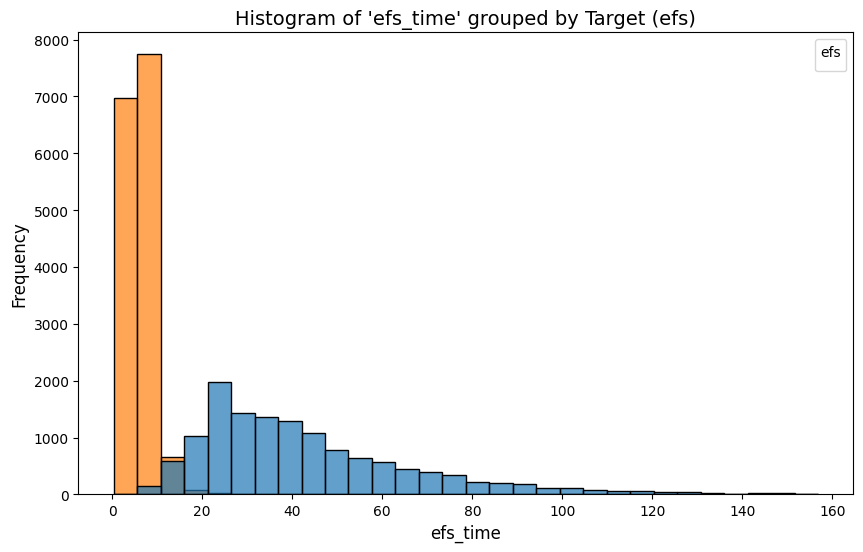

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(data=train, x='efs_time', hue='efs', bins=30, kde=False, alpha=0.7)

# Customizing the plot
plt.title("Histogram of 'efs_time' grouped by Target (efs)", fontsize=14)
plt.xlabel('efs_time', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.legend(title='efs')
plt.show()

In [ ]:
display(train.dropna()[target].describe()) # Make this the validation set
train.dropna().groupby('efs')['efs_time'].describe()

,efs
count,1974.000000
mean,0.652989
std,0.476140
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,1.000000


,count,mean,std,min,25%,50%,75%,max
efs,,,,,,,,
0,685.0,47.617841,24.560963,5.801,31.126,41.720,59.014,149.291
1,1289.0,6.580678,2.418221,0.980,5.135,6.414,7.582,34.366


In [ ]:
display(train[train.isna().any(axis = 1)][target].describe())
train[train.isna().any(axis = 1)].groupby('efs')['efs_time'].describe()

,efs
count,26826.000000
mean,0.530940
std,0.499051
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,1.000000


,count,mean,std,min,25%,50%,75%,max
efs,,,,,,,,
0,12583.0,42.876422,24.219336,3.212,25.124,36.913,54.1135,156.819
1,14243.0,6.222734,3.459453,0.333,4.426,5.748,7.2890,120.009


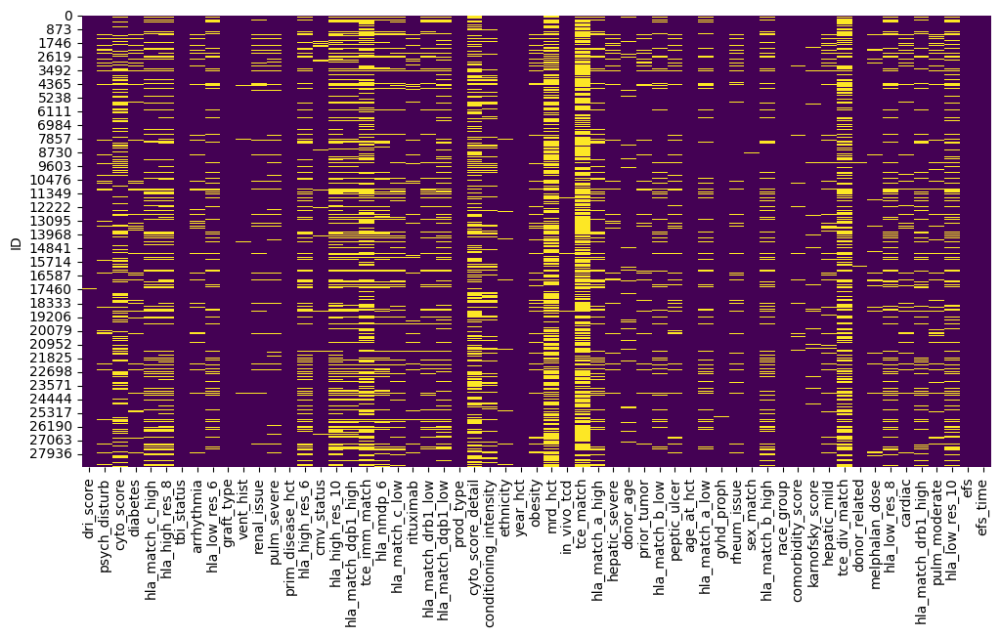

In [ ]:
# Visualizing missing data pattern
plt.figure(figsize=(12, 6))
sns.heatmap(train.isnull(), cbar=False, cmap="viridis")
plt.show()

### Correlations

In [ ]:
train.select_dtypes(exclude = 'object').corr().style.background_gradient(cmap = 'coolwarm', vmin = -1, vmax = 1)

,hla_match_c_high,hla_high_res_8,hla_low_res_6,hla_high_res_6,hla_high_res_10,hla_match_dqb1_high,hla_nmdp_6,hla_match_c_low,hla_match_drb1_low,hla_match_dqb1_low,year_hct,hla_match_a_high,donor_age,hla_match_b_low,age_at_hct,hla_match_a_low,hla_match_b_high,comorbidity_score,karnofsky_score,hla_low_res_8,hla_match_drb1_high,hla_low_res_10,efs,efs_time
hla_match_c_high,1.000000,0.858282,0.754627,0.750739,0.853098,0.613023,0.747162,0.742873,0.687148,0.593530,-0.150124,0.567845,-0.080608,0.728296,-0.021295,0.588746,0.702993,-0.034718,-0.022375,0.789160,0.681908,0.798376,0.031850,0.033179
hla_high_res_8,0.858282,1.000000,0.909537,0.983351,0.986125,0.699397,0.883250,0.800855,0.813857,0.665181,-0.165231,0.822836,-0.058954,0.842374,0.011972,0.773468,0.883800,-0.014173,-0.038712,0.922293,0.879812,0.922255,0.044224,0.038312
hla_low_res_6,0.754627,0.909537,1.000000,0.899229,0.912479,0.684575,0.882176,0.763247,0.893837,0.639613,-0.162176,0.759426,-0.046267,0.897411,0.025693,0.867108,0.772630,-0.008468,-0.046744,0.983812,0.806428,0.968904,0.047007,0.031964
hla_high_res_6,0.750739,0.983351,0.899229,1.000000,0.968703,0.679518,0.870521,0.759922,0.798041,0.639689,-0.157125,0.854499,-0.045224,0.819254,0.022085,0.782468,0.884266,-0.006176,-0.042139,0.903878,0.886769,0.902408,0.045261,0.035943
hla_high_res_10,0.853098,0.986125,0.912479,0.968703,1.000000,0.808341,0.886625,0.811577,0.829971,0.695175,-0.159467,0.804656,-0.065806,0.846500,0.018006,0.767826,0.872777,-0.018356,-0.045402,0.926091,0.879950,0.929522,0.048431,0.034113
hla_match_dqb1_high,0.613023,0.699397,0.684575,0.679518,0.808341,1.000000,0.669252,0.608257,0.656886,0.590400,-0.105586,0.529021,-0.050081,0.627079,0.023520,0.538623,0.599843,-0.034074,-0.038852,0.697815,0.640079,0.719347,0.039736,0.018179
hla_nmdp_6,0.747162,0.883250,0.882176,0.870521,0.886625,0.669252,1.000000,0.754331,0.787465,0.639206,-0.152893,0.747690,-0.035644,0.798461,0.021023,0.770199,0.752435,0.002780,-0.043804,0.889669,0.779776,0.890334,0.040145,0.038619
hla_match_c_low,0.742873,0.800855,0.763247,0.759922,0.811577,0.608257,0.754331,1.000000,0.685870,0.578571,-0.150785,0.573569,-0.083830,0.739596,-0.029774,0.590389,0.707312,-0.021406,-0.024026,0.866675,0.678618,0.860796,0.016335,0.042619
hla_match_drb1_low,0.687148,0.813857,0.893837,0.798041,0.829971,0.656886,0.787465,0.685870,1.000000,0.607881,-0.145098,0.621744,-0.051794,0.728705,0.060414,0.642660,0.680334,-0.018370,-0.058727,0.882783,0.757817,0.880678,0.067485,0.011353
hla_match_dqb1_low,0.593530,0.665181,0.639613,0.639689,0.695175,0.590400,0.639206,0.578571,0.607881,1.000000,-0.102319,0.493276,-0.061151,0.592188,0.011524,0.493960,0.559903,-0.027194,-0.039820,0.657325,0.603762,0.775921,0.032440,0.021443


In [ ]:
for col in train.filter(like = 'hla'):
  display(train[col].value_counts())

,count
hla_match_c_high,
2.0,18565
1.0,5536
0.0,79


,count
hla_high_res_8,
8.0,13568
4.0,3820
7.0,2385
5.0,1648
6.0,1520
3.0,28
2.0,2


,count
hla_low_res_6,
6.0,15690
3.0,4955
5.0,2808
4.0,2055
2.0,22


,count
hla_high_res_6,
6.0,14022
3.0,4596
5.0,2726
4.0,2128
2.0,43
0.0,1


,count
hla_high_res_10,
10.0,12232
5.0,3161
9.0,2369
6.0,1355
8.0,1314
7.0,1180
4.0,25
3.0,1


,count
hla_match_dqb1_high,
2.0,17468
1.0,6056
0.0,77


,count
hla_nmdp_6,
6.0,15105
3.0,4888
5.0,3296
4.0,1279
2.0,35


,count
hla_match_c_low,
2.0,19782
1.0,6139
0.0,79


,count
hla_match_drb1_low,
2.0,18710
1.0,7447


,count
hla_match_dqb1_low,
2.0,19131
1.0,5384
0.0,91


,count
hla_match_a_high,
2.0,17304
1.0,7132
0.0,63


,count
hla_match_b_low,
2.0,18951
1.0,7220
0.0,64


,count
hla_match_a_low,
2.0,18776
1.0,7585
0.0,49


,count
hla_match_b_high,
2.0,17366
1.0,7269
0.0,77


,count
hla_low_res_8,
8.0,15160
4.0,4259
7.0,2603
5.0,1613
6.0,1488
3.0,23
2.0,1


,count
hla_match_drb1_high,
2.0,18066
1.0,7311
0.0,71


,count
hla_low_res_10,
10.0,13734
5.0,3211
9.0,2544
6.0,1664
8.0,1387
7.0,1170
4.0,26


In [ ]:
train.filter(like = 'hla').columns

Index(['hla_match_c_high', 'hla_high_res_8', 'hla_low_res_6', 'hla_high_res_6',
       'hla_high_res_10', 'hla_match_dqb1_high', 'hla_nmdp_6',
       'hla_match_c_low', 'hla_match_drb1_low', 'hla_match_dqb1_low',
       'hla_match_a_high', 'hla_match_b_low', 'hla_match_a_low',
       'hla_match_b_high', 'hla_low_res_8', 'hla_match_drb1_high',
       'hla_low_res_10'],
      dtype='object')

In [ ]:
train[['hla_high_res_8', 'hla_high_res_6', 'hla_high_res_10']].mean(axis=1)

,0
ID,
0,6.000000
1,8.000000
2,8.000000
3,8.000000
4,8.000000
...,...
28795,8.000000
28796,4.333333
28797,8.000000


In [ ]:
train[['hla_match_c_high', 'hla_match_drb1_high']].max(axis=1) - train[['hla_match_c_high', 'hla_match_drb1_high']].min(axis=1)

,0
ID,
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
28795,0.0
28796,0.0
28797,0.0


In [ ]:
train.filter(like = 'hla').corr()[['hla_match_c_low', 'hla_match_drb1_low', 'hla_match_dqb1_low',
        'hla_match_b_low', 'hla_match_a_low']].style.background_gradient(cmap = 'coolwarm', vmin = -1, vmax = 1)

,hla_match_c_low,hla_match_drb1_low,hla_match_dqb1_low,hla_match_b_low,hla_match_a_low
hla_match_c_high,0.742873,0.687148,0.593530,0.728296,0.588746
hla_high_res_8,0.800855,0.813857,0.665181,0.842374,0.773468
hla_low_res_6,0.763247,0.893837,0.639613,0.897411,0.867108
hla_high_res_6,0.759922,0.798041,0.639689,0.819254,0.782468
hla_high_res_10,0.811577,0.829971,0.695175,0.846500,0.767826
hla_match_dqb1_high,0.608257,0.656886,0.590400,0.627079,0.538623
hla_nmdp_6,0.754331,0.787465,0.639206,0.798461,0.770199
hla_match_c_low,1.000000,0.685870,0.578571,0.739596,0.590389
hla_match_drb1_low,0.685870,1.000000,0.607881,0.728705,0.642660
hla_match_dqb1_low,0.578571,0.607881,1.000000,0.592188,0.493960


### Numeric Columns
- donor age vs age at hct
- bin donor age

In [ ]:
numeric_cols = train.select_dtypes(exclude = 'object')

In [ ]:
numeric_cols.isna().sum()

,0
hla_match_c_high,4620
hla_high_res_8,5829
hla_low_res_6,3270
hla_high_res_6,5284
hla_high_res_10,7163
hla_match_dqb1_high,5199
hla_nmdp_6,4197
hla_match_c_low,2800
hla_match_drb1_low,2643
hla_match_dqb1_low,4194


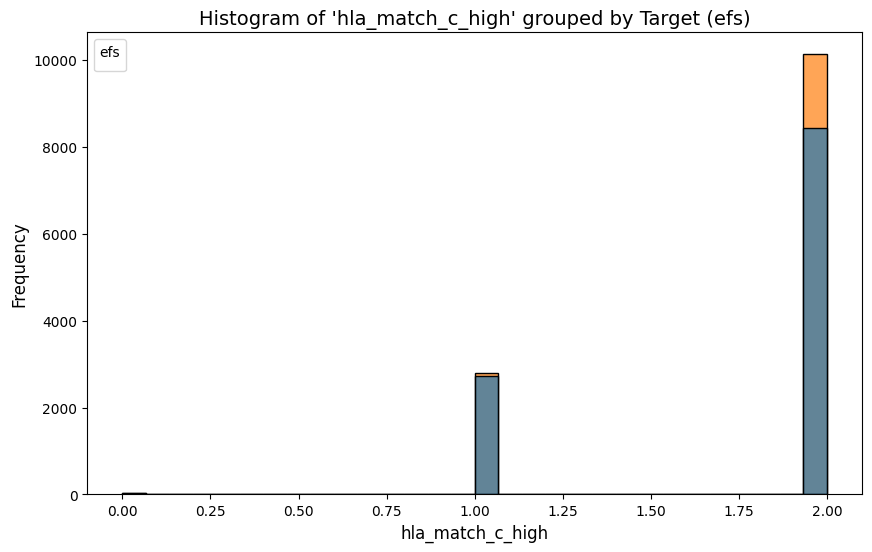

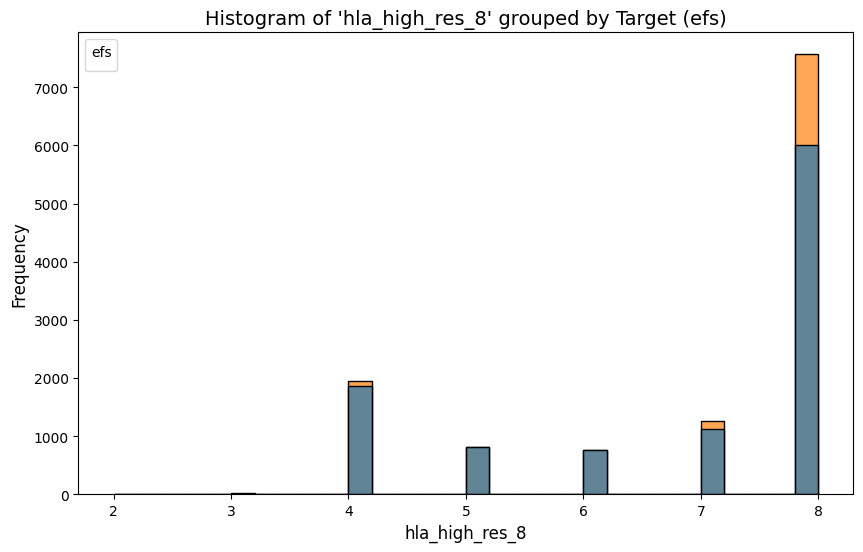

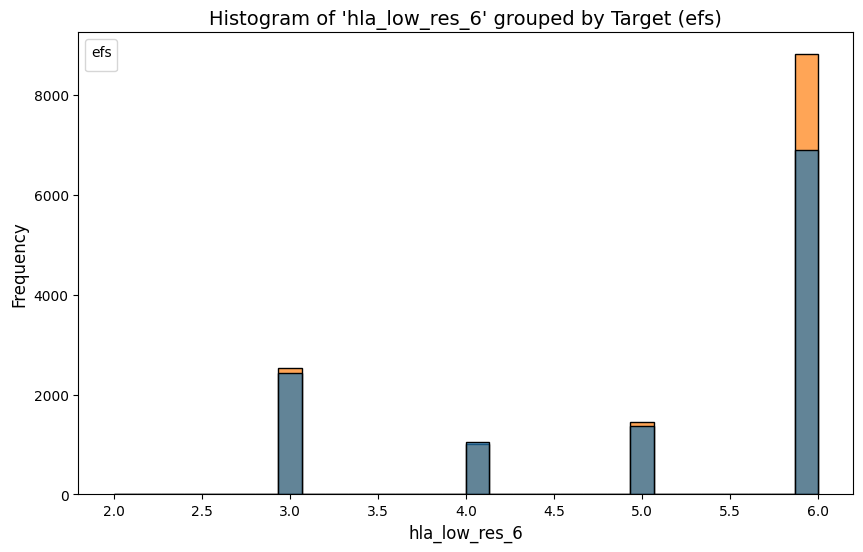

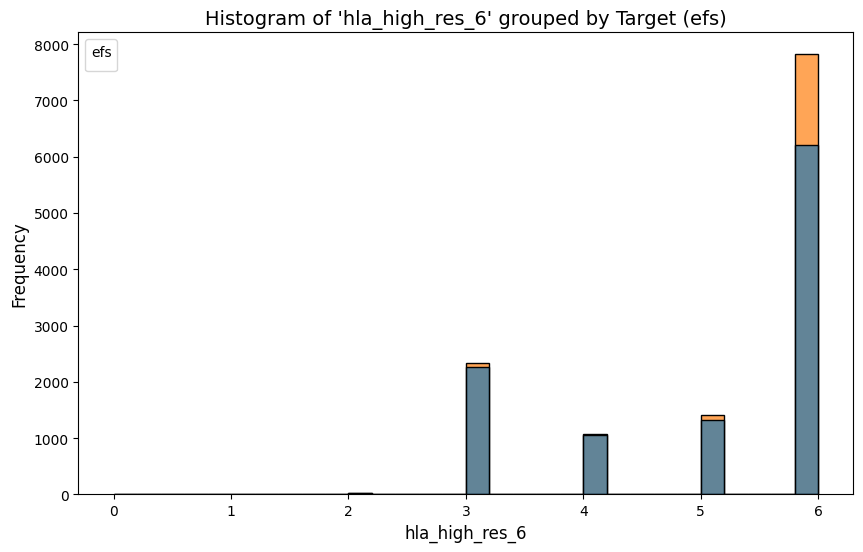

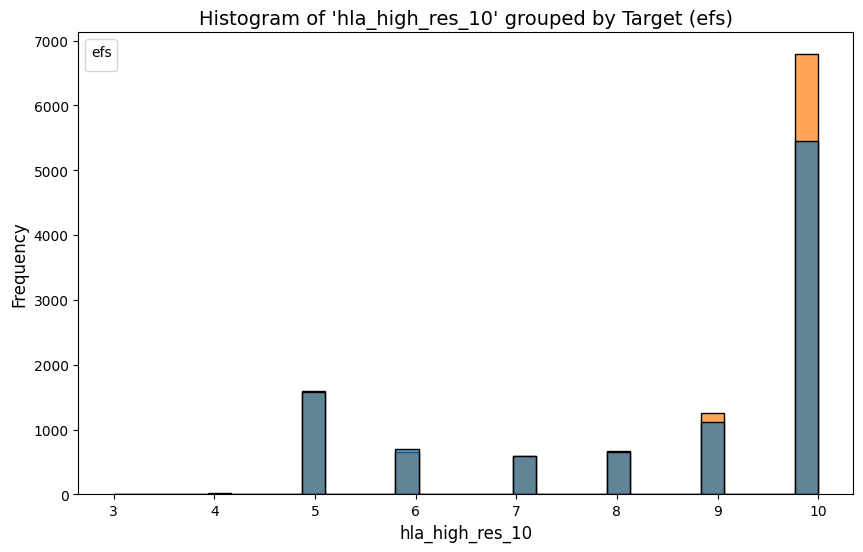

...

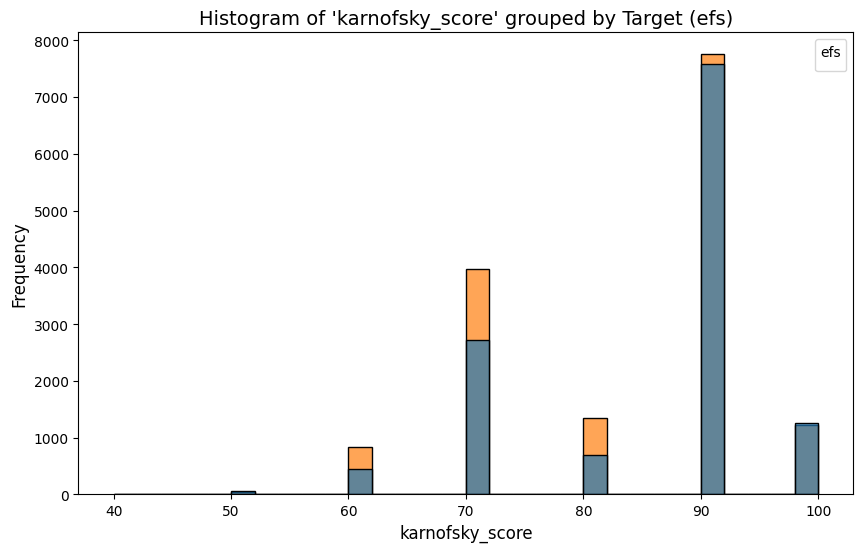

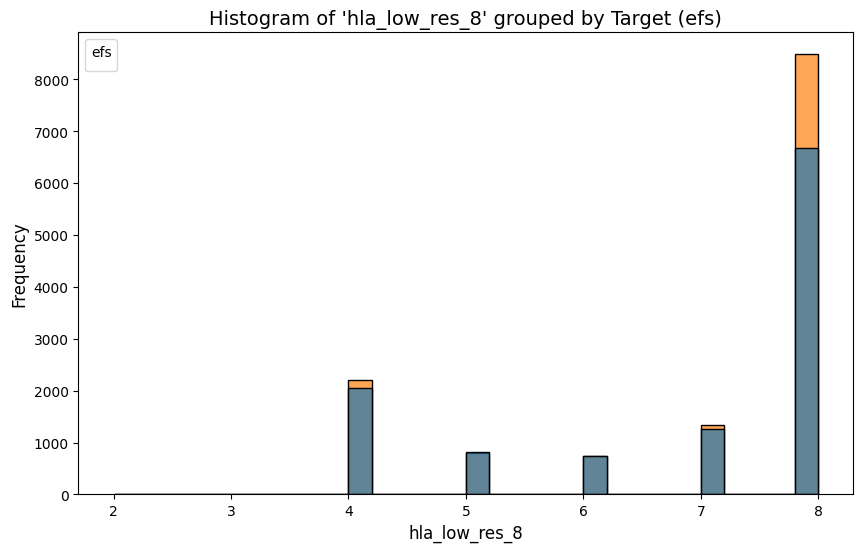

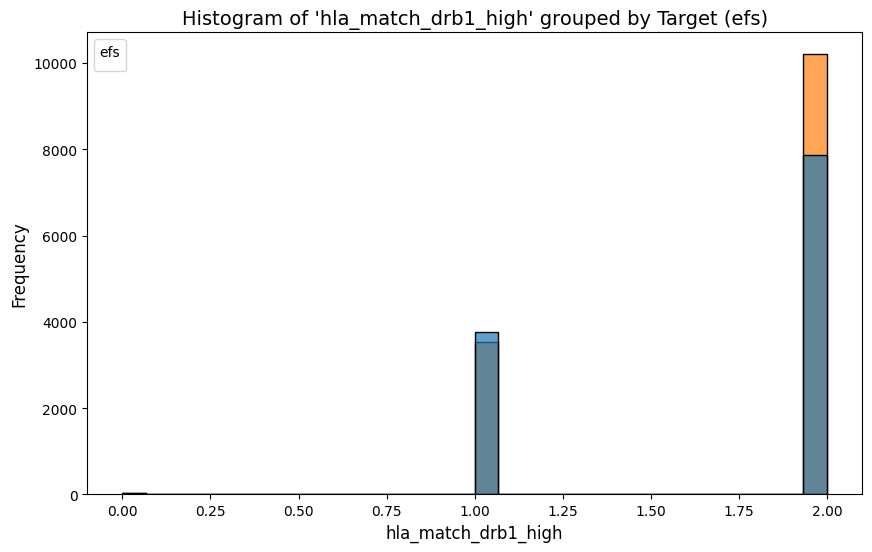

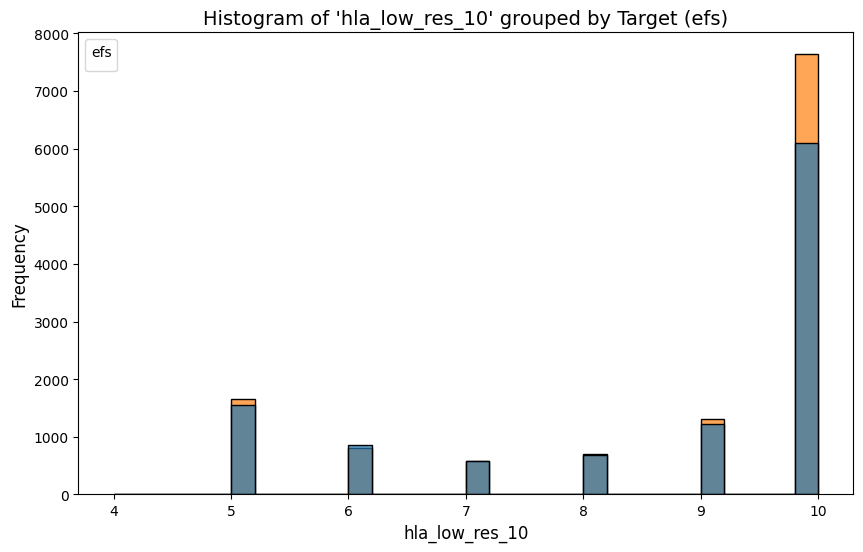

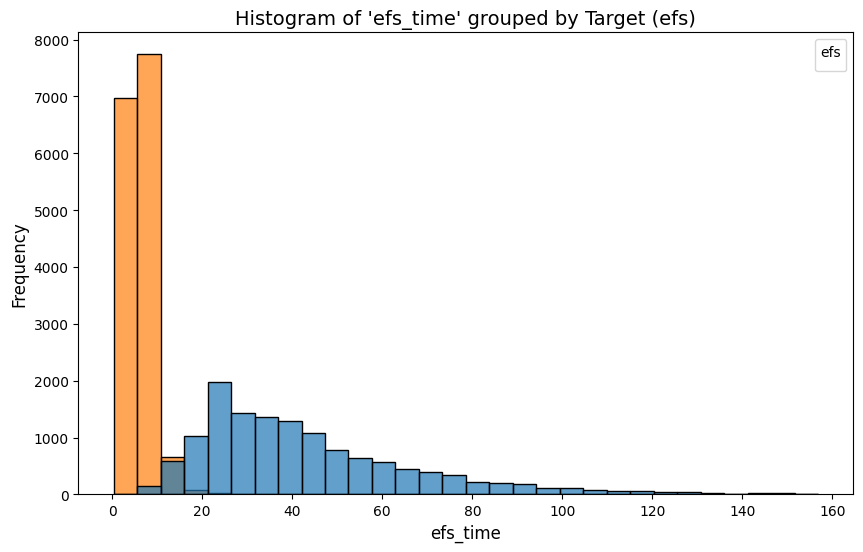

In [ ]:
for col in numeric_cols:
    if col != target:  # Skip the target column itself
        plt.figure(figsize=(10, 6))
        sns.histplot(data=train, x=col, hue=target, bins=30, kde=False, alpha=0.7)
        plt.title(f"Histogram of '{col}' grouped by Target ({target})", fontsize=14)
        plt.xlabel(col, fontsize=12)
        plt.ylabel('Frequency', fontsize=12)
        plt.legend(title=target)
        plt.show()

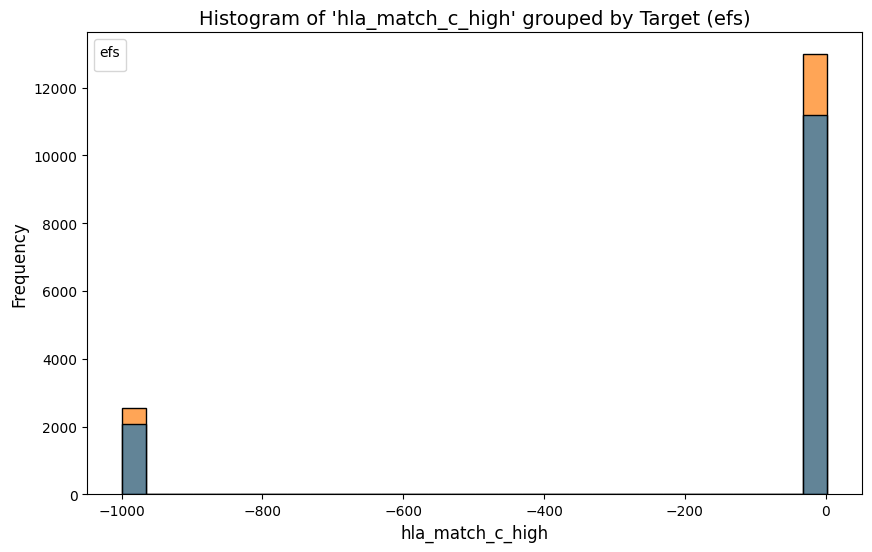

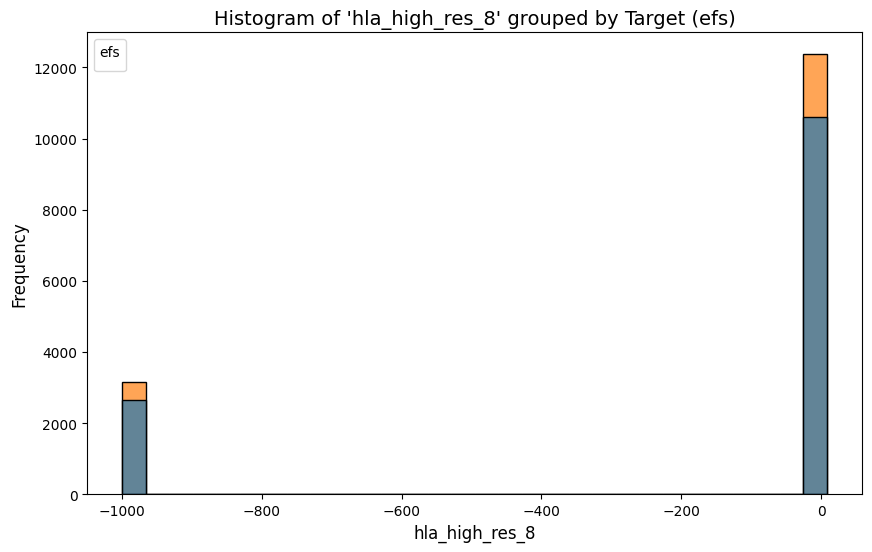

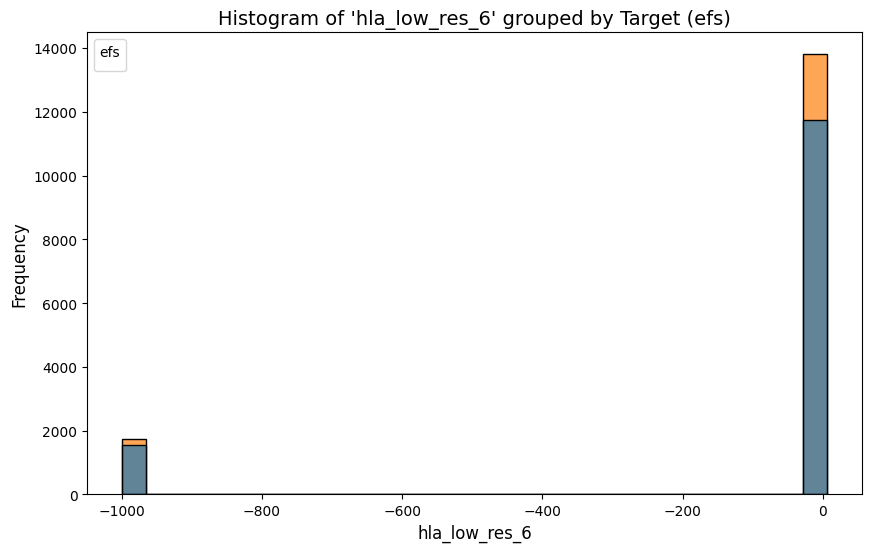

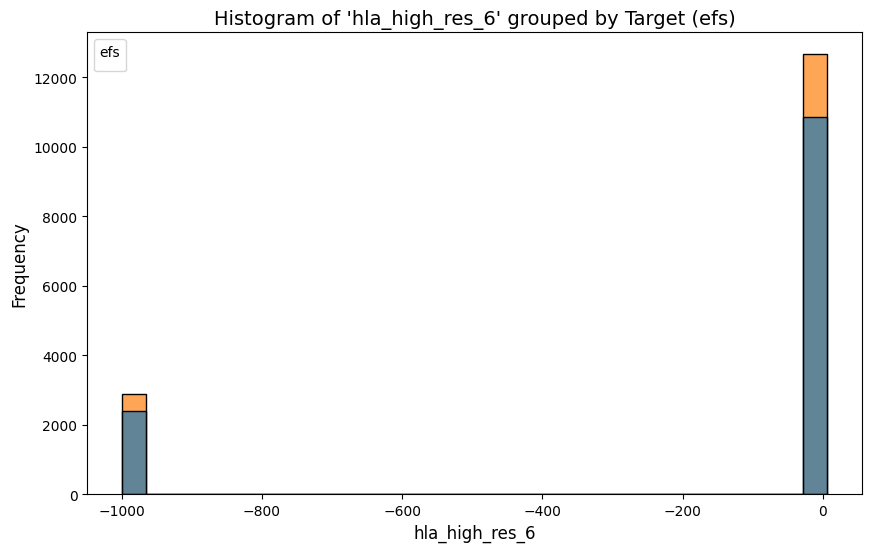

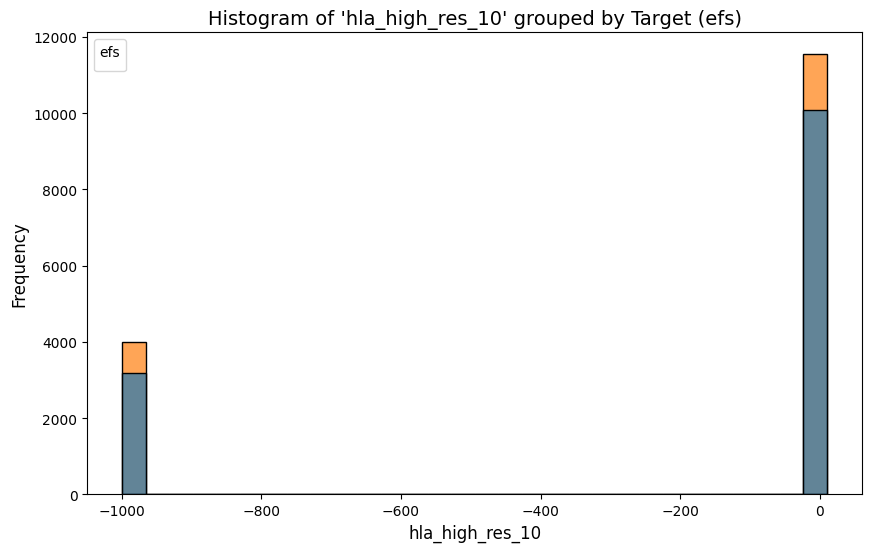

...

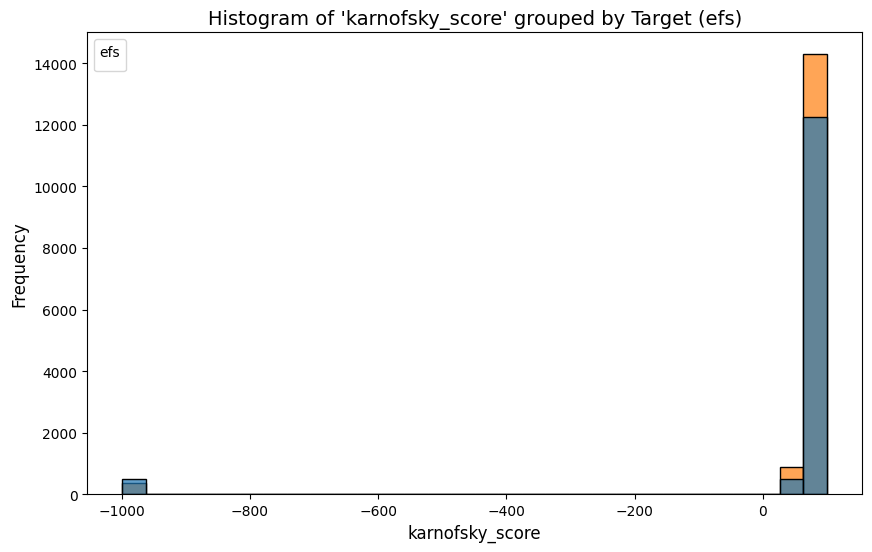

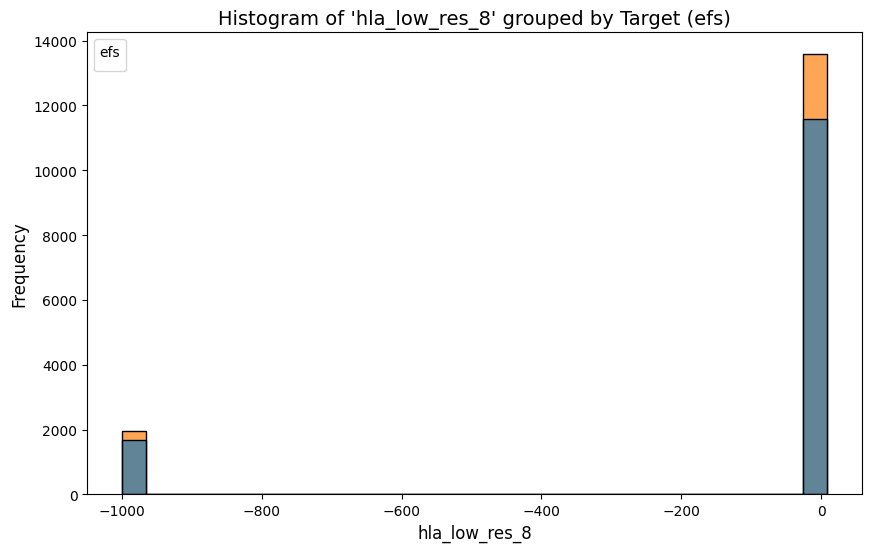

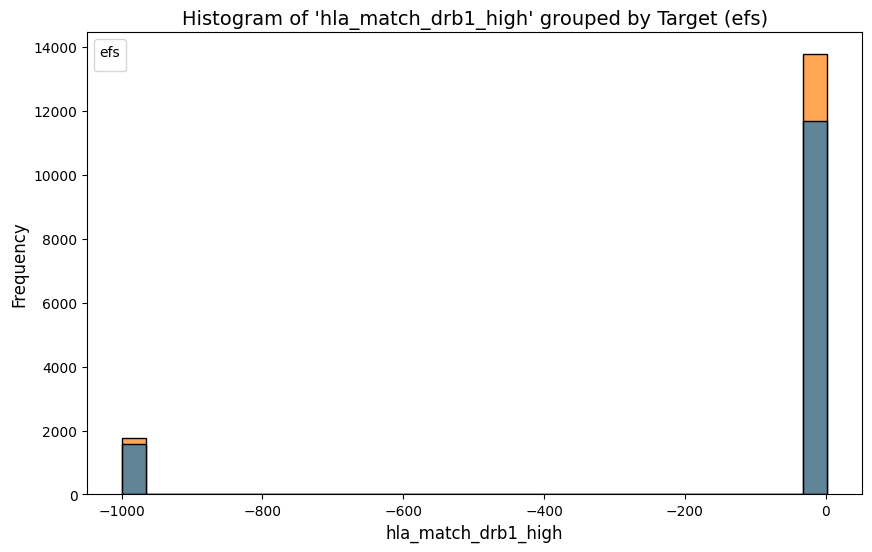

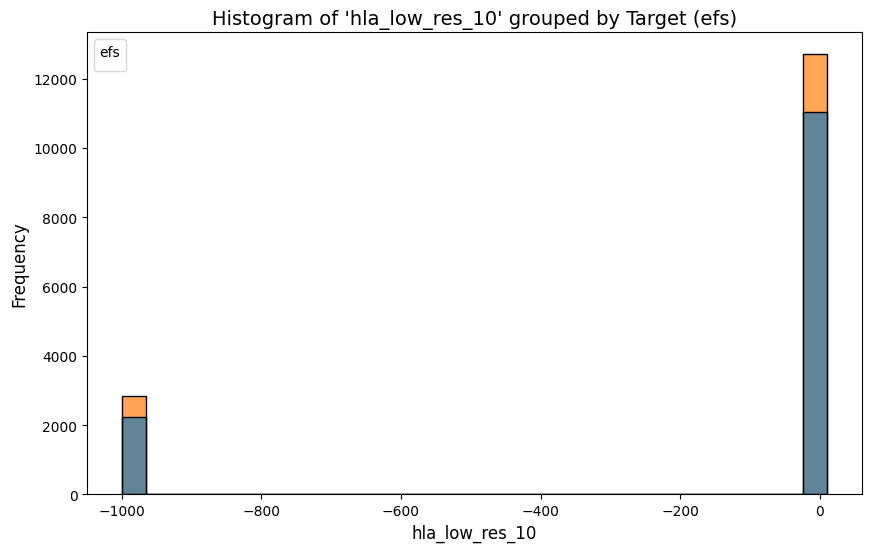

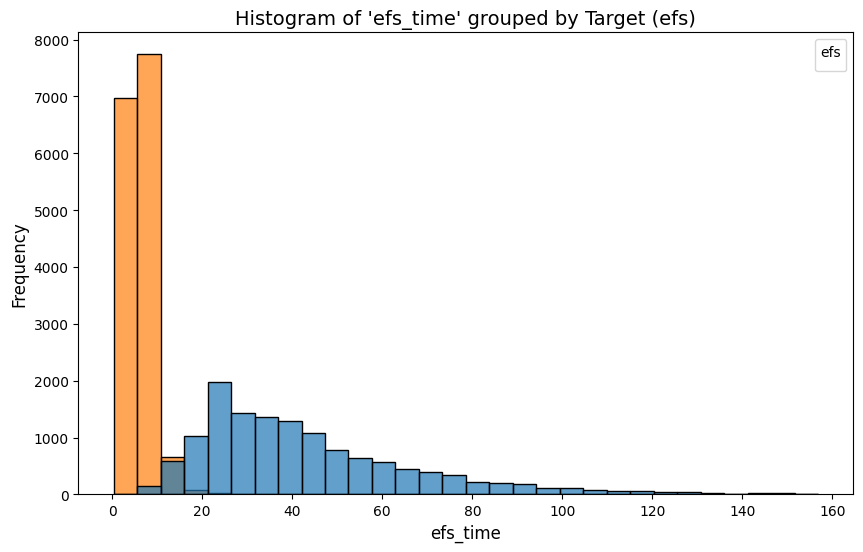

In [ ]:
# Fill nans
for col in numeric_cols:
    if col != target:  # Skip the target column itself
        plt.figure(figsize=(10, 6))
        sns.histplot(data=train.fillna(-999), x=col, hue=target, bins=30, kde=False, alpha=0.7)
        plt.title(f"Histogram of '{col}' grouped by Target ({target})", fontsize=14)
        plt.xlabel(col, fontsize=12)
        plt.ylabel('Frequency', fontsize=12)
        plt.legend(title=target)
        plt.show()

### Categorical Columns

In [ ]:
cat_cols = train.select_dtypes(include = 'object')

In [ ]:
cat_cols.isna().sum()

,0
dri_score,154
psych_disturb,2062
cyto_score,8068
diabetes,2119
tbi_status,0
arrhythmia,2202
graft_type,0
vent_hist,259
renal_issue,1915
pulm_severe,2135


<ipython-input-32-f5723288cc58>:22: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train[new_column_name].fillna('Missing', inplace=True)


In [ ]:
train[col].value_counts()

,count
donor_age_group,
18-30,7893
31-45,7749
46-60,6422
61-75,4832
Missing,1808
76+,96


<ipython-input-35-2d99c24a4cea>:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_target = train.fillna('Missing').groupby(col)[target].mean()
<ipython-input-35-2d99c24a4cea>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


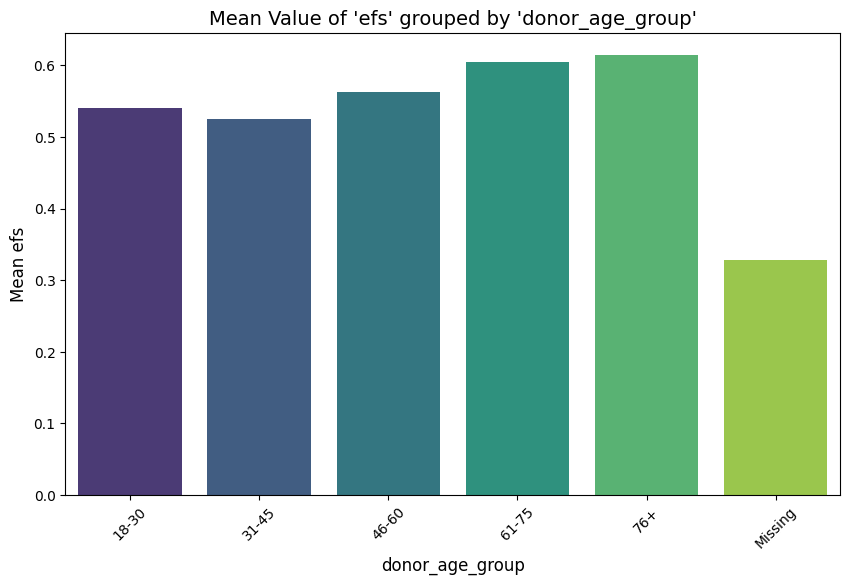

In [ ]:
# Binned Age
col = 'donor_age_group'
plt.figure(figsize=(10, 6))

# Calculate mean of target for each category
mean_target = train.fillna('Missing').groupby(col)[target].mean()

# Plot mean target values for each category
sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')

plt.title(f"Mean Value of '{target}' grouped by '{col}'", fontsize=14)
plt.xlabel(col, fontsize=12)
plt.ylabel(f"Mean {target}", fontsize=12)
plt.xticks(rotation=45)  # Rotate x-axis labels if needed
plt.show()

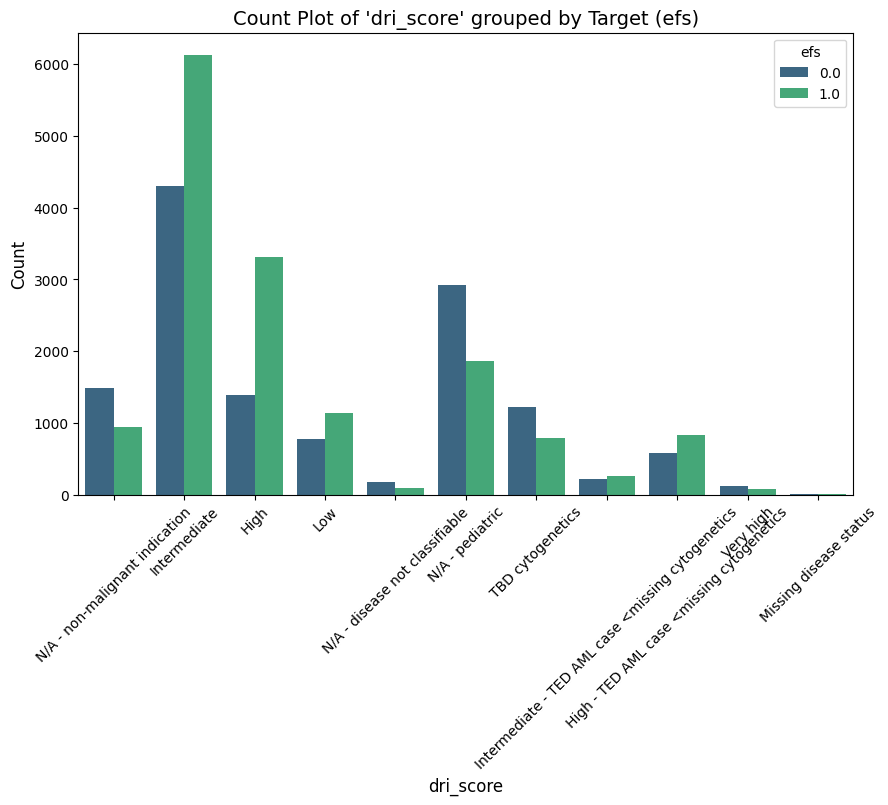

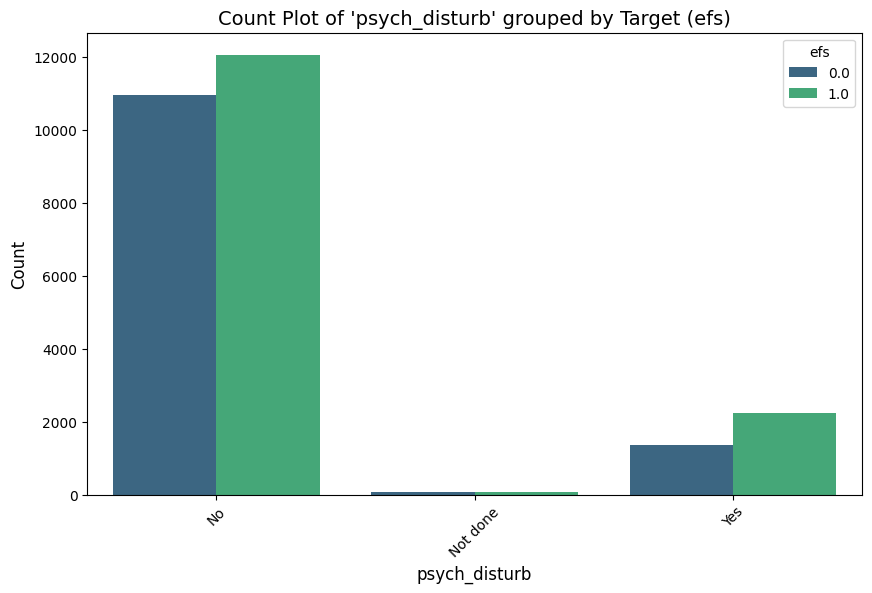

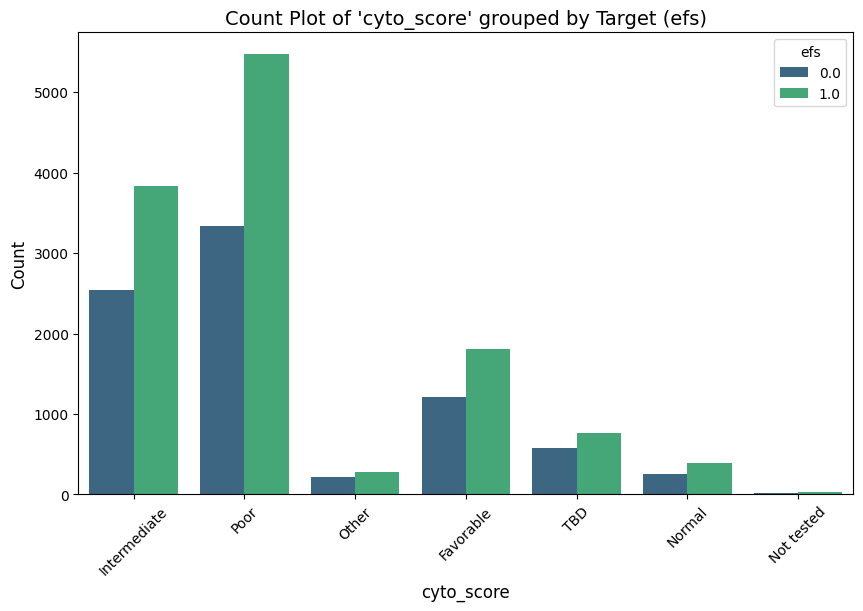

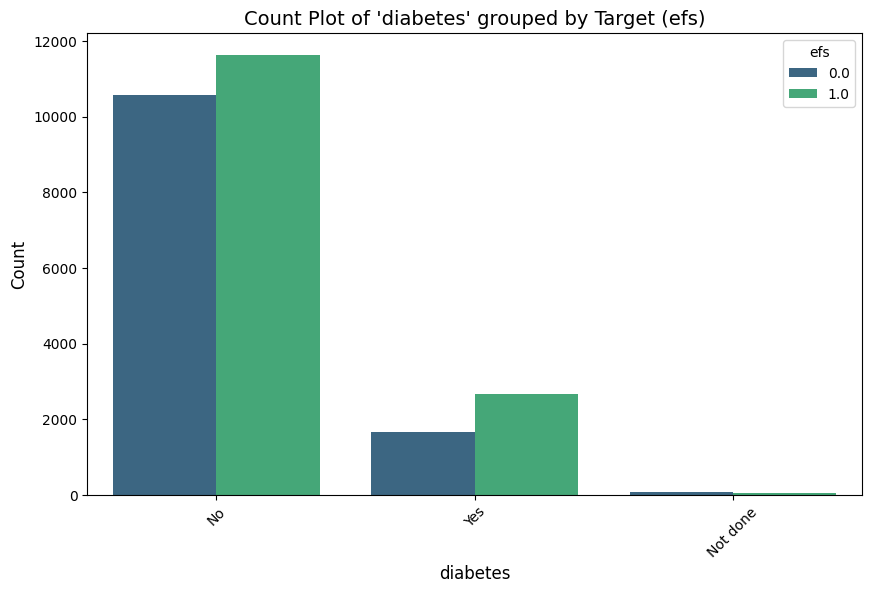

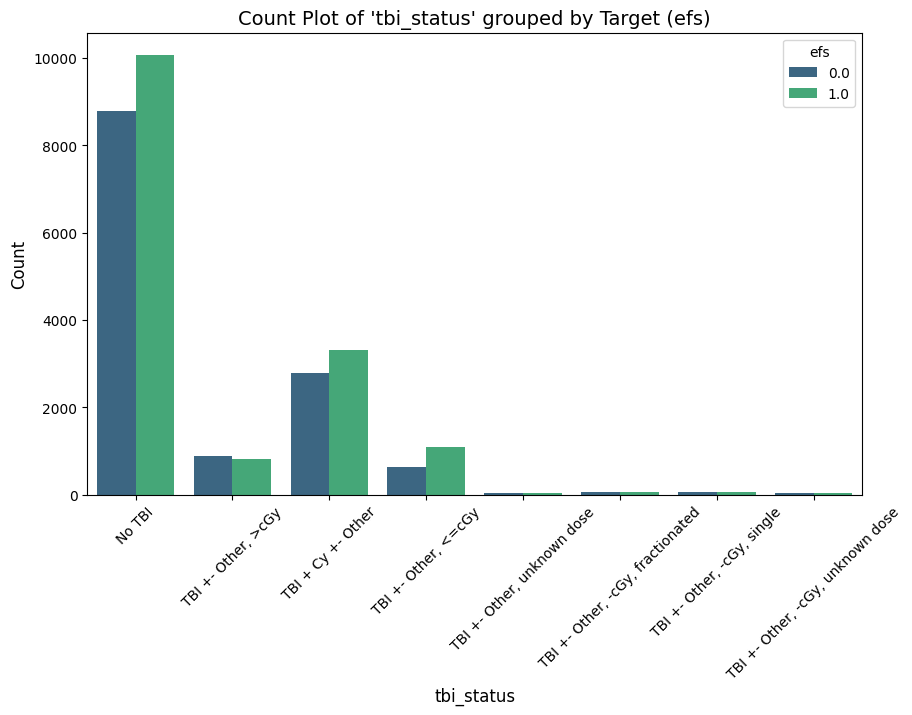

...

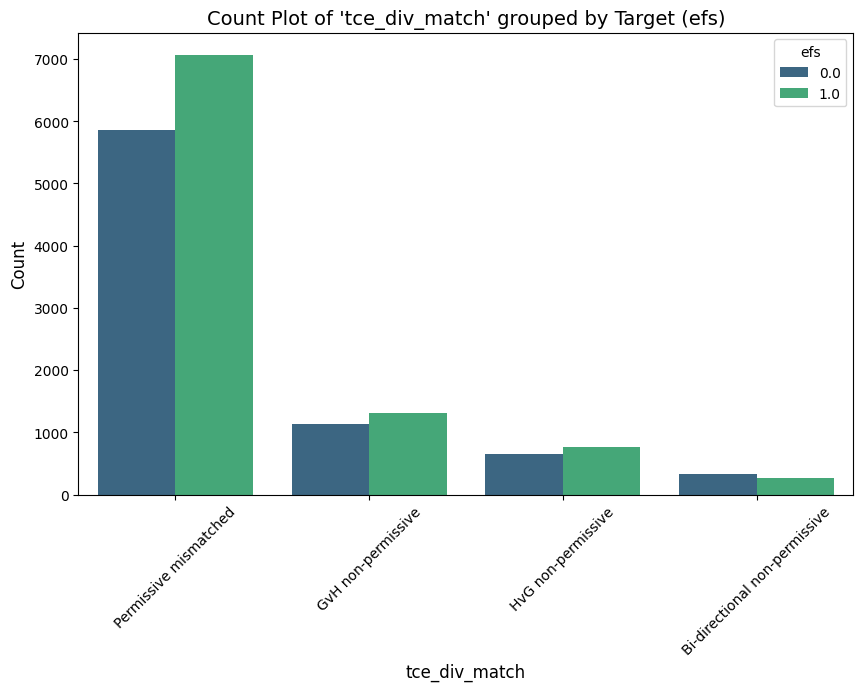

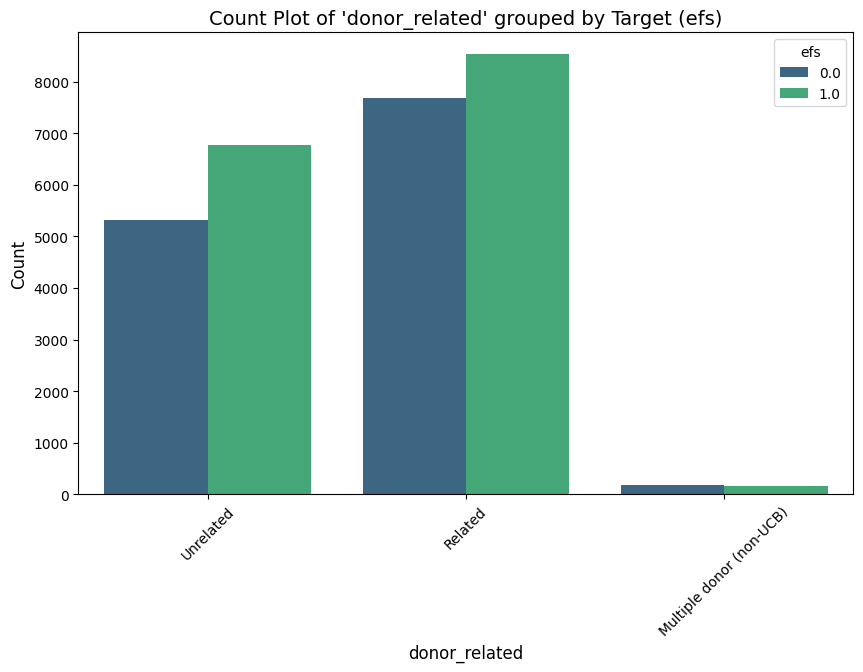

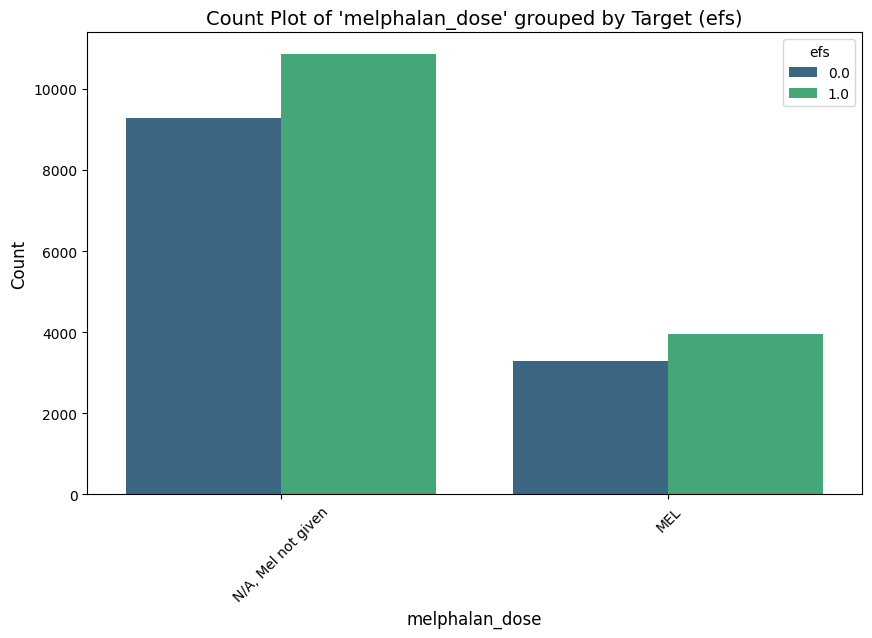

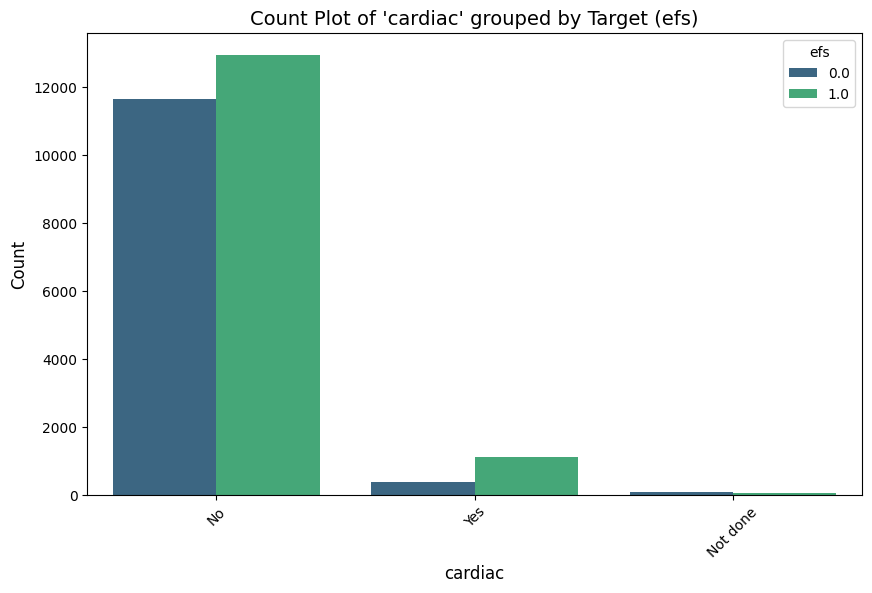

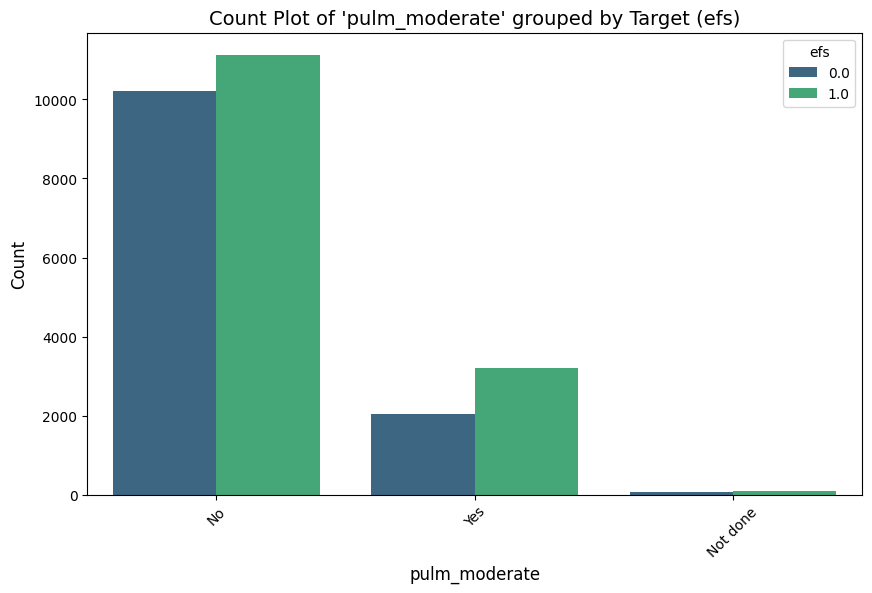

In [ ]:
# Loop through categorical columns
for col in cat_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=train, x=col, hue=target, palette='viridis')
    plt.title(f"Count Plot of '{col}' grouped by Target ({target})", fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.legend(title=target)
    plt.xticks(rotation=45)  # Rotate x-axis labels if needed
    plt.show()

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


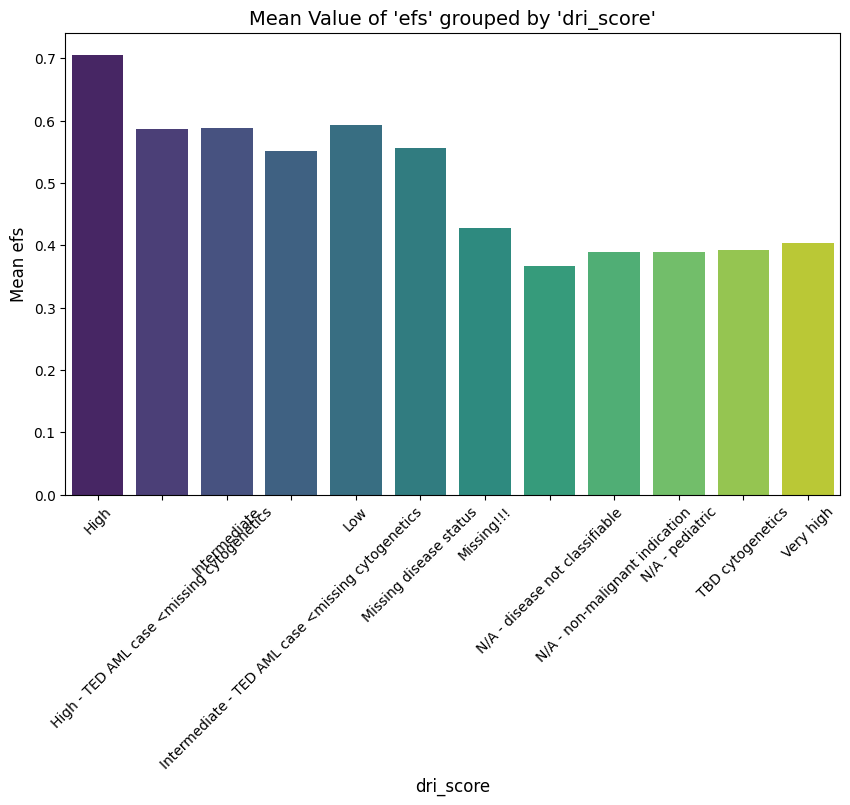

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


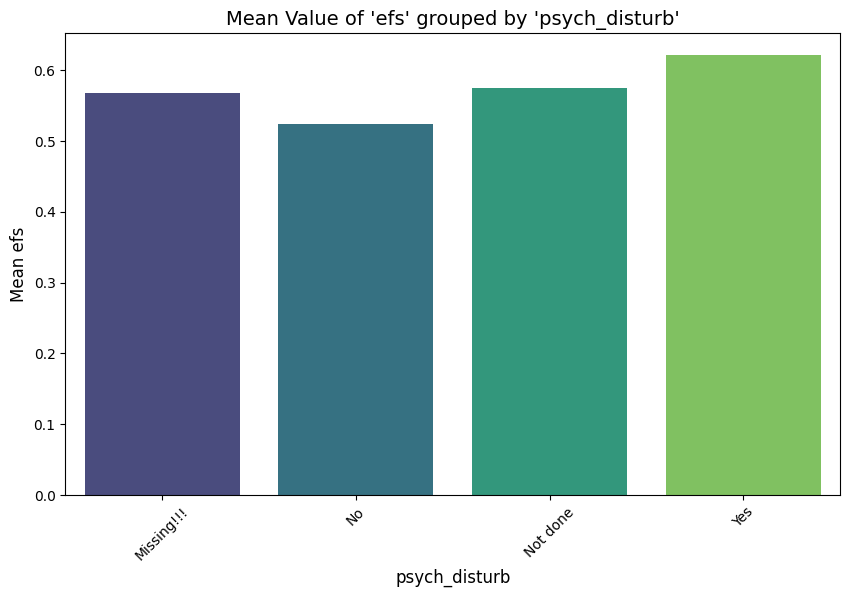

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


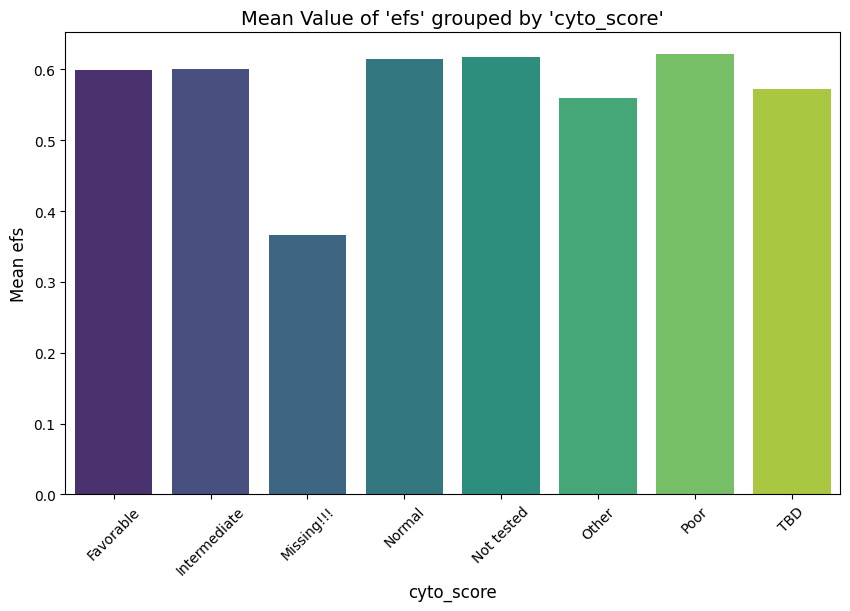

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


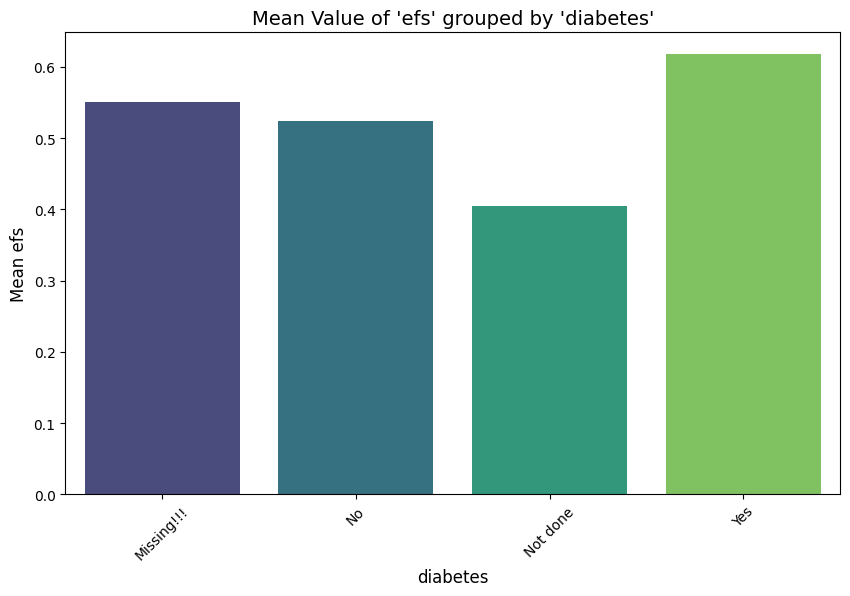

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


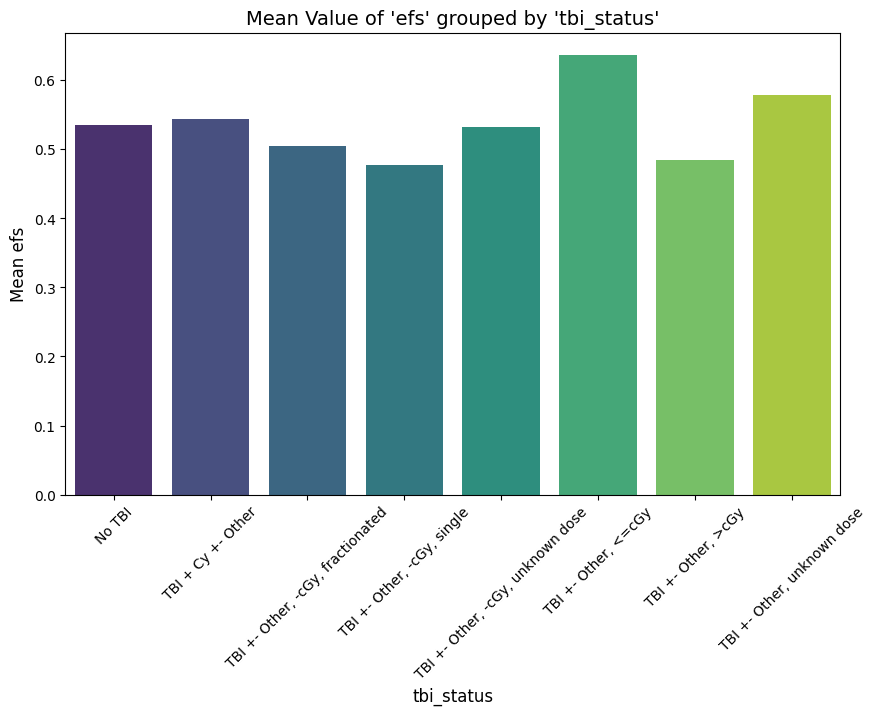

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


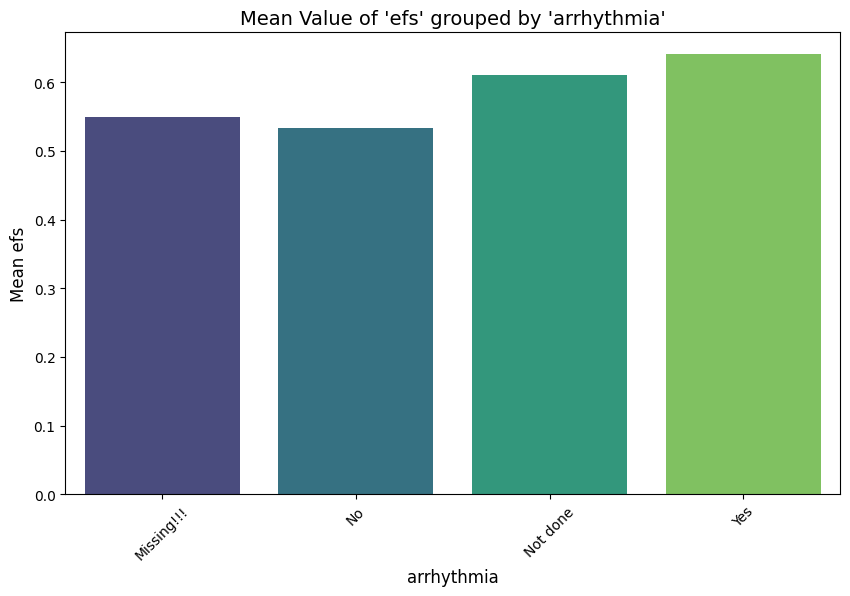

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


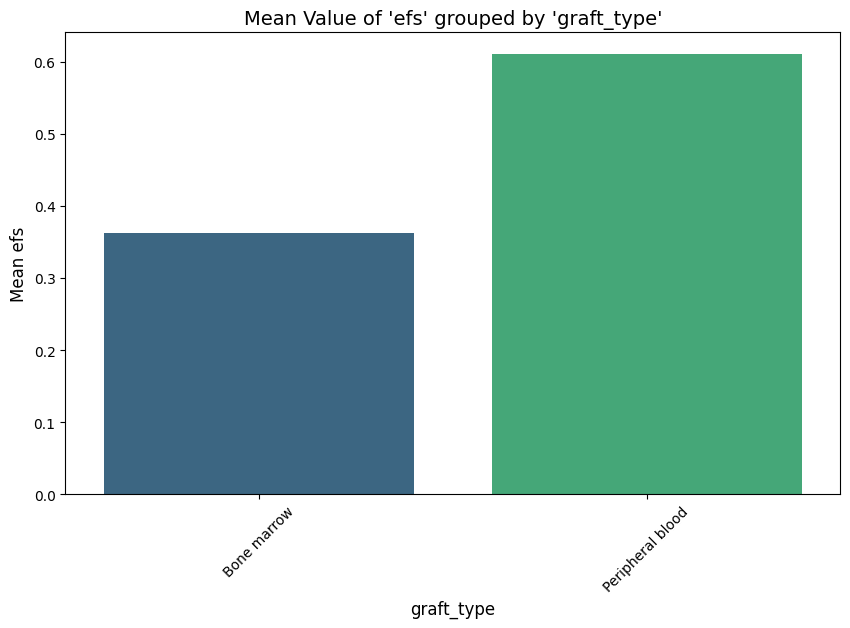

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


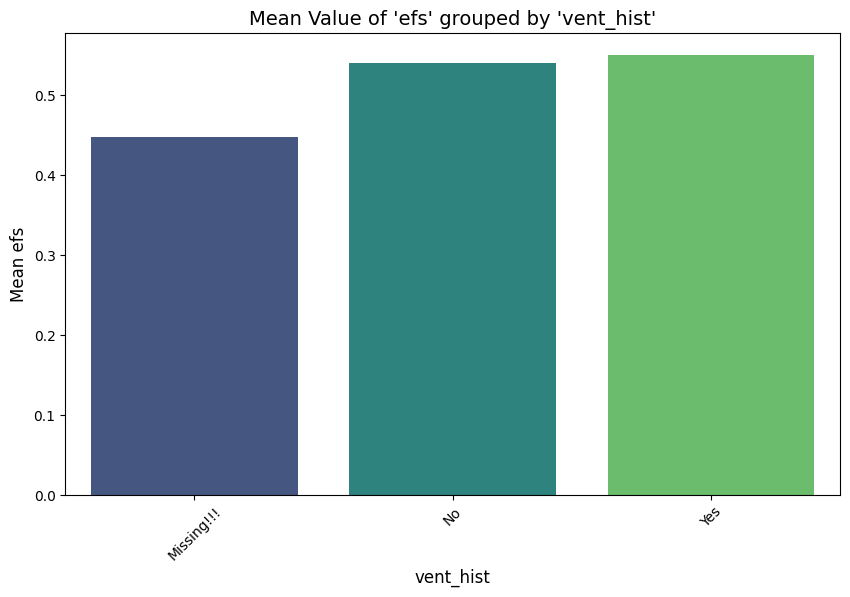

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


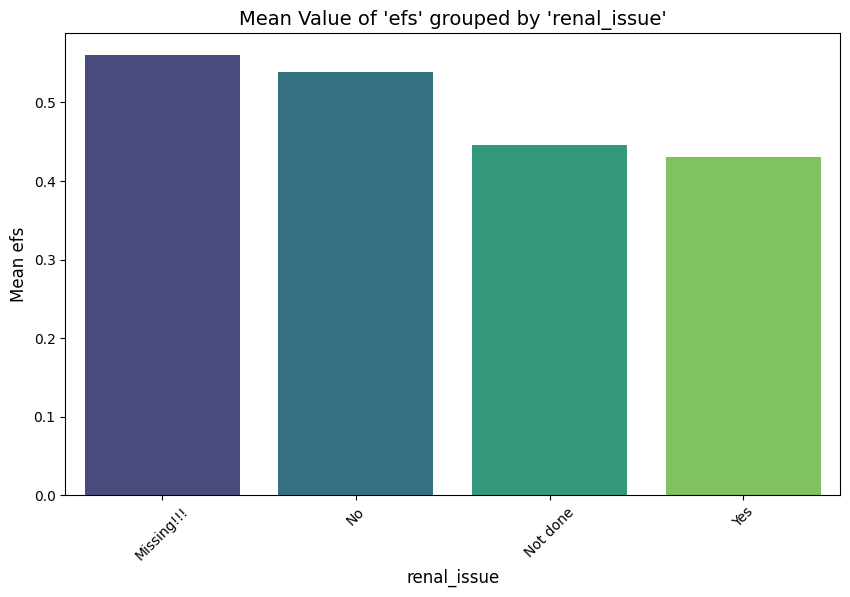

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


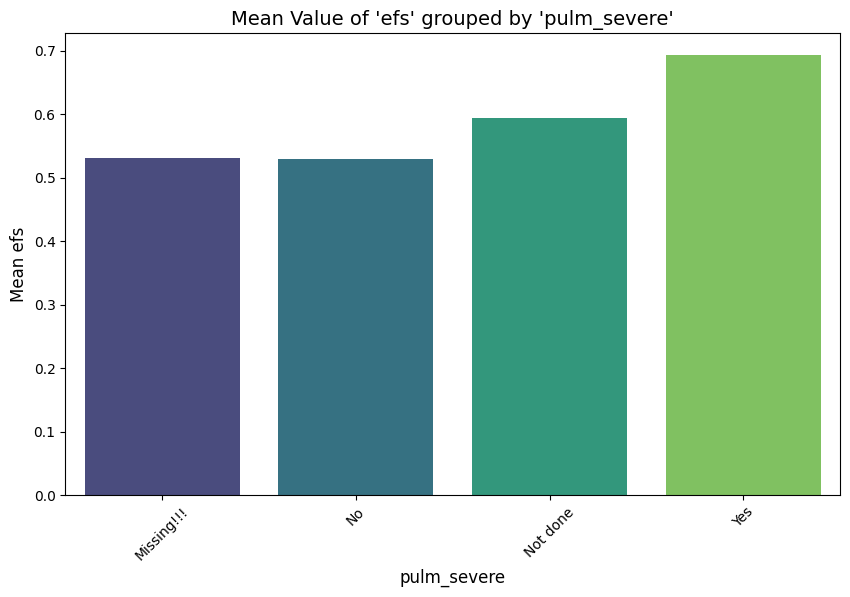

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


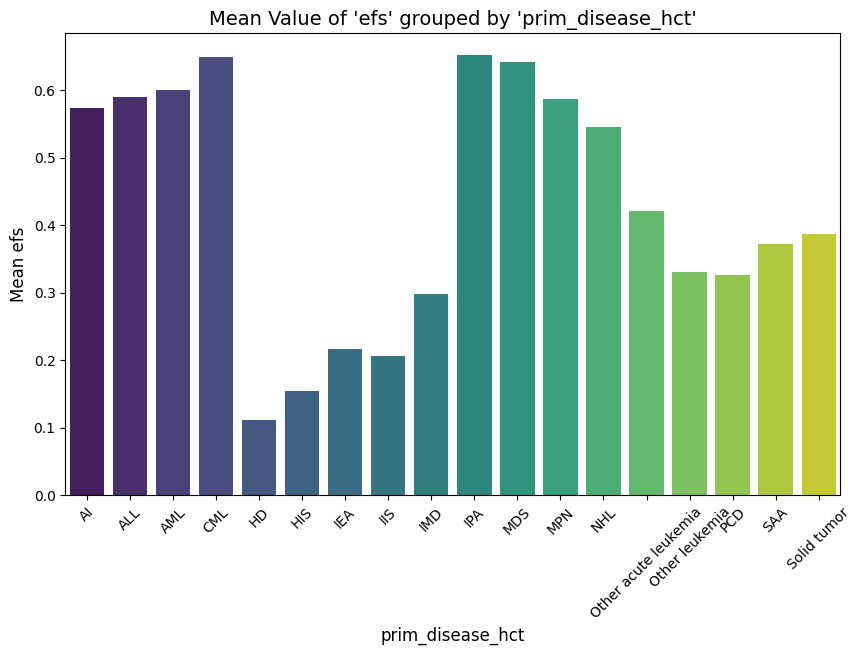

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


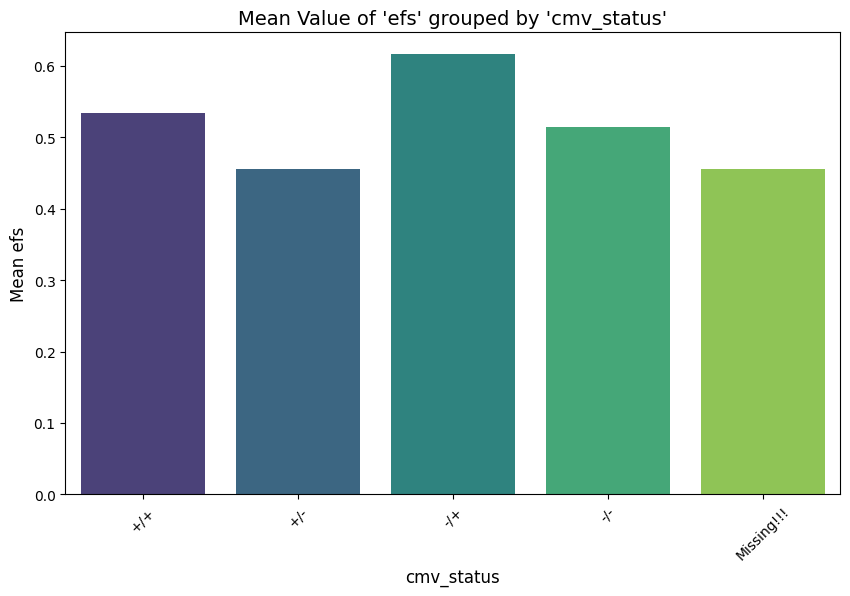

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


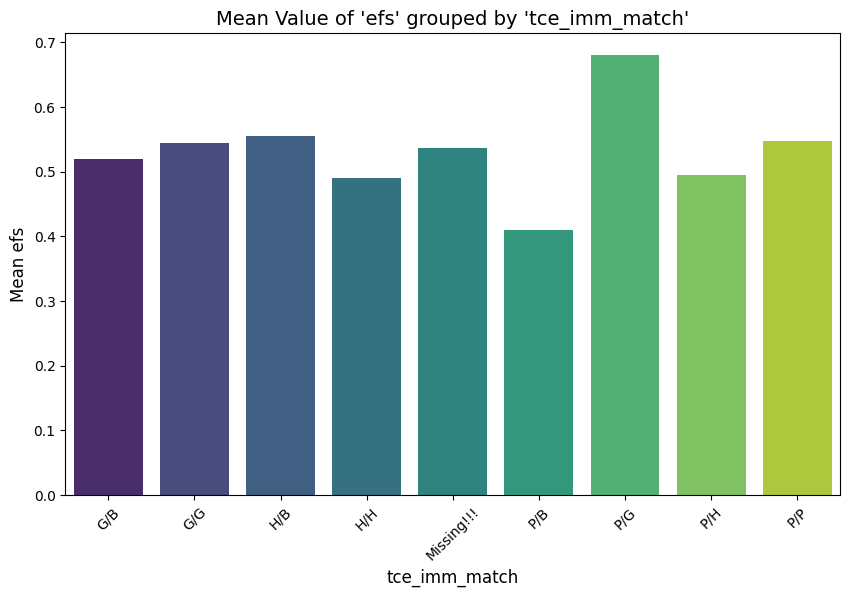

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


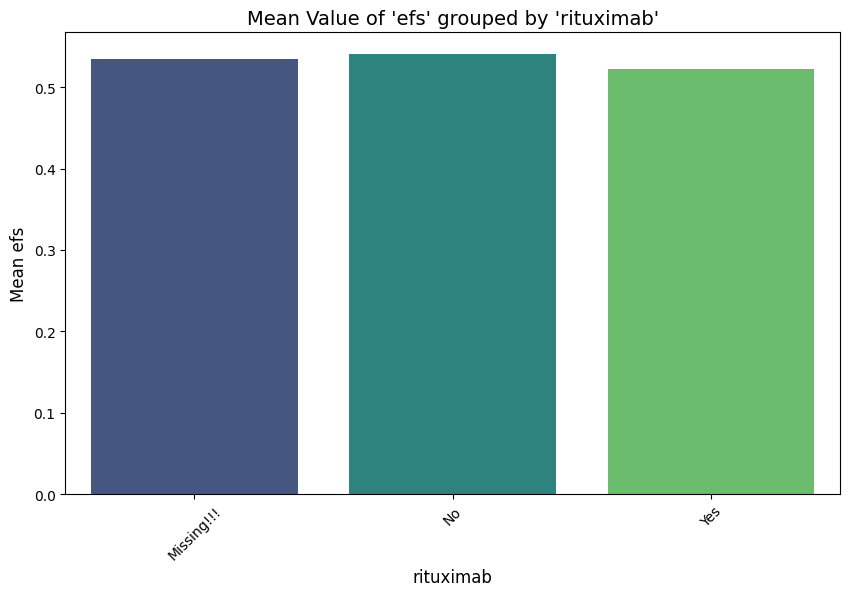

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


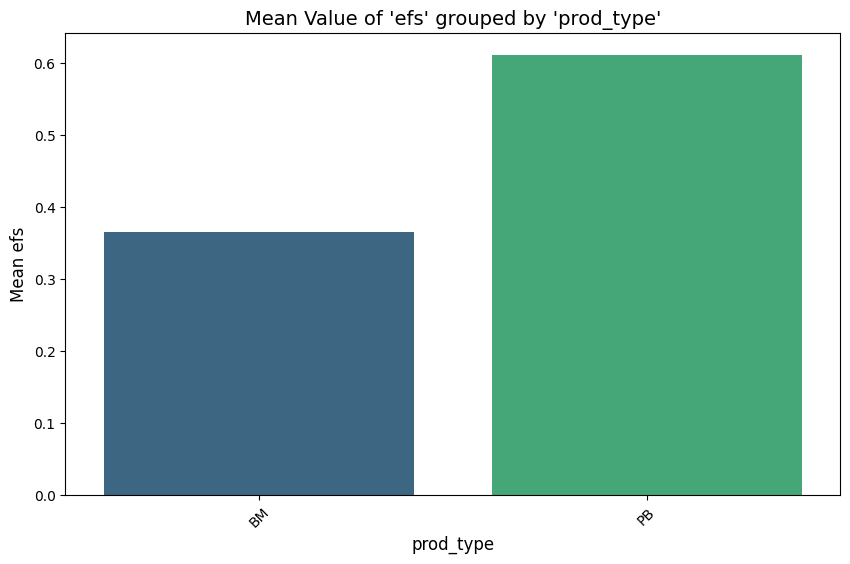

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


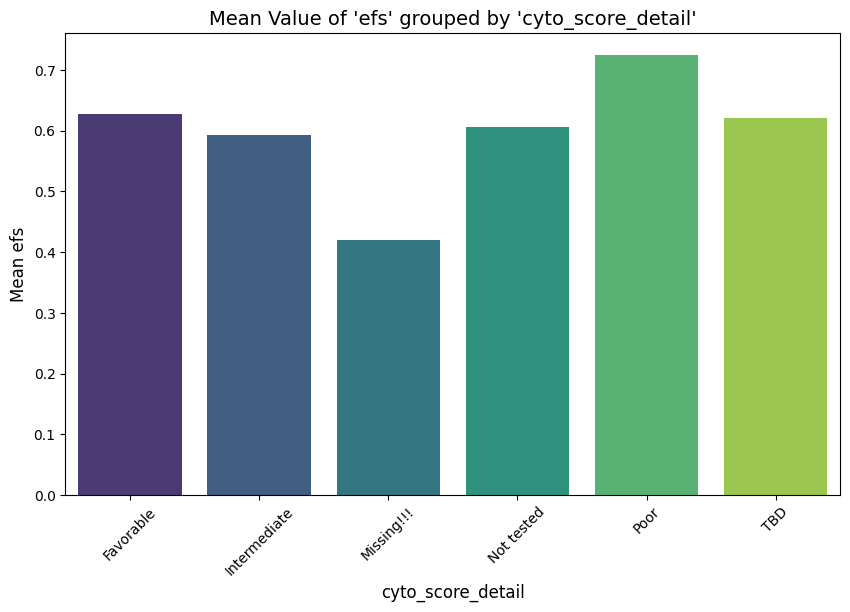

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


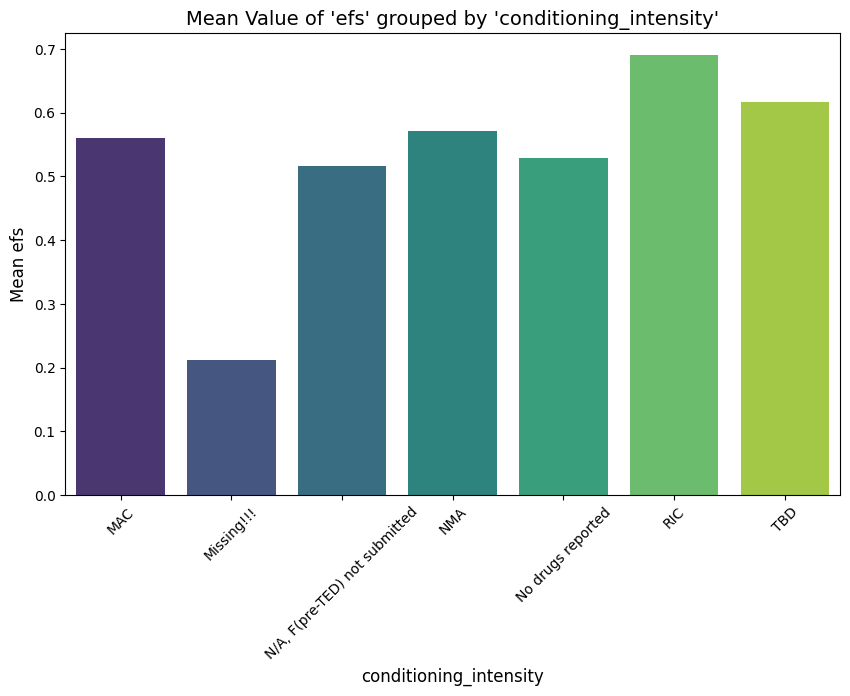

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


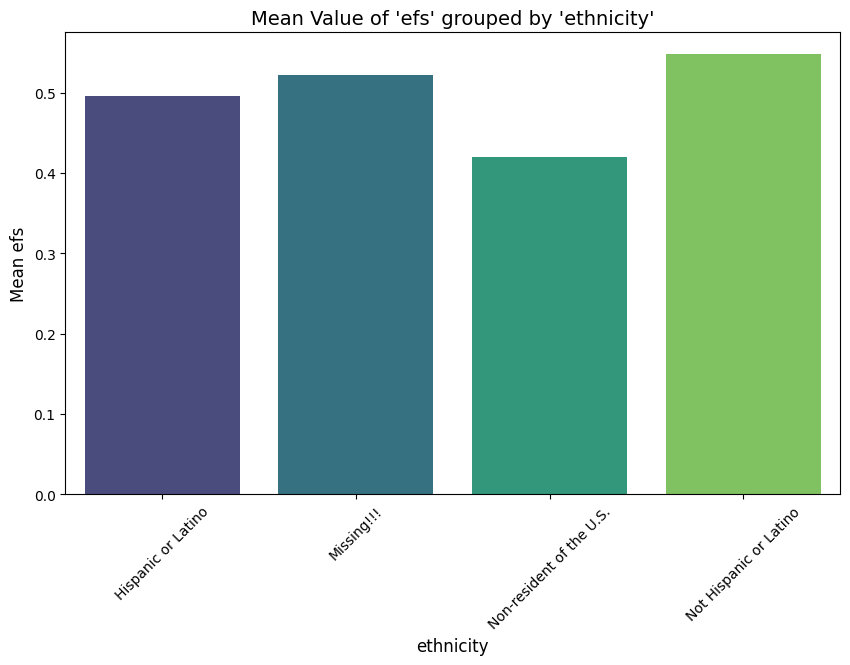

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


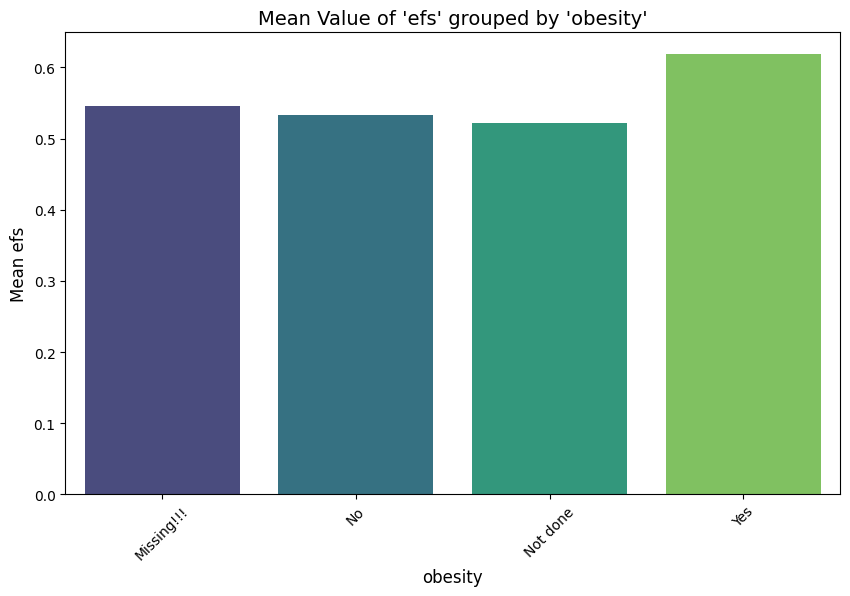

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


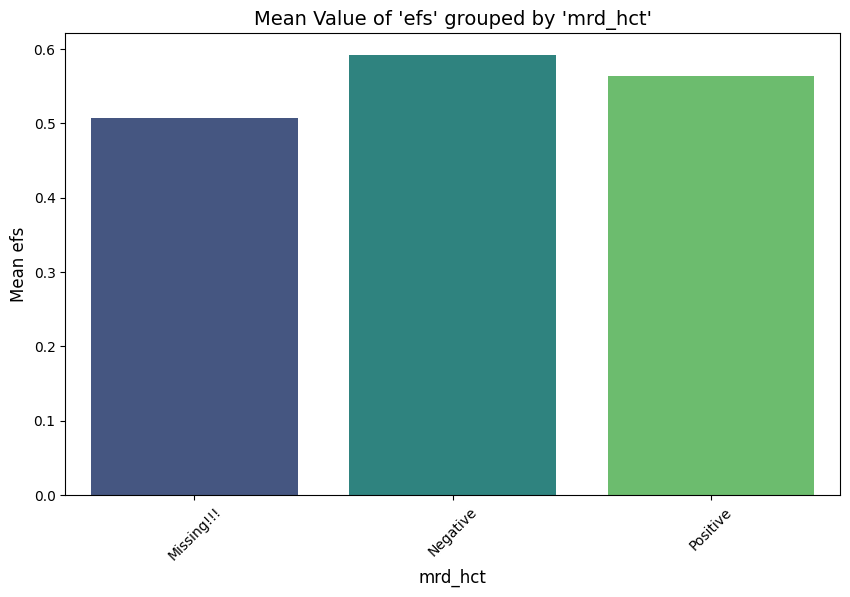

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


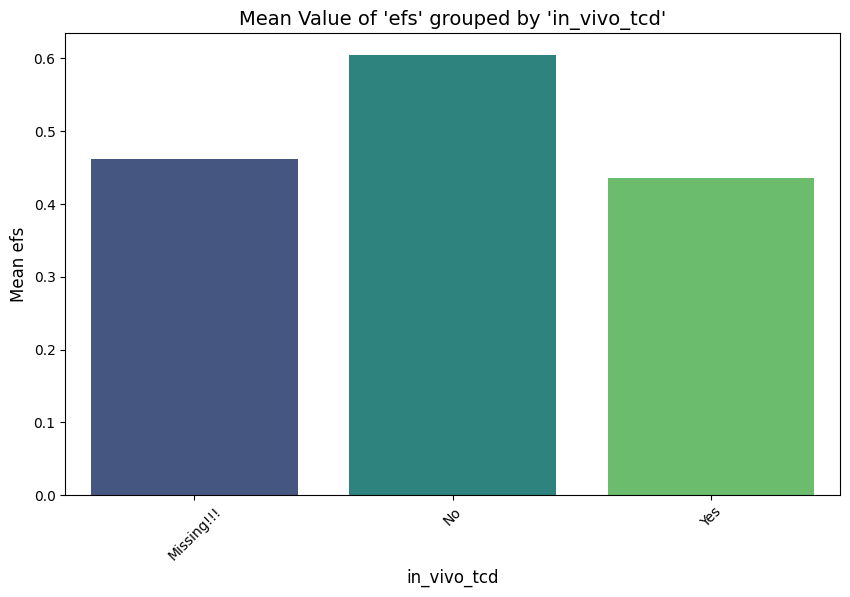

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


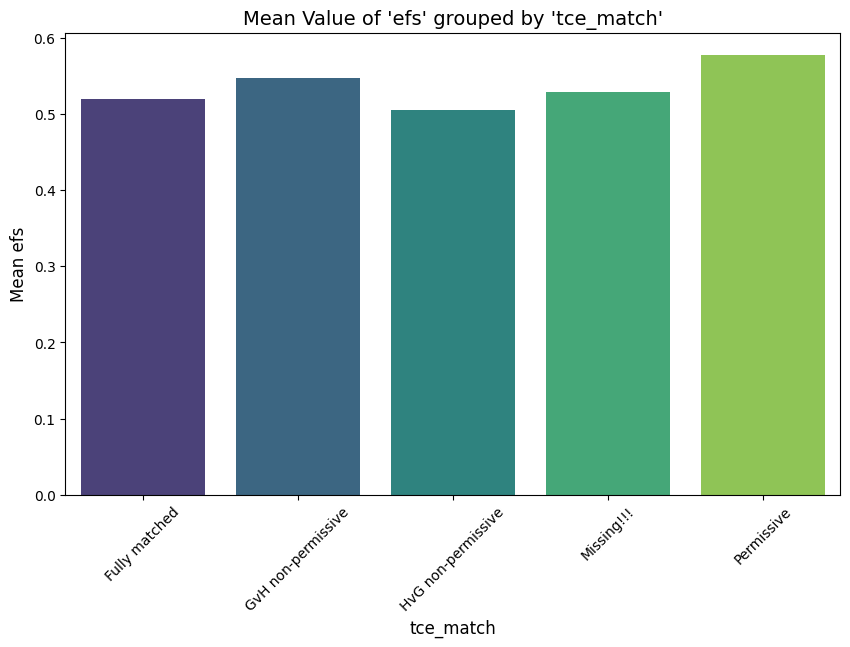

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


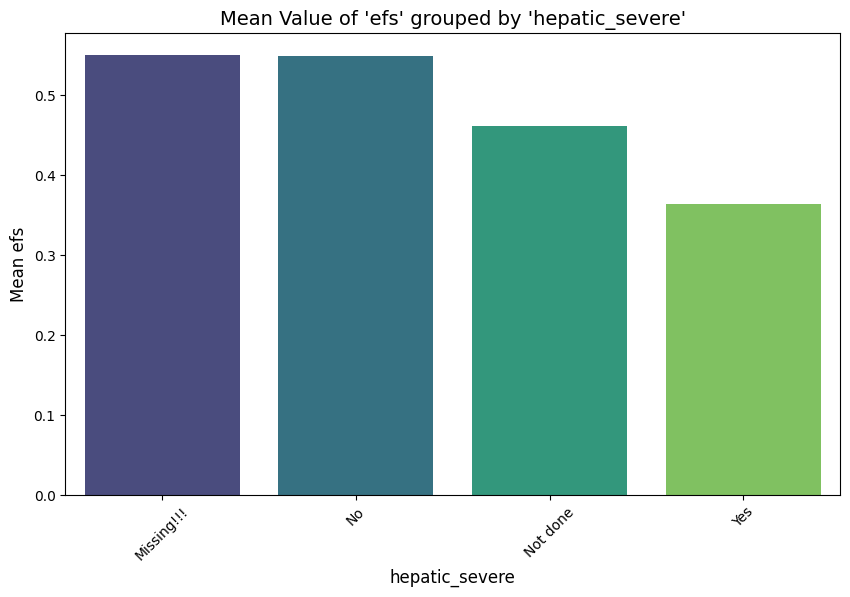

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


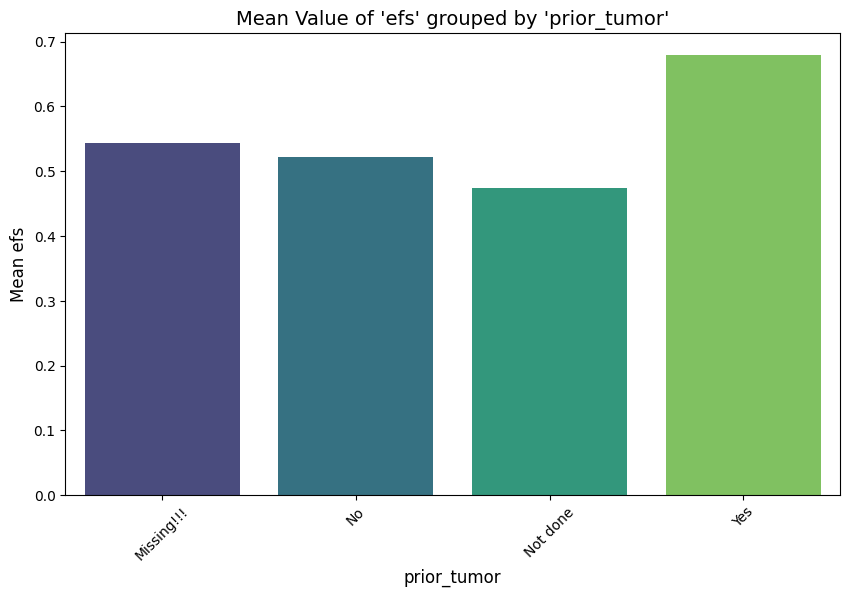

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


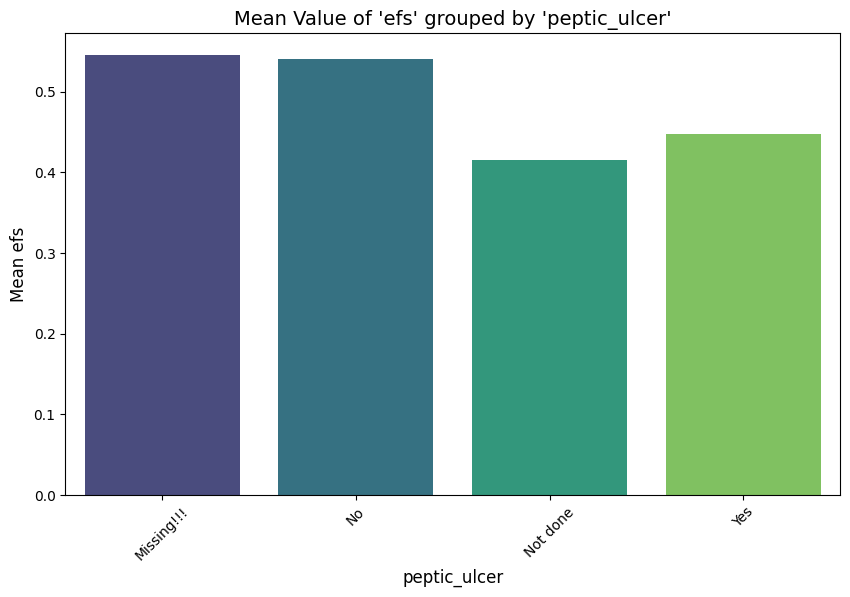

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


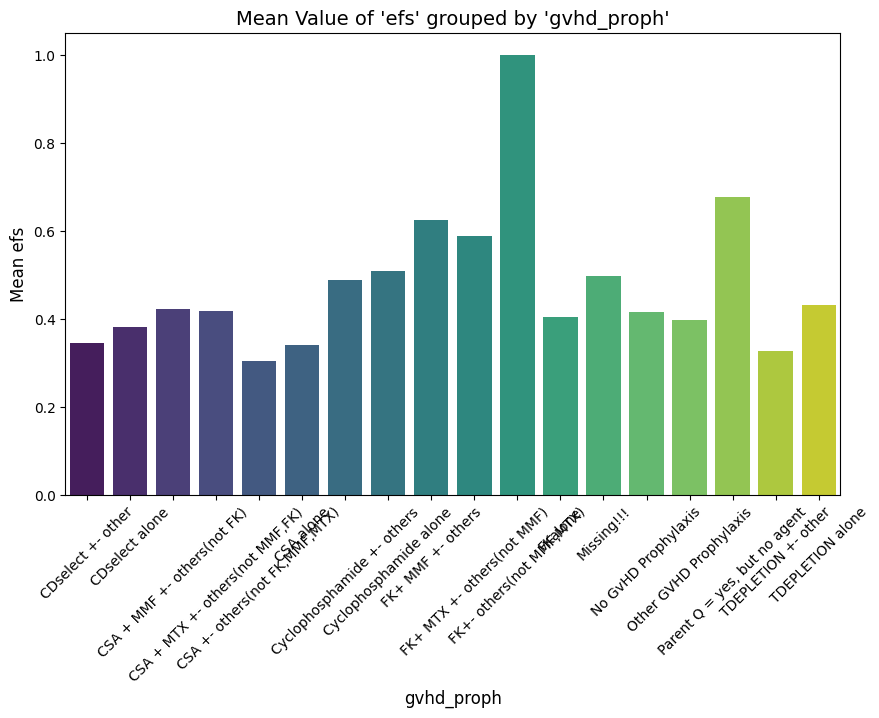

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


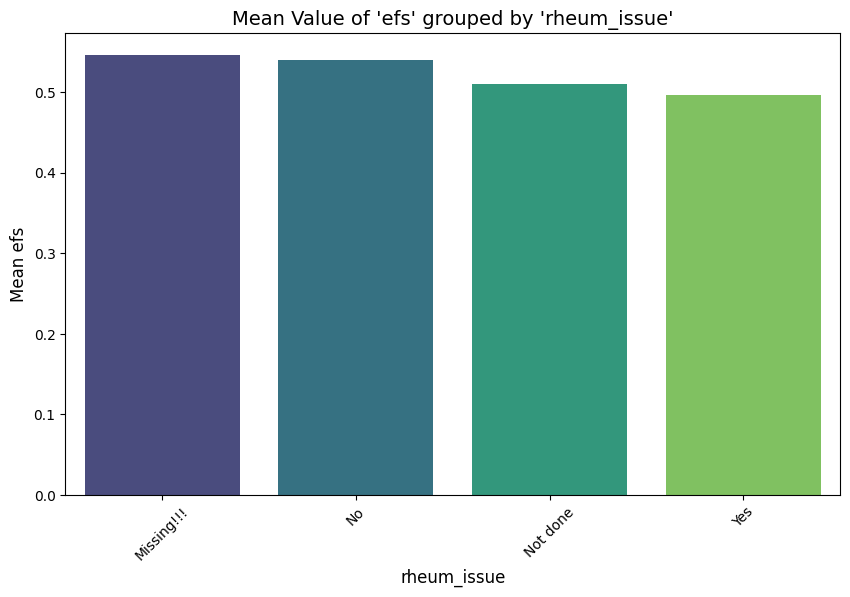

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


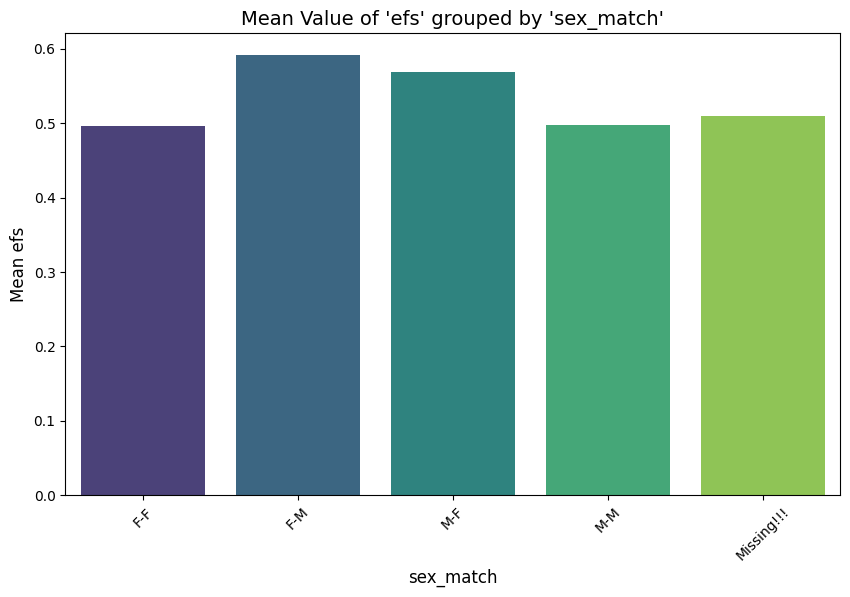

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


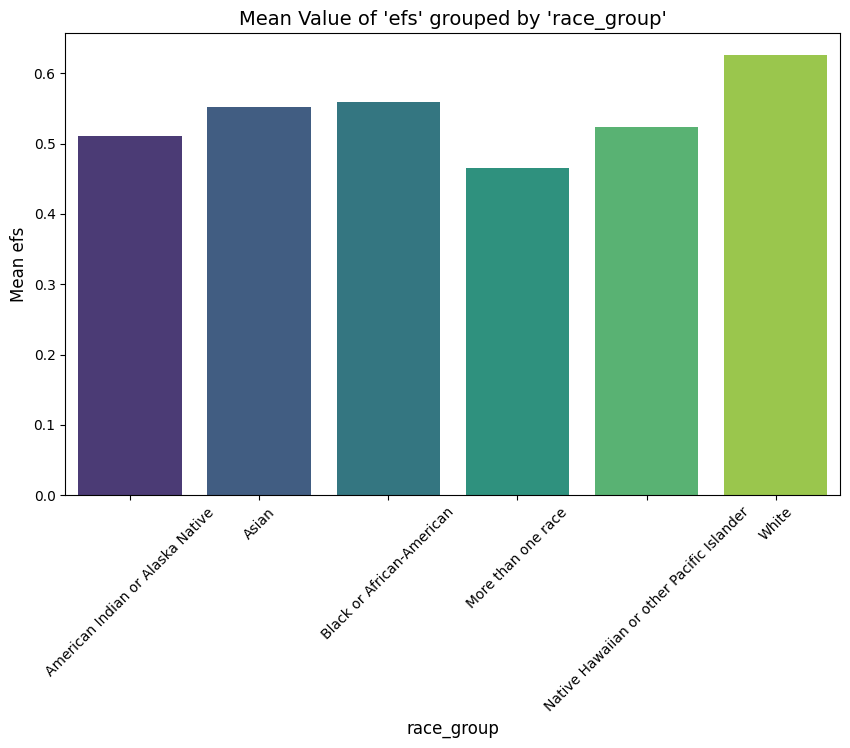

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


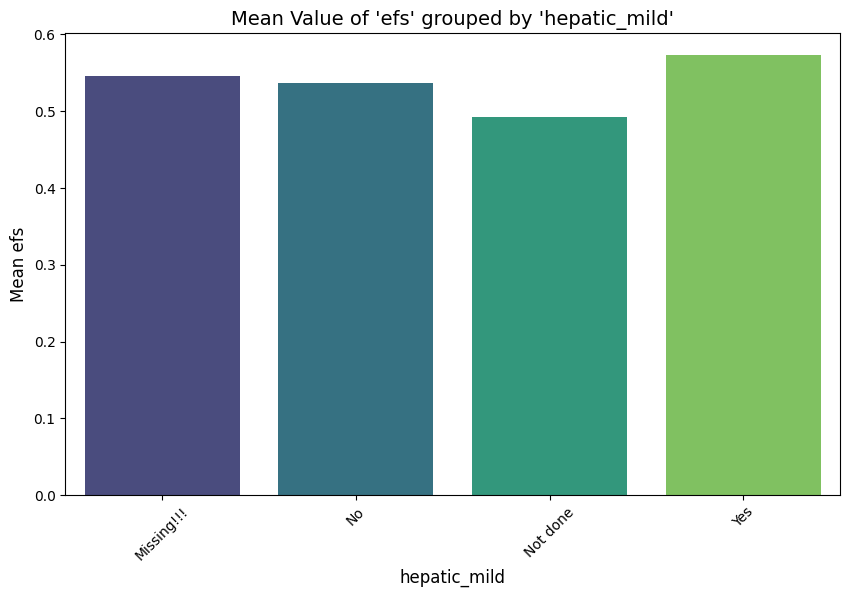

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


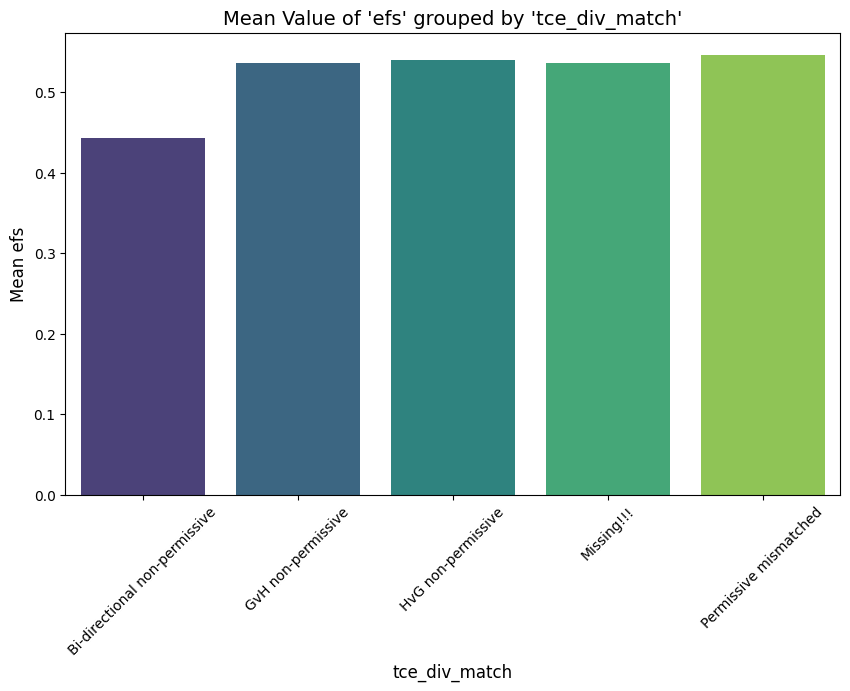

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


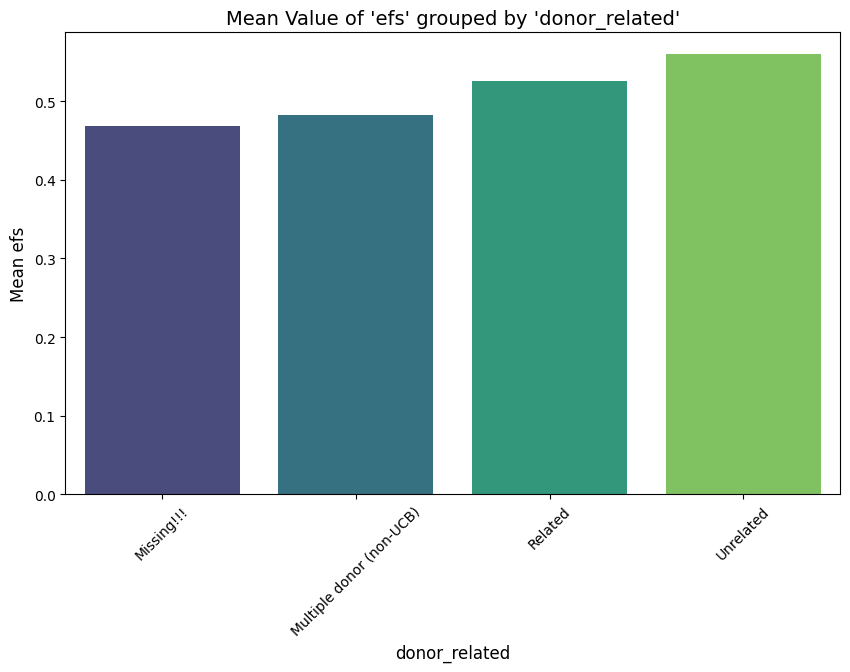

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


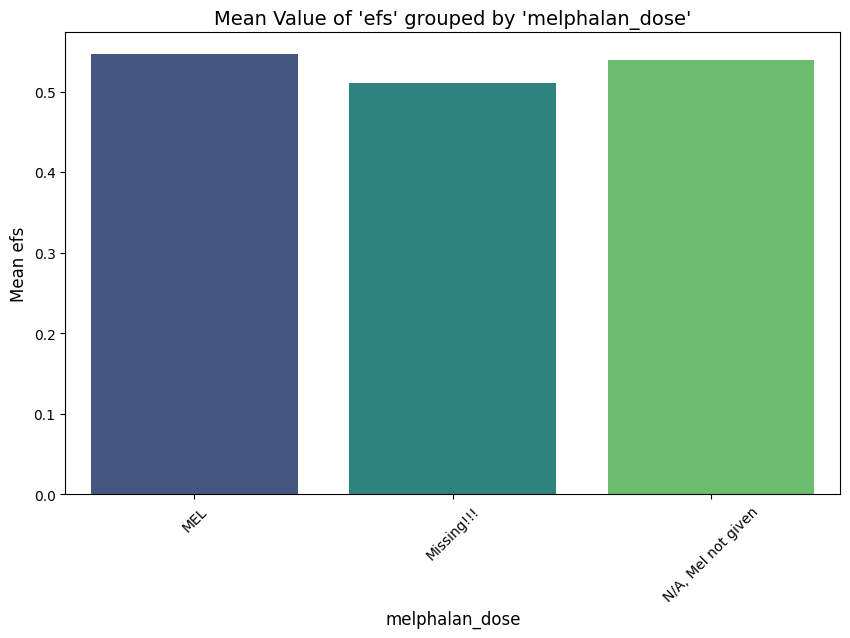

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


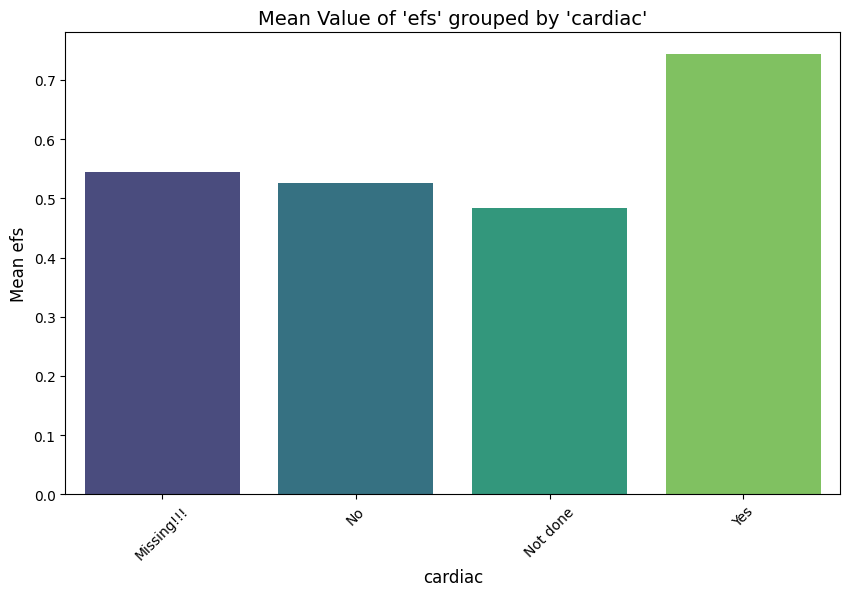

<ipython-input-70-55b6f530ceea>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')


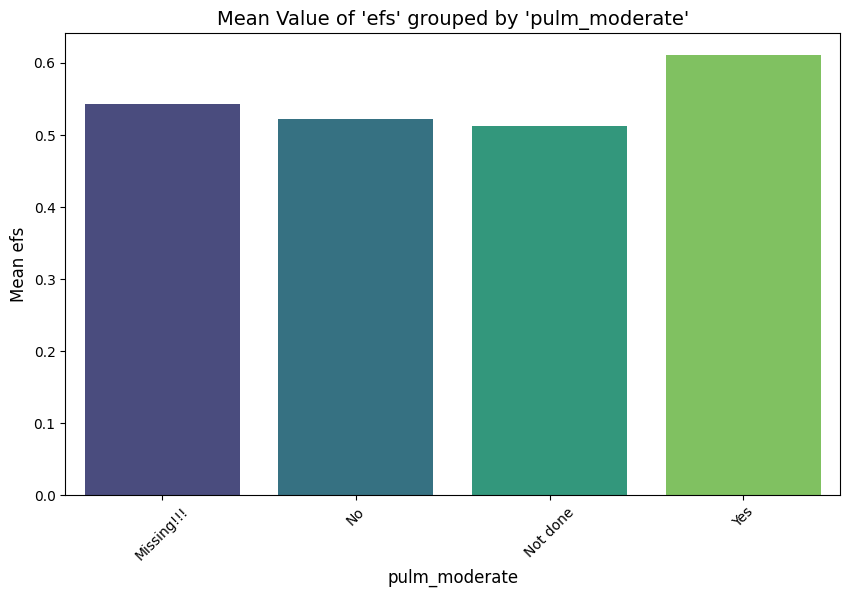

In [ ]:
for col in cat_cols:
    plt.figure(figsize=(10, 6))

    # Calculate mean of target for each category
    mean_target = train.fillna('Missing!!!').groupby(col)[target].mean()

    # Plot mean target values for each category
    sns.barplot(x=mean_target.index, y=mean_target.values, palette='viridis')

    plt.title(f"Mean Value of '{target}' grouped by '{col}'", fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel(f"Mean {target}", fontsize=12)
    plt.xticks(rotation=45)  # Rotate x-axis labels if needed
    plt.show()

In [ ]:
from sklearn.feature_selection import mutual_info_classif

# Encode categorical columns
cat_cols = train.select_dtypes(include='object').columns
encoded_data = pd.get_dummies(train[cat_cols], drop_first=True)

# Compute mutual information
mi_scores = mutual_info_classif(encoded_data, train[target], discrete_features=True)

# Display results
mi_scores_df = pd.DataFrame({'Feature': encoded_data.columns, 'Mutual Information': mi_scores})
mi_scores_df.sort_values(by='Mutual Information', ascending=False)


,Feature,Mutual Information
29,graft_type_Peripheral blood,2.522502e-02
63,prod_type_PB,2.509773e-02
71,conditioning_intensity_RIC,1.718551e-02
78,in_vivo_tcd_Yes,1.316590e-02
40,prim_disease_hct_IEA,1.158905e-02
...,...,...
121,"melphalan_dose_N/A, Mel not given",7.230809e-07
70,conditioning_intensity_No drugs reported,6.805448e-07
23,"tbi_status_TBI +- Other, -cGy, unknown dose",3.245436e-07
4,dri_score_Missing disease status,1.664322e-07


In [ ]:
from scipy.stats import chi2_contingency

chi2_scores = {}
for col in cat_cols:
    contingency_table = pd.crosstab(train[col], train[target])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    chi2_scores[col] = p  # Store the p-value

# Convert to DataFrame and sort
chi2_scores_df = pd.DataFrame.from_dict(chi2_scores, orient='index', columns=['p-value'])
chi2_scores_df.sort_values(by='p-value')

,p-value
dri_score,0.000000e+00
graft_type,0.000000e+00
prim_disease_hct,0.000000e+00
prod_type,0.000000e+00
gvhd_proph,4.441921e-176
in_vivo_tcd,2.295911e-169
conditioning_intensity,8.244813e-75
cmv_status,2.996207e-63
cardiac,6.735537e-60
prior_tumor,1.639214e-59


In [ ]:
for col in cat_cols:
    missing_data = train[train[col].isnull()][target]
    non_missing_data = train[train[col].notnull()][target]

    # Compare mean/median of the target
    print(f"Target mean for missing {col}: {missing_data.mean()}")
    print(f"Target mean for non-missing {col}: {non_missing_data.mean()}")

Target mean for missing dri_score: 0.42857142857142855
Target mean for non-missing dri_score: 0.5399008587586399
Target mean for missing psych_disturb: 0.5678952473326867
Target mean for non-missing psych_disturb: 0.5371007554790934
Target mean for missing cyto_score: 0.36576598909271196
Target mean for non-missing cyto_score: 0.6068396681458614
Target mean for missing diabetes: 0.5507314771118452
Target mean for non-missing diabetes: 0.5383981110153293
Target mean for missing tbi_status: nan
Target mean for non-missing tbi_status: 0.5393055555555556
Target mean for missing arrhythmia: 0.5499545867393278
Target mean for non-missing arrhythmia: 0.538423941649748
Target mean for missing graft_type: nan
Target mean for non-missing graft_type: 0.5393055555555556
Target mean for missing vent_hist: 0.44787644787644787
Target mean for non-missing vent_hist: 0.5401352440348972
Target mean for missing renal_issue: 0.5603133159268929
Target mean for non-missing renal_issue: 0.537809187279152
Tar

## Custom Scoring

In [ ]:
class ParticipantVisibleError(Exception):
    pass

def score(solution: pd.DataFrame, submission: pd.DataFrame, row_id_column_name: str) -> float:
    """
    >>> import pandas as pd
    >>> row_id_column_name = "id"
    >>> y_pred = {'prediction': {0: 1.0, 1: 0.0, 2: 1.0}}
    >>> y_pred = pd.DataFrame(y_pred)
    >>> y_pred.insert(0, row_id_column_name, range(len(y_pred)))
    >>> y_true = { 'efs': {0: 1.0, 1: 0.0, 2: 0.0}, 'efs_time': {0: 25.1234,1: 250.1234,2: 2500.1234}, 'race_group': {0: 'race_group_1', 1: 'race_group_1', 2: 'race_group_1'}}
    >>> y_true = pd.DataFrame(y_true)
    >>> y_true.insert(0, row_id_column_name, range(len(y_true)))
    >>> score(y_true.copy(), y_pred.copy(), row_id_column_name)
    0.75
    """

    del solution[row_id_column_name]
    del submission[row_id_column_name]

    event_label = 'efs'
    interval_label = 'efs_time'
    prediction_label = 'prediction'
    for col in submission.columns:
        if not pandas.api.types.is_numeric_dtype(submission[col]):
            raise ParticipantVisibleError(f'Submission column {col} must be a number')
    # Merging solution and submission dfs on ID
    merged_df = pd.concat([solution, submission], axis=1)
    merged_df.reset_index(inplace=True)
    merged_df_race_dict = dict(merged_df.groupby(['race_group']).groups)
    metric_list = []
    for race in merged_df_race_dict.keys():
        # Retrieving values from y_test based on index
        indices = sorted(merged_df_race_dict[race])
        merged_df_race = merged_df.iloc[indices]
        # Calculate the concordance index
        c_index_race = concordance_index(
                        merged_df_race[interval_label],
                        -merged_df_race[prediction_label],
                        merged_df_race[event_label])
        metric_list.append(c_index_race)
    return float(np.mean(metric_list)-np.sqrt(np.var(metric_list)))

## MIT Prep

In [ ]:
val_set =  pd.concat([train.dropna().sample(int(.2* train.dropna().shape[0]),random_state = rs),
                      train[train.isna().any(axis = 1)].sample(int(.2*train[train.isna().any(axis = 1)].shape[0]), random_state = rs)])
remaining_indices = train.index.difference(val_set.index)
mit = train.loc[remaining_indices]
new_target = 'target'#'y'

def c_score(y_pred):
  row_id_column_name = "id"
  y_pred2 = pd.DataFrame({
      'id': val_set.index,
      'prediction':y_pred[:, 1]
  })
  y_pred2.index = y_pred2.id
  y_true = val_set[['efs', 'efs_time', 'race_group']]
  y_true.insert(0, row_id_column_name, y_true.index.tolist())
  return score(y_true.copy(), y_pred2.copy(), row_id_column_name)

In [ ]:
# mit = mit[test.columns.tolist()+ [target]]
# val_set = val_set[test.columns.tolist()+ [target]]

<Axes: >

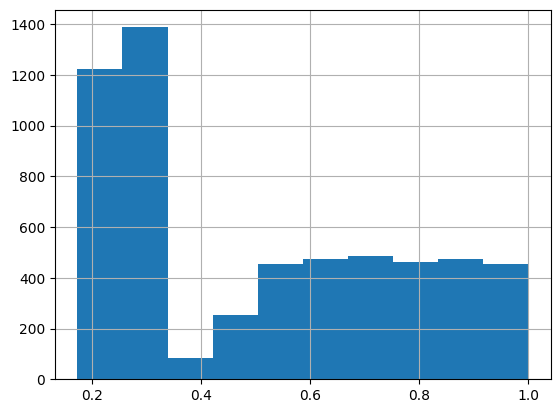

In [ ]:
val_set[new_target].hist()

## LogReg
LogReg Base: 0.6366133903062684 (Score: 0.647)

LogReg Hyperparam: 0.6382858658489742 (Score: 0.648)

LogReg Hyperparam (feat eng): 0.6383587725957318 (Score: 0.649)

LogReg Hyperparam (median): 0.6398505309569426 (Score: 0.650)

LogReg Hyperparam (standard): 0.6409461539231194 (Score: 0.653)

LogRed new feats: 0.6410368700977117 (Score: 0.653)

In [ ]:
# class TargetEncoder(BaseEstimator, TransformerMixin):
#     def __init__(self, n_splits=5, smoothing=1):
#         self.n_splits = n_splits
#         self.smoothing = smoothing
#         self.mapping = {}
#         self.global_mean = None  # To handle unseen categories

#     def fit(self, X, y):
#         X = pd.DataFrame(X)  # Convert to DataFrame for ease of processing
#         y = pd.Series(y)  # Ensure `y` is a Series
#         self.global_mean = y.mean()  # Save global mean for unseen categories
#         self.mapping = {}
#         for col in X.columns:
#             col_mapping = X[col].map(y.groupby(X[col]).mean())
#             counts = X[col].map(X[col].value_counts())
#             smoothed = (counts * col_mapping + self.smoothing * self.global_mean) / (counts + self.smoothing)
#             self.mapping[col] = smoothed
#         return self

#     def transform(self, X):
#         X = pd.DataFrame(X)  # Convert to DataFrame for ease of processing
#         X_transformed = X.copy()
#         for col in X.columns:
#             X_transformed[col] = X[col].map(self.mapping[col]).fillna(self.global_mean)  # Use global mean for unseen categories
#         return X_transformed.fillna(X_transformed.mean()).to_numpy()

# Define numerical and categorical columns
numerical_cols = test.select_dtypes(exclude = ['object', 'category'] ).columns.tolist()
#  ['hla_match_c_high', 'hla_high_res_8', 'hla_low_res_6', 'hla_high_res_6',
#        'hla_high_res_10', 'hla_match_dqb1_high', 'hla_nmdp_6',
#        'hla_match_c_low', 'hla_match_drb1_low', 'hla_match_dqb1_low',
#        'year_hct', 'hla_match_a_high', 'donor_age', 'hla_match_b_low',
#        'age_at_hct', 'hla_match_a_low', 'hla_match_b_high',
#        'comorbidity_score', 'karnofsky_score', 'hla_low_res_8',
#        'hla_match_drb1_high', 'hla_low_res_10']

categorical_cols = test.select_dtypes(include = ['object', 'category'] ).columns.tolist()

  # ['dri_score', 'psych_disturb', 'cyto_score', 'diabetes', 'tbi_status',
  #      'arrhythmia', 'graft_type', 'vent_hist', 'renal_issue', 'pulm_severe',
  #      'prim_disease_hct', 'cmv_status', 'tce_imm_match', 'rituximab',
  #      'prod_type', 'cyto_score_detail', 'conditioning_intensity', 'ethnicity',
  #      'obesity', 'mrd_hct', 'in_vivo_tcd', 'tce_match', 'hepatic_severe',
  #      'prior_tumor', 'peptic_ulcer', 'gvhd_proph', 'rheum_issue', 'sex_match',
  #      'race_group', 'hepatic_mild', 'tce_div_match', 'donor_related',
  #      'melphalan_dose', 'cardiac', 'pulm_moderate']

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),  # SimpleImputer(strategy='constant', fill_value=-1)
    ('scaler', StandardScaler())  # Standardize numerical features
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# categorical_transformer = Pipeline(steps=[
#     ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),  # Handle missing values
#     ('target_encoder', TargetEncoder())  # Apply target encoding
# ])

# Combine preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# Define the full pipeline
log_reg_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(max_iter=10000, random_state=rs,
                                    C=0.1,  class_weight= 'balanced',solver='lbfgs' ,
                                      penalty='l2'))
])



# Fit the pipeline on training data
X_train = mit.drop(columns=[target, 'efs_time'])  # Features
y_train = mit[target]                # Target variable

log_reg_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['hla_match_c_high',
                                                   'hla_high_res_8',
                                                   'hla_low_res_6',
                                                   'hla_high_res_6',
                                                   'hla_high_res_10',
                                                   'hla_match_dqb1_high',
                                                   'hla_nmdp_6',
                                                   'hla_match_c_low',
                                                   'hla_match_drb1_low',
                                                   'hla_match_dqb1_low',
                                                   'year...
                                                   'tce_imm_match', 'rituximab',
                                                   'prod_type',
                                                   'cyto_score_detail',
                                                   'conditioning_intensity',
                                                   'ethnicity', 'obesity',
                                                   'mrd_hct', 'in_vivo_tcd',
                                                   'tce_match',
                                                   'hepatic_severe',
                                                   'prior_tumor',
                                                   'peptic_ulcer', 'gvhd_proph',
                                                   'rheum_issue', 'sex_match',
                                                   'race_group', 'hepatic_mild', ...])])),
                ('classifier',
                 LogisticRegression(C=0.1, class_weight='balanced',
                                    max_iter=10000, random_state=30))])

In [ ]:
# Predict on validation set
X_val = val_set.drop(columns=[target])
y_val = val_set[target]
y_pred_log_reg = log_reg_pipeline.predict_proba(X_val)

/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


In [ ]:
c_score(y_pred_log_reg)

0.5908821250027473

In [ ]:
c_score(y_pred_log_reg) # standard scaler new feats

0.6410368700977117

In [ ]:
c_score(y_pred) # standard

0.6409461539231194

In [ ]:
c_score(y_pred)

0.631923240743867

### GS

In [ ]:
# # Define parameter grid for Logistic Regression
# param_grid = {
#     'classifier__penalty': ['l1', 'l2', 'elasticnet', 'none'],  # Regularization types
#     'classifier__C': [0.01, 0.1, 1, 10, 100],                  # Inverse of regularization strength
#     'classifier__solver': ['saga', 'lbfgs'],                   # Solvers supporting l1 or l2
#     'classifier__class_weight': [None, 'balanced']             # Handle imbalanced data
# }

# # Create GridSearchCV object
# grid_search = GridSearchCV(estimator=log_reg_pipeline,
#                            param_grid=param_grid,
#                            cv=5,              # 5-fold cross-validation
#                            scoring='roc_auc', # Adjust scoring metric as needed
#                            n_jobs=-1,         # Use all available cores
#                            verbose=2)

# # Perform grid search
# grid_search.fit(X_train, y_train)

# # Get best parameters and best score
# best_params = grid_search.best_params_
# best_score = grid_search.best_score_

# print("Best parameters:", best_params)
# print("Best ROC AUC score:", best_score)

Fitting 5 folds for each of 80 candidates, totalling 400 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
250 fits failed out of a total of 400.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
50 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 660, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "/usr/local/lib/py

Best parameters: {'classifier__C': 0.1, 'classifier__class_weight': 'balanced', 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs'}
Best ROC AUC score: 0.7403530100627809


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# output_file = "/content/drive/MyDrive/Output/best_parameters.txt"
# with open(output_file, "w") as file:
#     file.write("Best parameters:\n")
#     file.write(str(grid_search.best_params_))

# print(f"Best parameters saved to {output_file}")

Best parameters saved to /content/drive/MyDrive/Output/best_parameters.txt


In [ ]:
# Predict on validation set
X_val = val_set.drop(columns=[target])
y_val = val_set[target]
y_pred_grid_search = log_reg_pipeline.predict_proba(X_val)

### RFE

In [ ]:
# Use RFECV for automatic selection of the optimal number of features
rfecv = RFECV(
    estimator=LogisticRegression(
        max_iter=10000, random_state=rs, C=0.1, class_weight='balanced', solver='lbfgs', penalty='l2'
    ),
    step=1,  # Remove one feature at a time
    cv=StratifiedKFold(n_splits=5),  # Stratified k-fold cross-validation
    scoring='roc_auc',  # Use ROC AUC as the scoring metric
    min_features_to_select=25  # Ensure at least one feature is selected
)

# Fit RFECV on the training data within a pipeline
rfecv_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('feature_selector', rfecv)
])

rfecv_pipeline.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Optimal number of features: 213


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


AttributeError: 'RFECV' object has no attribute 'named_steps'

In [ ]:
 rfecv.ranking_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [ ]:
# Get the optimal number of features
optimal_num_features = rfecv.n_features_
print(f"Optimal number of features: {optimal_num_features}")

# # Get the ranking of all features
# feature_ranking = rfecv.named_steps['feature_selector'].ranking_
# print("Feature rankings:", feature_ranking)

# Plot the RFECV scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross-validation score (AUC)")
plt.plot(range(25, len(rfecv.grid_scores_) + 25), rfecv.grid_scores_)
plt.show()

# Retrieve the selected features
selected_features = X_train.columns[rfecv.support_]
print("Selected features:", selected_features)

AttributeError: 'Pipeline' object has no attribute 'n_features_'

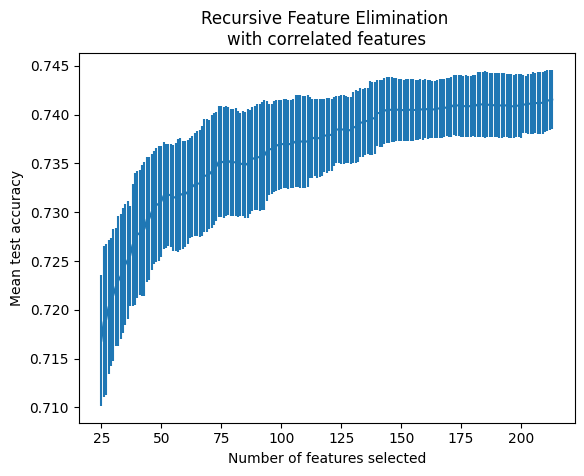

In [ ]:
cv_results = pd.DataFrame(rfecv.cv_results_)
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")
plt.errorbar(
    x=cv_results["n_features"],
    y=cv_results["mean_test_score"],
    yerr=cv_results["std_test_score"],
)
plt.title("Recursive Feature Elimination \nwith correlated features")
plt.show()

In [ ]:
# Predict on validation set
X_val = val_set.drop(columns=[target])
y_val = val_set[target]
y_pred_grid_search = rfecv_pipeline.predict_proba(X_val)

In [ ]:
c_score(y_pred)

0.6366133903062684

In [ ]:
c_score(y_pred)

0.6382858658489742

In [ ]:
c_score(y_pred_grid_search)

0.6382858658489742

## HGBG
1. Grid Search CV: 0.6353662016766036 (Score: 0.646)
2. Optuna: CV: 0.6415215548222094 (Score: 0.647)
3. New Regression: 0.6369838341495984 (Score: 0.674)

In [ ]:
class TargetEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, n_splits=5, smoothing=1):
        self.n_splits = n_splits
        self.smoothing = smoothing
        self.mapping = {}

    def fit(self, X, y):
        X = pd.DataFrame(X)  # Convert to DataFrame for ease of processing
        y = pd.Series(y)  # Ensure `y` is a Series
        self.mapping = {}
        for col in X.columns:
            global_mean = y.mean()
            col_mapping = X[col].map(y.groupby(X[col]).mean())
            counts = X[col].map(X[col].value_counts())
            # Apply smoothing
            smoothed = (counts * col_mapping + self.smoothing * global_mean) / (counts + self.smoothing)
            self.mapping[col] = smoothed
        return self

    def transform(self, X):
        X = pd.DataFrame(X)  # Convert to DataFrame for ease of processing
        X_transformed = X.copy()
        for col in X.columns:
            X_transformed[col] = X[col].map(self.mapping[col])
        return X_transformed.fillna(X_transformed.mean()).to_numpy()  # Return as NumPy array


# Define numerical and categorical columns
numerical_cols = test.select_dtypes(exclude=['object', 'category']).columns.tolist()
categorical_cols = test.select_dtypes(include=['object', 'category']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),  # Handle missing values with median
    ('scaler', StandardScaler())  # Standardize numerical features
])

# Preprocessing for categorical data
# categorical_transformer = Pipeline(steps=[
#     ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),  # Handle missing values for categorical features
#     ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # One-hot encode categorical features (dense output)
# ])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),  # Handle missing values
    ('target_encoder', TargetEncoder())  # Apply target encoding
])


# Combine preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# Define the full pipeline with HistGradientBoostingClassifier
hist_gb_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
#     ('classifier', HistGradientBoostingClassifier(
#     max_iter=750,
#     max_depth=3,
#     learning_rate=0.0444935865580525,
#     min_samples_leaf=5,
#     l2_regularization=0.0003633387908368914,
#     max_bins=103,
#     random_state=rs
# ))
     ('regressor', HistGradientBoostingRegressor(
        max_iter=1500,
    max_depth=14,
    learning_rate=0.014340317671054315,
    min_samples_leaf=22,
    l2_regularization=0.01303970205459762,
    max_bins=85,
    random_state=rs
    ))

])

# Fit the pipeline on training data
X_train = mit.drop(columns=[new_target,target, 'efs_time'])  # Features
y_train = mit[new_target]  # Target variable

hist_gb_pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['hla_match_c_high',
                                                   'hla_high_res_8',
                                                   'hla_low_res_6',
                                                   'hla_high_res_6',
                                                   'hla_high_res_10',
                                                   'hla_match_dqb1_high',
                                                   'hla_nmdp_6',
                                                   'hla_match_c_low',
                                                   'hla_match_drb1_low',
                                                   'hla_match_dqb1_low',
                                                   'year...
                                                   'mrd_hct', 'in_vivo_tcd',
                                                   'tce_match',
                                                   'hepatic_severe',
                                                   'prior_tumor',
                                                   'peptic_ulcer', 'gvhd_proph',
                                                   'rheum_issue', 'sex_match',
                                                   'race_group', 'hepatic_mild', ...])])),
                ('regressor',
                 HistGradientBoostingRegressor(l2_regularization=0.01303970205459762,
                                               learning_rate=0.014340317671054315,
                                               max_bins=85, max_depth=14,
                                               max_iter=1500,
                                               min_samples_leaf=22,
                                               random_state=30))])

In [ ]:
# Predict on validation set
X_val = val_set.drop(columns=[target,new_target])
y_val = val_set[new_target]
# y_pred_hgb = hist_gb_pipeline.predict_proba(X_val)
y_pred_hgb = hist_gb_pipeline.predict(X_val)
y_pred_hgb= np.clip(y_pred_hgb, 0, 1)

/usr/local/lib/python3.11/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


In [ ]:
y_pred_hgb = np.column_stack((1 - y_pred_hgb, y_pred_hgb))

In [ ]:
c_score(y_pred_hgb)

0.6185594528787518

In [ ]:
c_score(y_pred_hgb)

0.6189903593677799

In [ ]:
c_score(y_pred_hgb) #og

0.6707758406694874

In [ ]:

# Retrieve the preprocessed training data
X_train_transformed = hist_gb_pipeline.named_steps['preprocessor'].transform(X_train)

# Compute permutation feature importance
perm_importance = permutation_importance(
    hist_gb_pipeline.named_steps['regressor'],
    X_train_transformed,
    y_train,
    n_repeats=10,  # Number of shuffles for permutation
    random_state=rs,
    scoring='neg_root_mean_squared_error'  # Use an appropriate regression metric
)

# Retrieve transformed feature names
numerical_feature_names = numerical_cols  # Numerical features
categorical_feature_names = hist_gb_pipeline.named_steps['preprocessor'] \
    .named_transformers_['cat'] \
    .named_steps['onehot'] \
    .get_feature_names_out(categorical_cols)  # One-hot encoded feature names

# Combine all feature names
all_feature_names = pd.Index(numerical_feature_names.tolist() + categorical_feature_names.tolist())

# Create a DataFrame for feature importances
feature_importances_df = pd.DataFrame({
    'Feature': all_feature_names,
    'Importance': perm_importance.importances_mean
}).sort_values(by='Importance', ascending=False)

# Display the top features
print(feature_importances_df.head(10))  # Top 10 features

In [ ]:
feature_importances_df

### Cleanlab

In [ ]:
X_train_preprocessed = pd.DataFrame(
    preprocessor.fit_transform(X_train),
    columns=(numerical_cols + preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_cols).tolist())
)
model = HistGradientBoostingRegressor(
        max_iter=1500,
    max_depth=11,
    learning_rate=0.04584557163854638,
    min_samples_leaf=50,
    l2_regularization=0.009199861210139822,
    max_bins=17,
    random_state=rs
    )

In [ ]:
# Cleanlab
cl = CleanLearning(model)
cl.fit(X_train_preprocessed, y_train)
label_issues = cl.get_label_issues()

In [ ]:
X_train

,dri_score,psych_disturb,cyto_score,diabetes,hla_match_c_high,hla_high_res_8,tbi_status,arrhythmia,hla_low_res_6,graft_type,...,cardiac,hla_match_drb1_high,pulm_moderate,hla_low_res_10,donor_age_group,donor_age_diff,hla_aggregate,hla_range,hla_c_to_drb1_ratio,hla_c_drb1_product
ID,,,,,,,,,,,,,,,,,,,,,
0,N/A - non-malignant indication,No,NaN,No,NaN,NaN,No TBI,No,6.0,Bone marrow,...,No,2.0,No,10.0,Missing,NaN,2.0,0.0,NaN,NaN
1,Intermediate,No,Intermediate,No,2.0,8.0,"TBI +- Other, >cGy",No,6.0,Peripheral blood,...,No,2.0,Yes,10.0,61-75,28.585,2.0,0.0,0.999995,4.0
2,N/A - non-malignant indication,No,NaN,No,2.0,8.0,No TBI,No,6.0,Bone marrow,...,No,2.0,No,10.0,Missing,NaN,2.0,0.0,0.999995,4.0
3,High,No,Intermediate,No,2.0,8.0,No TBI,No,6.0,Bone marrow,...,No,2.0,No,10.0,18-30,-14.015,2.0,0.0,0.999995,4.0
5,High,No,Poor,Yes,2.0,7.0,TBI + Cy +- Other,No,4.0,Peripheral blood,...,No,2.0,Yes,6.0,18-30,-4.869,2.0,0.0,0.999995,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28794,N/A - pediatric,No,NaN,No,2.0,8.0,No TBI,No,6.0,Peripheral blood,...,No,2.0,No,10.0,18-30,-40.832,2.0,0.0,0.999995,4.0
28795,Intermediate - TED AML case <missing cytogenetics,NaN,Favorable,No,2.0,8.0,No TBI,No,6.0,Peripheral blood,...,NaN,2.0,No,10.0,18-30,-26.924,2.0,0.0,0.999995,4.0
28796,High,No,Poor,Yes,1.0,4.0,No TBI,No,5.0,Peripheral blood,...,Yes,1.0,Yes,8.0,31-45,12.695,1.0,0.0,0.999990,1.0


In [ ]:
label_issues[label_issues['is_label_issue'] == True].index.tolist()

[175,
 204,
 300,
 345,
 364,
 539,
 550,
 603,
 636,
 788,
 796,
 814,
 848,
 911,
 1075,
 1102,
 1122,
 1169,
 1337,
 1426,
 1447,
 1520,
 1582,
 1736,
 2118,
 2120,
 2212,
 2450,
 2600,
 2677,
 2695,
 2762,
 2857,
 2909,
 2998,
 3019,
 3023,
 3043,
 3162,
 3200,
 3448,
 3569,
 3671,
 3678,
 3690,
 3755,
 3770,
 3865,
 4059,
 4083,
 4130,
 4152,
 4195,
 4641,
 4647,
 4716,
 4743,
 4791,
 4897,
 4926,
 4988,
 5141,
 5179,
 5215,
 5319,
 5627,
 5641,
 5703,
 5749,
 5768,
 5858,
 5898,
 5977,
 6159,
 6237,
 6375,
 6526,
 6611,
 6692,
 6733,
 6891,
 6941,
 7209,
 7335,
 7368,
 7439,
 7465,
 7849,
 7919,
 7967,
 8131,
 8178,
 8268,
 8544,
 8577,
 8723,
 8766,
 8948,
 8957,
 8964,
 9043,
 9219,
 9313,
 9387,
 9739,
 9834,
 9912,
 9981,
 10005,
 10008,
 10040,
 10244,
 10318,
 10443,
 10476,
 10492,
 10682,
 10980,
 11144,
 11196,
 11299,
 11478,
 11528,
 11603,
 11701,
 12082,
 12201,
 12266,
 12268,
 12282,
 12336,
 12356,
 12842,
 12999,
 13039,
 13059,
 13134,
 13205,
 13765,
 13910,
 1

In [ ]:
val_set_preprocessed = pd.DataFrame(
    preprocessor.transform(val_set),
    columns=(numerical_cols + preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_cols).tolist())
)
preds = cl.predict(val_set_preprocessed)
preds= np.clip(preds, 0, 1)
preds = np.column_stack((1 - preds,preds))

In [ ]:
c_score(preds)

0.6680797948186659

### GS

In [ ]:
# Define numerical and categorical columns
numerical_cols = test.select_dtypes(exclude=['object', 'category']).columns.tolist()
categorical_cols = test.select_dtypes(include=['object', 'category']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

# Combine preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# Define the full pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', HistGradientBoostingClassifier(random_state=rs))
])

# Define parameter grid
param_grid = {
    'classifier__max_iter': [300, 525, 750],
    'classifier__max_depth': [5, 7, 10],
    'classifier__learning_rate': [0.01, 0.0566, 0.1],
    'classifier__min_samples_leaf': [10, 22, 50],
    'classifier__l2_regularization': [0.001, 0.0093, 0.1],
    'classifier__max_bins': [128, 245, 512]
}

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    cv=3,  # 5-fold cross-validation
    scoring='roc_auc',  # Adjust scoring based on your task (e.g., Stratified Concordance Index for your Kaggle competition)
    n_jobs=-1,  # Use all processors
    verbose=2  # Show progress
)

# Fit GridSearchCV
X_train = mit.drop(columns=[target, 'efs_time'])  # Features
y_train = mit[target]  # Target variable

grid_search.fit(X_train, y_train)

# Output the best parameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

Fitting 3 folds for each of 729 candidates, totalling 2187 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
729 fits failed out of a total of 2187.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
729 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/pipeline.py", line 660, in fit
    self._final_estimator.fit(Xt, y, **last_step_params["fit"])
  File "/usr/local/lib/

Best Parameters: {'classifier__l2_regularization': 0.1, 'classifier__learning_rate': 0.0566, 'classifier__max_bins': 245, 'classifier__max_depth': 5, 'classifier__max_iter': 300, 'classifier__min_samples_leaf': 50}
Best Cross-Validation Score: 0.744863032638618


### Optuna

In [ ]:
# Define numerical and categorical columns
numerical_cols = test.select_dtypes(exclude=['object', 'category']).columns.tolist()
categorical_cols = test.select_dtypes(include=['object', 'category']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

# Combine preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

# Objective function for Optuna optimization
def objective(trial):
    # Define the model and its hyperparameters
    model = HistGradientBoostingRegressor(
        max_iter=trial.suggest_categorical('max_iter', [300, 525, 750, 1000, 1500]),
        max_depth=trial.suggest_int('max_depth', 3, 15),  # Increased range for depth
        learning_rate=trial.suggest_float('learning_rate', 0.001, 0.1),  # Lower learning rate range
        min_samples_leaf=trial.suggest_categorical('min_samples_leaf', [5, 10, 15, 22, 50, 100]),  # Added more options
        l2_regularization=trial.suggest_float('l2_regularization', 0.0001, 0.1, log=True),  # Broader log range
        max_bins=trial.suggest_int('max_bins', 2, 255),  # Number of histogram bins
        random_state=rs
    )

    # Create the pipeline
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])

    # Train the model
    X_train = mit.drop(columns=[new_target, target, 'efs_time'])  # Features
    y_train = mit[new_target]  # Target variable

    pipeline.fit(X_train, y_train)

    # Evaluate the model on the validation set
    X_val = val_set.drop(columns=[new_target, target, 'efs_time'])  # Features for validation
    y_val = val_set[new_target]  # Target for validation

    # Predict probabilities
    y_pred = pipeline.predict(X_val)  # Get probabilities for the positive class
    y_pred= np.column_stack((1 - y_pred, y_pred))
    y_pred= np.clip(y_pred, 0, 1)

    # Evaluate using ROC AUC score
    auc_score = c_score(y_pred)

    return auc_score

# Create the Optuna study
study = optuna.create_study(direction='maximize')  # Maximize the ROC AUC score

# Optimize the objective function
study.optimize(objective, n_trials=100)  # Run 100 trials

# Print the best parameters and score
print(f"Best Parameters: {study.best_params}")
print(f"Best ROC AUC Score: {study.best_value}")

[I 2025-02-12 00:29:14,397] A new study created in memory with name: no-name-007da150-c219-407b-b9b4-e27f4c3f5f1b
[I 2025-02-12 00:29:53,441] Trial 0 finished with value: 0.6792792364615049 and parameters: {'max_iter': 1000, 'max_depth': 10, 'learning_rate': 0.023671732918152163, 'min_samples_leaf': 22, 'l2_regularization': 0.0557704738190031, 'max_bins': 246}. Best is trial 0 with value: 0.6792792364615049.
[I 2025-02-12 00:30:11,106] Trial 1 finished with value: 0.6771080439390745 and parameters: {'max_iter': 1000, 'max_depth': 4, 'learning_rate': 0.0534231082698, 'min_samples_leaf': 15, 'l2_regularization': 0.0002721013365380294, 'max_bins': 47}. Best is trial 0 with value: 0.6792792364615049.
[I 2025-02-12 00:30:40,352] Trial 2 finished with value: 0.6795574427523018 and parameters: {'max_iter': 1500, 'max_depth': 9, 'learning_rate': 0.036640928457126055, 'min_samples_leaf': 10, 'l2_regularization': 0.00010349343521291248, 'max_bins': 132}. Best is trial 2 with value: 0.67955744275

Best Parameters: {'max_iter': 1500, 'max_depth': 11, 'learning_rate': 0.04584557163854638, 'min_samples_leaf': 50, 'l2_regularization': 0.009199861210139822, 'max_bins': 17}
Best ROC AUC Score: 0.6834865944961368


In [ ]:
output_file = "/content/drive/MyDrive/Output/best_parameters.txt"
with open(output_file, "a") as file:
    file.write("Best parameters HGBG:\n")
    file.write(str(study.best_params))

print(f"Best parameters saved to {output_file}")

Best parameters saved to /content/drive/MyDrive/Output/best_parameters.txt


## Xgboost

1. Optuna 0.6412148582943927 Score: 0.649
2. Regression Score: 0.667325273513444 (Score: 0.667)

In [ ]:
# Define numerical and categorical columns
numerical_cols = test.select_dtypes(exclude=['object', 'category']).columns.tolist()
categorical_cols = test.select_dtypes(include=['object', 'category']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ],
    remainder='drop'  # Drop any columns not explicitly specified
)

# Apply preprocessing to X_train
X_train = mit.drop(columns=[new_target,target, 'efs_time'])  # Features
y_train = mit[new_target]  # Target variable

# Fit and transform the data
X_train_transformed = preprocessor.fit_transform(X_train)

# Get feature names after preprocessing
num_features = numerical_cols
cat_features = preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_cols)

# Sanitize feature names to remove special characters
cat_features_sanitized = [f.replace('[', '').replace(']', '').replace('<', '').replace('>', '') for f in cat_features]
feature_names = num_features + cat_features_sanitized


# Convert the preprocessed data back to a DataFrame
X_train_processed = pd.DataFrame(X_train_transformed.toarray(), columns=feature_names, index=X_train.index)

In [ ]:
dtrain = xgb.DMatrix(X_train_processed, label=y_train)

# Updated parameters
params = {
    'objective': 'reg:squarederror',  # Regression objective
    'eval_metric': 'rmse',  # Evaluation metric for regression
    'max_depth': 4,
    'min_child_weight': 6,
    'gamma': 4.191054757379373e-08,
    'subsample': 0.7812226535561503,
    'colsample_bytree': 0.9442964506942791,
    'learning_rate': 0.023908814537806352,
    'n_estimators': 900,
    'lambda': 0.7599719757413387,
    'alpha': 0.2707103865787289,
    'early_stopping_rounds': 150,
    'random_state': rs  # Assuming `rs` is defined
}
# Number of boosting rounds (matches 'n_estimators')
num_boost_round = 450

# Early stopping setup
early_stopping_rounds = 100

# Train the model with early stopping
xgb_model = xgb.train(
    params=params,
    dtrain=dtrain,
    num_boost_round=num_boost_round,
    early_stopping_rounds=early_stopping_rounds,
    evals=[(dtrain, 'train')]
)


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:15:42] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26011
[1]	train-rmse:0.25943
[2]	train-rmse:0.25878
[3]	train-rmse:0.25817
[4]	train-rmse:0.25758
[5]	train-rmse:0.25708
[6]	train-rmse:0.25653
[7]	train-rmse:0.25602
[8]	train-rmse:0.25551
[9]	train-rmse:0.25501
[10]	train-rmse:0.25453
[11]	train-rmse:0.25409
[12]	train-rmse:0.25367
[13]	train-rmse:0.25325
[14]	train-rmse:0.25285
[15]	train-rmse:0.25246
[16]	train-rmse:0.25208
[17]	train-rmse:0.25171
[18]	train-rmse:0.25135
[19]	train-rmse:0.25102
[20]	train-rmse:0.25071
[21]	train-rmse:0.25041
[22]	train-rmse:0.25012
[23]	train-rmse:0.24984
[24]	train-rmse:0.24956
[25]	train-rmse:0.24929
[26]	train-rmse:0.24901
[27]	train-rmse:0.24876
[28]	train-rmse:0.24852
[29]	train-rmse:0.24827
[30]	train-rmse:0.24804
[31]	train-rmse:0.24779
[32]	train-rmse:0.24757
[33]	train-rmse:0.24736
[34]	train-rmse:0.24715
[35]	train-rmse:0.24695
[36]	train-rmse:0.24676
[37]	train-rmse:0.24658
[38]	train-rmse:0.24639
[39]	train-rmse:0.24620
[40]	train-rmse:0.24602
[41]	train-rmse:0.24583
[4

In [ ]:
# Predict on validation set
X_val = preprocessor.transform(val_set.drop(columns=[target, 'efs']))
y_val = val_set[target]
X_val_processed = pd.DataFrame(X_val.toarray(), columns=feature_names, index=val_set.index)

dval = xgb.DMatrix(X_val_processed, label=y_val)
y_pred_xgb = xgb_model.predict(dval, output_margin=False)
y_pred_xgb = np.column_stack((1 - y_pred_xgb, y_pred_xgb))
y_pred_xgb = np.clip(y_pred_xgb, 0, 1)

In [ ]:
c_score(y_pred_xgb)

0.6799783215865506

In [ ]:
c_score(y_pred_xgb)

0.6749798771041651

In [ ]:
c_score(y_pred_xgb)

0.6706044253038976

### Optuna

In [ ]:
def objective(trial):
    # Define hyperparameters to tune using Optuna
    params = {
        'objective': 'reg:squarederror',  # Regression task
        'eval_metric': 'rmse',  # Root Mean Squared Error as evaluation metric

        # Tuning the tree structure
        'max_depth': trial.suggest_int('max_depth', 3, 25),  # Depth of trees
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),  # Minimum sum of instance weight for a leaf node

        # Regularization parameters
        'gamma': trial.suggest_float('gamma', 1e-8, 1, log=True),  # Regularization parameter for tree pruning
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),  # Proportion of training data used for each tree
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),  # Fraction of features used for each tree

        # Boosting parameters
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),  # Step size for each boosting step
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000, step=50),  # Number of boosting rounds

        # Regularization terms
        'lambda': trial.suggest_float('lambda', 0, 1),  # L2 regularization term
        'alpha': trial.suggest_float('alpha', 0, 1),  # L1 regularization term

        # Random state for reproducibility
        'random_state': rs,
        'early_stopping_rounds': trial.suggest_int('early_stopping_rounds', 50, 500, step=50)  # Stop training early if no improvement
    }

    # Train the XGBoost model
    dtrain = xgb.DMatrix(X_train_processed, label=y_train)
    xgb_model = xgb.train(params, dtrain, num_boost_round=1000, early_stopping_rounds=params['early_stopping_rounds'], evals=[(dtrain, 'train')])

    # Prepare the validation set
    dval = xgb.DMatrix(X_val_processed, label=y_val)

    # Predict probabilities on the validation set
    y_pred_xgb = xgb_model.predict(dval, output_margin=False)
    y_pred_xgb = np.column_stack((1 - y_pred_xgb, y_pred_xgb))  # Negative class and positive class probabilities

    # Evaluate the model using the c_score function
    score = c_score(y_pred_xgb)  # Assuming c_score function is defined elsewhere

    return score

# Create the Optuna study
study = optuna.create_study(direction='maximize')  # Maximize the c_score

# Optimize the objective function
study.optimize(objective, n_trials=100)  # Run 200 trials

# Print the best parameters and score
print(f'Best parameters: {study.best_params}')
print(f'Best c_score: {study.best_value}')

[I 2025-02-12 01:26:49,437] A new study created in memory with name: no-name-bb8bb3ec-8c68-4be7-bce9-1f94f752b41d
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:26:49] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25025
[1]	train-rmse:0.24055
[2]	train-rmse:0.23235
[3]	train-rmse:0.22524
[4]	train-rmse:0.21888
[5]	train-rmse:0.21353
[6]	train-rmse:0.20868
[7]	train-rmse:0.20407
[8]	train-rmse:0.19933
[9]	train-rmse:0.19558
[10]	train-rmse:0.19115
[11]	train-rmse:0.18855
[12]	train-rmse:0.18490
[13]	train-rmse:0.18132
[14]	train-rmse:0.17780
[15]	train-rmse:0.17576
[16]	train-rmse:0.17244
[17]	train-rmse:0.16943
[18]	train-rmse:0.16736
[19]	train-rmse:0.16360
[20]	train-rmse:0.16107
[21]	train-rmse:0.15875
[22]	train-rmse:0.15567
[23]	train-rmse:0.15426
[24]	train-rmse:0.15199
[25]	train-rmse:0.14962
[26]	train-rmse:0.14747
[27]	train-rmse:0.14621
[28]	train-rmse:0.14384
[29]	train-rmse:0.14233
[30]	train-rmse:0.14030
[31]	train-rmse:0.13906
[32]	train-rmse:0.13722
[33]	train-rmse:0.13564
[34]	train-rmse:0.13428
[35]	train-rmse:0.13298
[36]	train-rmse:0.13127
[37]	train-rmse:0.12999
[38]	train-rmse:0.12797
[39]	train-rmse:0.12605
[40]	train-rmse:0.12466
[41]	train-rmse:0.12322
[4

[I 2025-02-12 01:28:22,656] Trial 0 finished with value: 0.630295477590942 and parameters: {'max_depth': 14, 'min_child_weight': 5, 'gamma': 8.754607051051143e-06, 'subsample': 0.510910428723508, 'colsample_bytree': 0.7618524543117953, 'learning_rate': 0.17402318402555308, 'n_estimators': 350, 'lambda': 0.7125824720884666, 'alpha': 0.2480079106757198, 'early_stopping_rounds': 500}. Best is trial 0 with value: 0.630295477590942.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:28:22] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25558
[1]	train-rmse:0.25114
[2]	train-rmse:0.24717
[3]	train-rmse:0.24412
[4]	train-rmse:0.24105
[5]	train-rmse:0.23834
[6]	train-rmse:0.23601
[7]	train-rmse:0.23397
[8]	train-rmse:0.23190
[9]	train-rmse:0.23011
[10]	train-rmse:0.22826
[11]	train-rmse:0.22660
[12]	train-rmse:0.22471
[13]	train-rmse:0.22349
[14]	train-rmse:0.22230
[15]	train-rmse:0.22085
[16]	train-rmse:0.21947
[17]	train-rmse:0.21826
[18]	train-rmse:0.21697
[19]	train-rmse:0.21585
[20]	train-rmse:0.21476
[21]	train-rmse:0.21383
[22]	train-rmse:0.21251
[23]	train-rmse:0.21152
[24]	train-rmse:0.21102
[25]	train-rmse:0.21007
[26]	train-rmse:0.20925
[27]	train-rmse:0.20821
[28]	train-rmse:0.20717
[29]	train-rmse:0.20633
[30]	train-rmse:0.20535
[31]	train-rmse:0.20463
[32]	train-rmse:0.20436
[33]	train-rmse:0.20343
[34]	train-rmse:0.20298
[35]	train-rmse:0.20251
[36]	train-rmse:0.20197
[37]	train-rmse:0.20161
[38]	train-rmse:0.20097
[39]	train-rmse:0.20020
[40]	train-rmse:0.19981
[41]	train-rmse:0.19932
[4

[I 2025-02-12 01:28:54,823] Trial 1 finished with value: 0.6746128607189233 and parameters: {'max_depth': 9, 'min_child_weight': 8, 'gamma': 0.16280405421909333, 'subsample': 0.9670325674713287, 'colsample_bytree': 0.892962970998385, 'learning_rate': 0.11525489897774945, 'n_estimators': 700, 'lambda': 0.22257705178489895, 'alpha': 0.6059426645003457, 'early_stopping_rounds': 450}. Best is trial 1 with value: 0.6746128607189233.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:28:55] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25958
[1]	train-rmse:0.25838
[2]	train-rmse:0.25726
[3]	train-rmse:0.25612
[4]	train-rmse:0.25501
[5]	train-rmse:0.25403
[6]	train-rmse:0.25305
[7]	train-rmse:0.25217
[8]	train-rmse:0.25137
[9]	train-rmse:0.25055
[10]	train-rmse:0.24976
[11]	train-rmse:0.24905
[12]	train-rmse:0.24834
[13]	train-rmse:0.24769
[14]	train-rmse:0.24704
[15]	train-rmse:0.24644
[16]	train-rmse:0.24586
[17]	train-rmse:0.24527
[18]	train-rmse:0.24471
[19]	train-rmse:0.24418
[20]	train-rmse:0.24370
[21]	train-rmse:0.24320
[22]	train-rmse:0.24272
[23]	train-rmse:0.24226
[24]	train-rmse:0.24182
[25]	train-rmse:0.24141
[26]	train-rmse:0.24101
[27]	train-rmse:0.24063
[28]	train-rmse:0.24026
[29]	train-rmse:0.23988
[30]	train-rmse:0.23954
[31]	train-rmse:0.23921
[32]	train-rmse:0.23887
[33]	train-rmse:0.23857
[34]	train-rmse:0.23825
[35]	train-rmse:0.23792
[36]	train-rmse:0.23763
[37]	train-rmse:0.23733
[38]	train-rmse:0.23703
[39]	train-rmse:0.23675
[40]	train-rmse:0.23646
[41]	train-rmse:0.23615
[4

[I 2025-02-12 01:29:44,588] Trial 2 finished with value: 0.6752089146750224 and parameters: {'max_depth': 6, 'min_child_weight': 5, 'gamma': 1.0069721336751615e-08, 'subsample': 0.5114721289111678, 'colsample_bytree': 0.7701717796507406, 'learning_rate': 0.03957126793725104, 'n_estimators': 1000, 'lambda': 0.5752810669703736, 'alpha': 0.5843092874938706, 'early_stopping_rounds': 350}. Best is trial 2 with value: 0.6752089146750224.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:29:44] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25338
[1]	train-rmse:0.24767
[2]	train-rmse:0.24271
[3]	train-rmse:0.23848
[4]	train-rmse:0.23563
[5]	train-rmse:0.23297
[6]	train-rmse:0.23071
[7]	train-rmse:0.22835
[8]	train-rmse:0.22601
[9]	train-rmse:0.22403
[10]	train-rmse:0.22214
[11]	train-rmse:0.22023
[12]	train-rmse:0.21828
[13]	train-rmse:0.21665
[14]	train-rmse:0.21511
[15]	train-rmse:0.21394
[16]	train-rmse:0.21249
[17]	train-rmse:0.21151
[18]	train-rmse:0.21074
[19]	train-rmse:0.20899
[20]	train-rmse:0.20799
[21]	train-rmse:0.20654
[22]	train-rmse:0.20509
[23]	train-rmse:0.20435
[24]	train-rmse:0.20351
[25]	train-rmse:0.20252
[26]	train-rmse:0.20139
[27]	train-rmse:0.20092
[28]	train-rmse:0.20003
[29]	train-rmse:0.19931
[30]	train-rmse:0.19794
[31]	train-rmse:0.19673
[32]	train-rmse:0.19591
[33]	train-rmse:0.19487
[34]	train-rmse:0.19397
[35]	train-rmse:0.19309
[36]	train-rmse:0.19235
[37]	train-rmse:0.19163
[38]	train-rmse:0.19061
[39]	train-rmse:0.18968
[40]	train-rmse:0.18901
[41]	train-rmse:0.18791
[4

[I 2025-02-12 01:30:35,289] Trial 3 finished with value: 0.633005719592599 and parameters: {'max_depth': 8, 'min_child_weight': 5, 'gamma': 0.0028289941113296573, 'subsample': 0.71403198279322, 'colsample_bytree': 0.6842210649136211, 'learning_rate': 0.1900948305642461, 'n_estimators': 650, 'lambda': 0.21458985406775355, 'alpha': 0.24728767386114348, 'early_stopping_rounds': 350}. Best is trial 2 with value: 0.6752089146750224.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:30:35] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25365
[1]	train-rmse:0.24791
[2]	train-rmse:0.24326
[3]	train-rmse:0.23915
[4]	train-rmse:0.23603
[5]	train-rmse:0.23337
[6]	train-rmse:0.23092
[7]	train-rmse:0.22797
[8]	train-rmse:0.22548
[9]	train-rmse:0.22310
[10]	train-rmse:0.22106
[11]	train-rmse:0.21928
[12]	train-rmse:0.21716
[13]	train-rmse:0.21537
[14]	train-rmse:0.21366
[15]	train-rmse:0.21172
[16]	train-rmse:0.20991
[17]	train-rmse:0.20811
[18]	train-rmse:0.20696
[19]	train-rmse:0.20579
[20]	train-rmse:0.20464
[21]	train-rmse:0.20294
[22]	train-rmse:0.20164
[23]	train-rmse:0.20081
[24]	train-rmse:0.19962
[25]	train-rmse:0.19771
[26]	train-rmse:0.19701
[27]	train-rmse:0.19623
[28]	train-rmse:0.19524
[29]	train-rmse:0.19388
[30]	train-rmse:0.19316
[31]	train-rmse:0.19232
[32]	train-rmse:0.19148
[33]	train-rmse:0.19069
[34]	train-rmse:0.19002
[35]	train-rmse:0.18879
[36]	train-rmse:0.18826
[37]	train-rmse:0.18729
[38]	train-rmse:0.18610
[39]	train-rmse:0.18522
[40]	train-rmse:0.18434
[41]	train-rmse:0.18361
[4

[I 2025-02-12 01:31:55,034] Trial 4 finished with value: 0.6377946494732002 and parameters: {'max_depth': 9, 'min_child_weight': 7, 'gamma': 6.612219357863538e-05, 'subsample': 0.6317227414315847, 'colsample_bytree': 0.9507236608319085, 'learning_rate': 0.16803589998883006, 'n_estimators': 800, 'lambda': 0.6403214952126665, 'alpha': 0.43048062103629225, 'early_stopping_rounds': 300}. Best is trial 2 with value: 0.6752089146750224.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:31:55] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.24510
[1]	train-rmse:0.23128
[2]	train-rmse:0.22107
[3]	train-rmse:0.21195
[4]	train-rmse:0.20359
[5]	train-rmse:0.19606
[6]	train-rmse:0.18834
[7]	train-rmse:0.18189
[8]	train-rmse:0.17642
[9]	train-rmse:0.17133
[10]	train-rmse:0.16606
[11]	train-rmse:0.16139
[12]	train-rmse:0.15614
[13]	train-rmse:0.15115
[14]	train-rmse:0.14769
[15]	train-rmse:0.14383
[16]	train-rmse:0.14111
[17]	train-rmse:0.13865
[18]	train-rmse:0.13440
[19]	train-rmse:0.13052
[20]	train-rmse:0.12793
[21]	train-rmse:0.12466
[22]	train-rmse:0.12109
[23]	train-rmse:0.11764
[24]	train-rmse:0.11459
[25]	train-rmse:0.11322
[26]	train-rmse:0.11230
[27]	train-rmse:0.10927
[28]	train-rmse:0.10733
[29]	train-rmse:0.10613
[30]	train-rmse:0.10423
[31]	train-rmse:0.10274
[32]	train-rmse:0.10102
[33]	train-rmse:0.09962
[34]	train-rmse:0.09872
[35]	train-rmse:0.09770
[36]	train-rmse:0.09641
[37]	train-rmse:0.09484
[38]	train-rmse:0.09230
[39]	train-rmse:0.09088
[40]	train-rmse:0.08992
[41]	train-rmse:0.08945
[4

[I 2025-02-12 01:32:25,641] Trial 5 finished with value: 0.6407084180269439 and parameters: {'max_depth': 15, 'min_child_weight': 10, 'gamma': 0.001481224248285065, 'subsample': 0.9686150190063259, 'colsample_bytree': 0.9275377797718235, 'learning_rate': 0.1938413758281346, 'n_estimators': 450, 'lambda': 0.052127232032572524, 'alpha': 0.2267376698967326, 'early_stopping_rounds': 150}. Best is trial 2 with value: 0.6752089146750224.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:32:25] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25761
[1]	train-rmse:0.25474
[2]	train-rmse:0.25196
[3]	train-rmse:0.24946
[4]	train-rmse:0.24714
[5]	train-rmse:0.24497
[6]	train-rmse:0.24289
[7]	train-rmse:0.24095
[8]	train-rmse:0.23894
[9]	train-rmse:0.23706
[10]	train-rmse:0.23535
[11]	train-rmse:0.23370
[12]	train-rmse:0.23195
[13]	train-rmse:0.23067
[14]	train-rmse:0.22899
[15]	train-rmse:0.22751
[16]	train-rmse:0.22623
[17]	train-rmse:0.22489
[18]	train-rmse:0.22350
[19]	train-rmse:0.22196
[20]	train-rmse:0.22077
[21]	train-rmse:0.21979
[22]	train-rmse:0.21858
[23]	train-rmse:0.21742
[24]	train-rmse:0.21632
[25]	train-rmse:0.21503
[26]	train-rmse:0.21398
[27]	train-rmse:0.21273
[28]	train-rmse:0.21178
[29]	train-rmse:0.21076
[30]	train-rmse:0.20987
[31]	train-rmse:0.20898
[32]	train-rmse:0.20803
[33]	train-rmse:0.20721
[34]	train-rmse:0.20608
[35]	train-rmse:0.20526
[36]	train-rmse:0.20424
[37]	train-rmse:0.20339
[38]	train-rmse:0.20249
[39]	train-rmse:0.20146
[40]	train-rmse:0.20030
[41]	train-rmse:0.19942
[4

[I 2025-02-12 01:33:46,298] Trial 6 finished with value: 0.6570579057947206 and parameters: {'max_depth': 10, 'min_child_weight': 5, 'gamma': 0.0008309033250232649, 'subsample': 0.7842579481417944, 'colsample_bytree': 0.6823846343645745, 'learning_rate': 0.06105519469729901, 'n_estimators': 200, 'lambda': 0.327816557135269, 'alpha': 0.43573973411036193, 'early_stopping_rounds': 50}. Best is trial 2 with value: 0.6752089146750224.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:33:46] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25792
[1]	train-rmse:0.25518
[2]	train-rmse:0.25263
[3]	train-rmse:0.25047
[4]	train-rmse:0.24845
[5]	train-rmse:0.24657
[6]	train-rmse:0.24469
[7]	train-rmse:0.24303
[8]	train-rmse:0.24150
[9]	train-rmse:0.24004
[10]	train-rmse:0.23871
[11]	train-rmse:0.23747
[12]	train-rmse:0.23631
[13]	train-rmse:0.23521
[14]	train-rmse:0.23406
[15]	train-rmse:0.23304
[16]	train-rmse:0.23195
[17]	train-rmse:0.23109
[18]	train-rmse:0.23020
[19]	train-rmse:0.22927
[20]	train-rmse:0.22823
[21]	train-rmse:0.22744
[22]	train-rmse:0.22668
[23]	train-rmse:0.22580
[24]	train-rmse:0.22482
[25]	train-rmse:0.22400
[26]	train-rmse:0.22301
[27]	train-rmse:0.22218
[28]	train-rmse:0.22160
[29]	train-rmse:0.22074
[30]	train-rmse:0.21985
[31]	train-rmse:0.21913
[32]	train-rmse:0.21851
[33]	train-rmse:0.21780
[34]	train-rmse:0.21701
[35]	train-rmse:0.21626
[36]	train-rmse:0.21576
[37]	train-rmse:0.21507
[38]	train-rmse:0.21440
[39]	train-rmse:0.21380
[40]	train-rmse:0.21314
[41]	train-rmse:0.21259
[4

[I 2025-02-12 01:34:44,356] Trial 7 finished with value: 0.6633241799914746 and parameters: {'max_depth': 8, 'min_child_weight': 3, 'gamma': 0.018357477558544364, 'subsample': 0.7365512313114684, 'colsample_bytree': 0.8588780117022918, 'learning_rate': 0.07022462972661353, 'n_estimators': 150, 'lambda': 0.7381781080480788, 'alpha': 0.4104961201977778, 'early_stopping_rounds': 500}. Best is trial 2 with value: 0.6752089146750224.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:34:44] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.24365
[1]	train-rmse:0.22892
[2]	train-rmse:0.21705
[3]	train-rmse:0.20620
[4]	train-rmse:0.19808
[5]	train-rmse:0.19186
[6]	train-rmse:0.18649
[7]	train-rmse:0.18171
[8]	train-rmse:0.17867
[9]	train-rmse:0.17519
[10]	train-rmse:0.17221
[11]	train-rmse:0.16932
[12]	train-rmse:0.16757
[13]	train-rmse:0.16580
[14]	train-rmse:0.16435
[15]	train-rmse:0.16296
[16]	train-rmse:0.16172
[17]	train-rmse:0.16052
[18]	train-rmse:0.15988
[19]	train-rmse:0.15896
[20]	train-rmse:0.15822
[21]	train-rmse:0.15743
[22]	train-rmse:0.15664
[23]	train-rmse:0.15625
[24]	train-rmse:0.15613
[25]	train-rmse:0.15591
[26]	train-rmse:0.15563
[27]	train-rmse:0.15529
[28]	train-rmse:0.15521
[29]	train-rmse:0.15490
[30]	train-rmse:0.15471
[31]	train-rmse:0.15460
[32]	train-rmse:0.15456
[33]	train-rmse:0.15450
[34]	train-rmse:0.15440
[35]	train-rmse:0.15440
[36]	train-rmse:0.15440
[37]	train-rmse:0.15440
[38]	train-rmse:0.15440
[39]	train-rmse:0.15424
[40]	train-rmse:0.15394
[41]	train-rmse:0.15394
[4

[I 2025-02-12 01:34:57,339] Trial 8 finished with value: 0.6528793405380732 and parameters: {'max_depth': 22, 'min_child_weight': 3, 'gamma': 0.12695803680921694, 'subsample': 0.8769985419241282, 'colsample_bytree': 0.6876806552635149, 'learning_rate': 0.17450097644574433, 'n_estimators': 200, 'lambda': 0.018986722750904406, 'alpha': 0.3757007823538224, 'early_stopping_rounds': 50}. Best is trial 2 with value: 0.6752089146750224.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:34:57] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25628
[1]	train-rmse:0.25188
[2]	train-rmse:0.24762
[3]	train-rmse:0.24391
[4]	train-rmse:0.24031
[5]	train-rmse:0.23682
[6]	train-rmse:0.23340
[7]	train-rmse:0.23013
[8]	train-rmse:0.22693
[9]	train-rmse:0.22394
[10]	train-rmse:0.22125
[11]	train-rmse:0.21854
[12]	train-rmse:0.21574
[13]	train-rmse:0.21299
[14]	train-rmse:0.21038
[15]	train-rmse:0.20820
[16]	train-rmse:0.20593
[17]	train-rmse:0.20334
[18]	train-rmse:0.20084
[19]	train-rmse:0.19849
[20]	train-rmse:0.19645
[21]	train-rmse:0.19441
[22]	train-rmse:0.19217
[23]	train-rmse:0.19009
[24]	train-rmse:0.18812
[25]	train-rmse:0.18623
[26]	train-rmse:0.18448
[27]	train-rmse:0.18215
[28]	train-rmse:0.18055
[29]	train-rmse:0.17868
[30]	train-rmse:0.17706
[31]	train-rmse:0.17568
[32]	train-rmse:0.17409
[33]	train-rmse:0.17239
[34]	train-rmse:0.17099
[35]	train-rmse:0.16946
[36]	train-rmse:0.16826
[37]	train-rmse:0.16710
[38]	train-rmse:0.16548
[39]	train-rmse:0.16393
[40]	train-rmse:0.16213
[41]	train-rmse:0.16055
[4

[I 2025-02-12 01:37:07,410] Trial 9 finished with value: 0.6591608829992339 and parameters: {'max_depth': 14, 'min_child_weight': 5, 'gamma': 2.6872102395036937e-07, 'subsample': 0.841995568538873, 'colsample_bytree': 0.8229971505507125, 'learning_rate': 0.0528606796481479, 'n_estimators': 800, 'lambda': 0.838184677268052, 'alpha': 0.11602728286843156, 'early_stopping_rounds': 500}. Best is trial 2 with value: 0.6752089146750224.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:37:07] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25686
[1]	train-rmse:0.25299
[2]	train-rmse:0.25007
[3]	train-rmse:0.24802
[4]	train-rmse:0.24636
[5]	train-rmse:0.24516
[6]	train-rmse:0.24437
[7]	train-rmse:0.24327
[8]	train-rmse:0.24233
[9]	train-rmse:0.24171
[10]	train-rmse:0.24114
[11]	train-rmse:0.24059
[12]	train-rmse:0.24012
[13]	train-rmse:0.23980
[14]	train-rmse:0.23939
[15]	train-rmse:0.23908
[16]	train-rmse:0.23880
[17]	train-rmse:0.23850
[18]	train-rmse:0.23834
[19]	train-rmse:0.23798
[20]	train-rmse:0.23775
[21]	train-rmse:0.23749
[22]	train-rmse:0.23719
[23]	train-rmse:0.23697
[24]	train-rmse:0.23670
[25]	train-rmse:0.23653
[26]	train-rmse:0.23627
[27]	train-rmse:0.23599
[28]	train-rmse:0.23585
[29]	train-rmse:0.23567
[30]	train-rmse:0.23551
[31]	train-rmse:0.23533
[32]	train-rmse:0.23519
[33]	train-rmse:0.23501
[34]	train-rmse:0.23475
[35]	train-rmse:0.23457
[36]	train-rmse:0.23444
[37]	train-rmse:0.23427
[38]	train-rmse:0.23406
[39]	train-rmse:0.23384
[40]	train-rmse:0.23365
[41]	train-rmse:0.23354
[4

[I 2025-02-12 01:37:47,725] Trial 10 finished with value: 0.6638557716911927 and parameters: {'max_depth': 3, 'min_child_weight': 1, 'gamma': 1.1666582817533235e-08, 'subsample': 0.5002000329113836, 'colsample_bytree': 0.5030860162010085, 'learning_rate': 0.253049471610546, 'n_estimators': 1000, 'lambda': 0.9980748231499265, 'alpha': 0.9321676568867888, 'early_stopping_rounds': 200}. Best is trial 2 with value: 0.6752089146750224.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:37:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25866
[1]	train-rmse:0.25646
[2]	train-rmse:0.25465
[3]	train-rmse:0.25317
[4]	train-rmse:0.25189
[5]	train-rmse:0.25084
[6]	train-rmse:0.24989
[7]	train-rmse:0.24909
[8]	train-rmse:0.24831
[9]	train-rmse:0.24760
[10]	train-rmse:0.24703
[11]	train-rmse:0.24648
[12]	train-rmse:0.24596
[13]	train-rmse:0.24549
[14]	train-rmse:0.24508
[15]	train-rmse:0.24468
[16]	train-rmse:0.24429
[17]	train-rmse:0.24396
[18]	train-rmse:0.24361
[19]	train-rmse:0.24325
[20]	train-rmse:0.24294
[21]	train-rmse:0.24260
[22]	train-rmse:0.24234
[23]	train-rmse:0.24206
[24]	train-rmse:0.24186
[25]	train-rmse:0.24161
[26]	train-rmse:0.24141
[27]	train-rmse:0.24116
[28]	train-rmse:0.24088
[29]	train-rmse:0.24065
[30]	train-rmse:0.24045
[31]	train-rmse:0.24025
[32]	train-rmse:0.24005
[33]	train-rmse:0.23984
[34]	train-rmse:0.23968
[35]	train-rmse:0.23950
[36]	train-rmse:0.23930
[37]	train-rmse:0.23918
[38]	train-rmse:0.23905
[39]	train-rmse:0.23889
[40]	train-rmse:0.23875
[41]	train-rmse:0.23860
[4

[I 2025-02-12 01:38:25,571] Trial 11 finished with value: 0.675012943310614 and parameters: {'max_depth': 3, 'min_child_weight': 8, 'gamma': 0.44812889210664075, 'subsample': 0.982974290168874, 'colsample_bytree': 0.856928069595307, 'learning_rate': 0.10097436278478866, 'n_estimators': 1000, 'lambda': 0.44774825851034594, 'alpha': 0.7173778069464216, 'early_stopping_rounds': 400}. Best is trial 2 with value: 0.6752089146750224.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:38:25] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26050
[1]	train-rmse:0.26019
[2]	train-rmse:0.25990
[3]	train-rmse:0.25956
[4]	train-rmse:0.25922
[5]	train-rmse:0.25890
[6]	train-rmse:0.25859
[7]	train-rmse:0.25831
[8]	train-rmse:0.25804
[9]	train-rmse:0.25774
[10]	train-rmse:0.25747
[11]	train-rmse:0.25721
[12]	train-rmse:0.25694
[13]	train-rmse:0.25669
[14]	train-rmse:0.25642
[15]	train-rmse:0.25617
[16]	train-rmse:0.25592
[17]	train-rmse:0.25567
[18]	train-rmse:0.25545
[19]	train-rmse:0.25526
[20]	train-rmse:0.25503
[21]	train-rmse:0.25482
[22]	train-rmse:0.25461
[23]	train-rmse:0.25438
[24]	train-rmse:0.25417
[25]	train-rmse:0.25396
[26]	train-rmse:0.25375
[27]	train-rmse:0.25358
[28]	train-rmse:0.25339
[29]	train-rmse:0.25322
[30]	train-rmse:0.25303
[31]	train-rmse:0.25285
[32]	train-rmse:0.25267
[33]	train-rmse:0.25250
[34]	train-rmse:0.25233
[35]	train-rmse:0.25217
[36]	train-rmse:0.25201
[37]	train-rmse:0.25186
[38]	train-rmse:0.25171
[39]	train-rmse:0.25155
[40]	train-rmse:0.25140
[41]	train-rmse:0.25125
[4

[I 2025-02-12 01:39:07,942] Trial 12 finished with value: 0.6788405652679889 and parameters: {'max_depth': 3, 'min_child_weight': 8, 'gamma': 1.5641436618794312e-06, 'subsample': 0.6011409259192775, 'colsample_bytree': 0.8009028899235702, 'learning_rate': 0.013890521321643947, 'n_estimators': 1000, 'lambda': 0.5149695424170216, 'alpha': 0.7021047045587989, 'early_stopping_rounds': 400}. Best is trial 12 with value: 0.6788405652679889.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:39:08] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26052
[1]	train-rmse:0.26023
[2]	train-rmse:0.25994
[3]	train-rmse:0.25963
[4]	train-rmse:0.25933
[5]	train-rmse:0.25905
[6]	train-rmse:0.25875
[7]	train-rmse:0.25849
[8]	train-rmse:0.25822
[9]	train-rmse:0.25795
[10]	train-rmse:0.25769
[11]	train-rmse:0.25744
[12]	train-rmse:0.25720
[13]	train-rmse:0.25695
[14]	train-rmse:0.25669
[15]	train-rmse:0.25644
[16]	train-rmse:0.25619
[17]	train-rmse:0.25594
[18]	train-rmse:0.25572
[19]	train-rmse:0.25550
[20]	train-rmse:0.25527
[21]	train-rmse:0.25506
[22]	train-rmse:0.25483
[23]	train-rmse:0.25460
[24]	train-rmse:0.25437
[25]	train-rmse:0.25415
[26]	train-rmse:0.25393
[27]	train-rmse:0.25373
[28]	train-rmse:0.25352
[29]	train-rmse:0.25331
[30]	train-rmse:0.25311
[31]	train-rmse:0.25291
[32]	train-rmse:0.25271
[33]	train-rmse:0.25251
[34]	train-rmse:0.25231
[35]	train-rmse:0.25212
[36]	train-rmse:0.25193
[37]	train-rmse:0.25177
[38]	train-rmse:0.25159
[39]	train-rmse:0.25141
[40]	train-rmse:0.25123
[41]	train-rmse:0.25105
[4

[I 2025-02-12 01:39:56,917] Trial 13 finished with value: 0.6827558394392098 and parameters: {'max_depth': 5, 'min_child_weight': 10, 'gamma': 4.3424667408133615e-07, 'subsample': 0.5981579971250152, 'colsample_bytree': 0.7684739265147248, 'learning_rate': 0.01015984901977987, 'n_estimators': 900, 'lambda': 0.5302966719438683, 'alpha': 0.8056555558670243, 'early_stopping_rounds': 300}. Best is trial 13 with value: 0.6827558394392098.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:39:57] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25991
[1]	train-rmse:0.25902
[2]	train-rmse:0.25819
[3]	train-rmse:0.25733
[4]	train-rmse:0.25649
[5]	train-rmse:0.25567
[6]	train-rmse:0.25491
[7]	train-rmse:0.25410
[8]	train-rmse:0.25327
[9]	train-rmse:0.25250
[10]	train-rmse:0.25171
[11]	train-rmse:0.25095
[12]	train-rmse:0.25022
[13]	train-rmse:0.24946
[14]	train-rmse:0.24874
[15]	train-rmse:0.24802
[16]	train-rmse:0.24732
[17]	train-rmse:0.24665
[18]	train-rmse:0.24594
[19]	train-rmse:0.24523
[20]	train-rmse:0.24458
[21]	train-rmse:0.24392
[22]	train-rmse:0.24324
[23]	train-rmse:0.24253
[24]	train-rmse:0.24186
[25]	train-rmse:0.24118
[26]	train-rmse:0.24050
[27]	train-rmse:0.23984
[28]	train-rmse:0.23922
[29]	train-rmse:0.23855
[30]	train-rmse:0.23793
[31]	train-rmse:0.23732
[32]	train-rmse:0.23669
[33]	train-rmse:0.23605
[34]	train-rmse:0.23541
[35]	train-rmse:0.23485
[36]	train-rmse:0.23425
[37]	train-rmse:0.23371
[38]	train-rmse:0.23312
[39]	train-rmse:0.23253
[40]	train-rmse:0.23195
[41]	train-rmse:0.23135
[4

[I 2025-02-12 01:42:15,227] Trial 14 finished with value: 0.6675070289324 and parameters: {'max_depth': 23, 'min_child_weight': 10, 'gamma': 1.3949860742726176e-06, 'subsample': 0.6120958170510682, 'colsample_bytree': 0.595091681581685, 'learning_rate': 0.015179023390423652, 'n_estimators': 850, 'lambda': 0.46645990191835757, 'alpha': 0.8531761442792838, 'early_stopping_rounds': 250}. Best is trial 13 with value: 0.6827558394392098.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:42:15] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26010
[1]	train-rmse:0.25940
[2]	train-rmse:0.25874
[3]	train-rmse:0.25812
[4]	train-rmse:0.25752
[5]	train-rmse:0.25696
[6]	train-rmse:0.25639
[7]	train-rmse:0.25585
[8]	train-rmse:0.25530
[9]	train-rmse:0.25478
[10]	train-rmse:0.25428
[11]	train-rmse:0.25379
[12]	train-rmse:0.25334
[13]	train-rmse:0.25291
[14]	train-rmse:0.25249
[15]	train-rmse:0.25207
[16]	train-rmse:0.25166
[17]	train-rmse:0.25127
[18]	train-rmse:0.25088
[19]	train-rmse:0.25052
[20]	train-rmse:0.25018
[21]	train-rmse:0.24984
[22]	train-rmse:0.24951
[23]	train-rmse:0.24919
[24]	train-rmse:0.24887
[25]	train-rmse:0.24856
[26]	train-rmse:0.24824
[27]	train-rmse:0.24795
[28]	train-rmse:0.24767
[29]	train-rmse:0.24739
[30]	train-rmse:0.24712
[31]	train-rmse:0.24686
[32]	train-rmse:0.24661
[33]	train-rmse:0.24637
[34]	train-rmse:0.24612
[35]	train-rmse:0.24587
[36]	train-rmse:0.24564
[37]	train-rmse:0.24543
[38]	train-rmse:0.24522
[39]	train-rmse:0.24500
[40]	train-rmse:0.24480
[41]	train-rmse:0.24458
[4

[I 2025-02-12 01:43:04,543] Trial 15 finished with value: 0.6865480331324753 and parameters: {'max_depth': 5, 'min_child_weight': 9, 'gamma': 2.725297827380252e-07, 'subsample': 0.6028567417404835, 'colsample_bytree': 0.9982473926257307, 'learning_rate': 0.022114364901550554, 'n_estimators': 900, 'lambda': 0.38648701917636497, 'alpha': 0.7815385004276102, 'early_stopping_rounds': 400}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:43:05] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25459
[1]	train-rmse:0.24878
[2]	train-rmse:0.24393
[3]	train-rmse:0.23894
[4]	train-rmse:0.23439
[5]	train-rmse:0.23054
[6]	train-rmse:0.22710
[7]	train-rmse:0.22344
[8]	train-rmse:0.21993
[9]	train-rmse:0.21686
[10]	train-rmse:0.21356
[11]	train-rmse:0.21047
[12]	train-rmse:0.20799
[13]	train-rmse:0.20520
[14]	train-rmse:0.20274
[15]	train-rmse:0.20037
[16]	train-rmse:0.19801
[17]	train-rmse:0.19557
[18]	train-rmse:0.19338
[19]	train-rmse:0.19100
[20]	train-rmse:0.18913
[21]	train-rmse:0.18720
[22]	train-rmse:0.18511
[23]	train-rmse:0.18281
[24]	train-rmse:0.18078
[25]	train-rmse:0.17907
[26]	train-rmse:0.17709
[27]	train-rmse:0.17515
[28]	train-rmse:0.17340
[29]	train-rmse:0.17163
[30]	train-rmse:0.16979
[31]	train-rmse:0.16807
[32]	train-rmse:0.16650
[33]	train-rmse:0.16480
[34]	train-rmse:0.16312
[35]	train-rmse:0.16178
[36]	train-rmse:0.16032
[37]	train-rmse:0.15889
[38]	train-rmse:0.15738
[39]	train-rmse:0.15586
[40]	train-rmse:0.15451
[41]	train-rmse:0.15296
[4

[I 2025-02-12 01:44:41,844] Trial 16 finished with value: 0.649936347269338 and parameters: {'max_depth': 19, 'min_child_weight': 10, 'gamma': 2.8280609978896043e-07, 'subsample': 0.6713373887944245, 'colsample_bytree': 0.5885300120746337, 'learning_rate': 0.11382923776342832, 'n_estimators': 550, 'lambda': 0.34563341516259105, 'alpha': 0.9873601867989221, 'early_stopping_rounds': 300}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:44:42] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25183
[1]	train-rmse:0.24644
[2]	train-rmse:0.24311
[3]	train-rmse:0.24023
[4]	train-rmse:0.23830
[5]	train-rmse:0.23651
[6]	train-rmse:0.23521
[7]	train-rmse:0.23365
[8]	train-rmse:0.23207
[9]	train-rmse:0.23063
[10]	train-rmse:0.22960
[11]	train-rmse:0.22848
[12]	train-rmse:0.22739
[13]	train-rmse:0.22668
[14]	train-rmse:0.22574
[15]	train-rmse:0.22509
[16]	train-rmse:0.22401
[17]	train-rmse:0.22336
[18]	train-rmse:0.22261
[19]	train-rmse:0.22190
[20]	train-rmse:0.22140
[21]	train-rmse:0.22067
[22]	train-rmse:0.22004
[23]	train-rmse:0.21961
[24]	train-rmse:0.21913
[25]	train-rmse:0.21825
[26]	train-rmse:0.21761
[27]	train-rmse:0.21729
[28]	train-rmse:0.21656
[29]	train-rmse:0.21587
[30]	train-rmse:0.21524
[31]	train-rmse:0.21486
[32]	train-rmse:0.21432
[33]	train-rmse:0.21396
[34]	train-rmse:0.21366
[35]	train-rmse:0.21291
[36]	train-rmse:0.21255
[37]	train-rmse:0.21210
[38]	train-rmse:0.21173
[39]	train-rmse:0.21130
[40]	train-rmse:0.21101
[41]	train-rmse:0.21032
[4

[I 2025-02-12 01:45:42,078] Trial 17 finished with value: 0.6238153331019919 and parameters: {'max_depth': 6, 'min_child_weight': 9, 'gamma': 8.809678973246845e-08, 'subsample': 0.5618132592929803, 'colsample_bytree': 0.9862686625524375, 'learning_rate': 0.29592944745104155, 'n_estimators': 850, 'lambda': 0.3482133221774134, 'alpha': 0.7535132885699494, 'early_stopping_rounds': 200}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:45:42] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25635
[1]	train-rmse:0.25237
[2]	train-rmse:0.24852
[3]	train-rmse:0.24506
[4]	train-rmse:0.24186
[5]	train-rmse:0.23891
[6]	train-rmse:0.23625
[7]	train-rmse:0.23328
[8]	train-rmse:0.23067
[9]	train-rmse:0.22805
[10]	train-rmse:0.22589
[11]	train-rmse:0.22366
[12]	train-rmse:0.22182
[13]	train-rmse:0.22014
[14]	train-rmse:0.21822
[15]	train-rmse:0.21652
[16]	train-rmse:0.21452
[17]	train-rmse:0.21299
[18]	train-rmse:0.21118
[19]	train-rmse:0.20921
[20]	train-rmse:0.20735
[21]	train-rmse:0.20587
[22]	train-rmse:0.20410
[23]	train-rmse:0.20214
[24]	train-rmse:0.20058
[25]	train-rmse:0.19916
[26]	train-rmse:0.19749
[27]	train-rmse:0.19625
[28]	train-rmse:0.19474
[29]	train-rmse:0.19355
[30]	train-rmse:0.19194
[31]	train-rmse:0.19088
[32]	train-rmse:0.18972
[33]	train-rmse:0.18858
[34]	train-rmse:0.18701
[35]	train-rmse:0.18618
[36]	train-rmse:0.18521
[37]	train-rmse:0.18413
[38]	train-rmse:0.18302
[39]	train-rmse:0.18171
[40]	train-rmse:0.18057
[41]	train-rmse:0.17919
[4

[I 2025-02-12 01:47:25,421] Trial 18 finished with value: 0.654366460407136 and parameters: {'max_depth': 12, 'min_child_weight': 7, 'gamma': 2.383720015245947e-05, 'subsample': 0.6741376896839593, 'colsample_bytree': 0.987521339657252, 'learning_rate': 0.08191782083433882, 'n_estimators': 650, 'lambda': 0.17105499527152718, 'alpha': 0.8164908594966697, 'early_stopping_rounds': 400}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:47:25] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25880
[1]	train-rmse:0.25679
[2]	train-rmse:0.25490
[3]	train-rmse:0.25301
[4]	train-rmse:0.25122
[5]	train-rmse:0.24945
[6]	train-rmse:0.24783
[7]	train-rmse:0.24609
[8]	train-rmse:0.24444
[9]	train-rmse:0.24289
[10]	train-rmse:0.24122
[11]	train-rmse:0.23971
[12]	train-rmse:0.23827
[13]	train-rmse:0.23682
[14]	train-rmse:0.23550
[15]	train-rmse:0.23411
[16]	train-rmse:0.23277
[17]	train-rmse:0.23143
[18]	train-rmse:0.23015
[19]	train-rmse:0.22877
[20]	train-rmse:0.22755
[21]	train-rmse:0.22642
[22]	train-rmse:0.22517
[23]	train-rmse:0.22389
[24]	train-rmse:0.22268
[25]	train-rmse:0.22156
[26]	train-rmse:0.22038
[27]	train-rmse:0.21925
[28]	train-rmse:0.21814
[29]	train-rmse:0.21697
[30]	train-rmse:0.21585
[31]	train-rmse:0.21477
[32]	train-rmse:0.21372
[33]	train-rmse:0.21268
[34]	train-rmse:0.21159
[35]	train-rmse:0.21070
[36]	train-rmse:0.20975
[37]	train-rmse:0.20887
[38]	train-rmse:0.20795
[39]	train-rmse:0.20696
[40]	train-rmse:0.20603
[41]	train-rmse:0.20510
[4

[I 2025-02-12 01:49:30,444] Trial 19 finished with value: 0.6594052711630097 and parameters: {'max_depth': 18, 'min_child_weight': 9, 'gamma': 5.851258471590205e-06, 'subsample': 0.5732499044926056, 'colsample_bytree': 0.6211183203190707, 'learning_rate': 0.03376137993077, 'n_estimators': 900, 'lambda': 0.8855882334747882, 'alpha': 0.5979228226319593, 'early_stopping_rounds': 250}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:49:30] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25552
[1]	train-rmse:0.25100
[2]	train-rmse:0.24763
[3]	train-rmse:0.24525
[4]	train-rmse:0.24332
[5]	train-rmse:0.24184
[6]	train-rmse:0.24060
[7]	train-rmse:0.23948
[8]	train-rmse:0.23817
[9]	train-rmse:0.23718
[10]	train-rmse:0.23630
[11]	train-rmse:0.23553
[12]	train-rmse:0.23496
[13]	train-rmse:0.23438
[14]	train-rmse:0.23381
[15]	train-rmse:0.23325
[16]	train-rmse:0.23259
[17]	train-rmse:0.23218
[18]	train-rmse:0.23189
[19]	train-rmse:0.23118
[20]	train-rmse:0.23072
[21]	train-rmse:0.23013
[22]	train-rmse:0.22953
[23]	train-rmse:0.22904
[24]	train-rmse:0.22865
[25]	train-rmse:0.22821
[26]	train-rmse:0.22763
[27]	train-rmse:0.22723
[28]	train-rmse:0.22686
[29]	train-rmse:0.22648
[30]	train-rmse:0.22616
[31]	train-rmse:0.22585
[32]	train-rmse:0.22558
[33]	train-rmse:0.22519
[34]	train-rmse:0.22486
[35]	train-rmse:0.22445
[36]	train-rmse:0.22423
[37]	train-rmse:0.22392
[38]	train-rmse:0.22356
[39]	train-rmse:0.22312
[40]	train-rmse:0.22274
[41]	train-rmse:0.22250
[4

[I 2025-02-12 01:50:24,886] Trial 20 finished with value: 0.6426986755532471 and parameters: {'max_depth': 5, 'min_child_weight': 7, 'gamma': 7.33854713119276e-08, 'subsample': 0.6624536881551781, 'colsample_bytree': 0.5084699488004878, 'learning_rate': 0.2367692184393288, 'n_estimators': 750, 'lambda': 0.5870572468634713, 'alpha': 0.8906786378699509, 'early_stopping_rounds': 350}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:50:25] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26048
[1]	train-rmse:0.26016
[2]	train-rmse:0.25984
[3]	train-rmse:0.25950
[4]	train-rmse:0.25917
[5]	train-rmse:0.25886
[6]	train-rmse:0.25853
[7]	train-rmse:0.25824
[8]	train-rmse:0.25792
[9]	train-rmse:0.25761
[10]	train-rmse:0.25732
[11]	train-rmse:0.25705
[12]	train-rmse:0.25677
[13]	train-rmse:0.25650
[14]	train-rmse:0.25622
[15]	train-rmse:0.25595
[16]	train-rmse:0.25569
[17]	train-rmse:0.25542
[18]	train-rmse:0.25518
[19]	train-rmse:0.25494
[20]	train-rmse:0.25470
[21]	train-rmse:0.25446
[22]	train-rmse:0.25422
[23]	train-rmse:0.25397
[24]	train-rmse:0.25373
[25]	train-rmse:0.25349
[26]	train-rmse:0.25325
[27]	train-rmse:0.25304
[28]	train-rmse:0.25281
[29]	train-rmse:0.25260
[30]	train-rmse:0.25238
[31]	train-rmse:0.25218
[32]	train-rmse:0.25197
[33]	train-rmse:0.25176
[34]	train-rmse:0.25155
[35]	train-rmse:0.25135
[36]	train-rmse:0.25115
[37]	train-rmse:0.25097
[38]	train-rmse:0.25078
[39]	train-rmse:0.25059
[40]	train-rmse:0.25041
[41]	train-rmse:0.25022
[4

[I 2025-02-12 01:51:15,862] Trial 21 finished with value: 0.6837315563379526 and parameters: {'max_depth': 5, 'min_child_weight': 9, 'gamma': 1.0064805389224834e-06, 'subsample': 0.5837344799688143, 'colsample_bytree': 0.808083680915471, 'learning_rate': 0.01126368489839418, 'n_estimators': 900, 'lambda': 0.5132478036100064, 'alpha': 0.7111772746403034, 'early_stopping_rounds': 400}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:51:16] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26041
[1]	train-rmse:0.25999
[2]	train-rmse:0.25957
[3]	train-rmse:0.25914
[4]	train-rmse:0.25872
[5]	train-rmse:0.25832
[6]	train-rmse:0.25796
[7]	train-rmse:0.25759
[8]	train-rmse:0.25723
[9]	train-rmse:0.25686
[10]	train-rmse:0.25650
[11]	train-rmse:0.25617
[12]	train-rmse:0.25585
[13]	train-rmse:0.25552
[14]	train-rmse:0.25518
[15]	train-rmse:0.25489
[16]	train-rmse:0.25460
[17]	train-rmse:0.25427
[18]	train-rmse:0.25398
[19]	train-rmse:0.25371
[20]	train-rmse:0.25341
[21]	train-rmse:0.25315
[22]	train-rmse:0.25285
[23]	train-rmse:0.25256
[24]	train-rmse:0.25227
[25]	train-rmse:0.25199
[26]	train-rmse:0.25174
[27]	train-rmse:0.25151
[28]	train-rmse:0.25124
[29]	train-rmse:0.25099
[30]	train-rmse:0.25074
[31]	train-rmse:0.25051
[32]	train-rmse:0.25027
[33]	train-rmse:0.25003
[34]	train-rmse:0.24979
[35]	train-rmse:0.24957
[36]	train-rmse:0.24934
[37]	train-rmse:0.24914
[38]	train-rmse:0.24894
[39]	train-rmse:0.24873
[40]	train-rmse:0.24853
[41]	train-rmse:0.24831
[4

[I 2025-02-12 01:52:07,471] Trial 22 finished with value: 0.6851332959126627 and parameters: {'max_depth': 5, 'min_child_weight': 9, 'gamma': 1.5607008411773748e-06, 'subsample': 0.5670741935424363, 'colsample_bytree': 0.73754747489932, 'learning_rate': 0.014681328083006965, 'n_estimators': 900, 'lambda': 0.4237658146465734, 'alpha': 0.8030828970039022, 'early_stopping_rounds': 450}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:52:07] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25896
[1]	train-rmse:0.25716
[2]	train-rmse:0.25539
[3]	train-rmse:0.25372
[4]	train-rmse:0.25223
[5]	train-rmse:0.25074
[6]	train-rmse:0.24937
[7]	train-rmse:0.24797
[8]	train-rmse:0.24655
[9]	train-rmse:0.24524
[10]	train-rmse:0.24389
[11]	train-rmse:0.24271
[12]	train-rmse:0.24153
[13]	train-rmse:0.24036
[14]	train-rmse:0.23930
[15]	train-rmse:0.23825
[16]	train-rmse:0.23720
[17]	train-rmse:0.23617
[18]	train-rmse:0.23519
[19]	train-rmse:0.23410
[20]	train-rmse:0.23319
[21]	train-rmse:0.23239
[22]	train-rmse:0.23135
[23]	train-rmse:0.23043
[24]	train-rmse:0.22949
[25]	train-rmse:0.22863
[26]	train-rmse:0.22787
[27]	train-rmse:0.22719
[28]	train-rmse:0.22640
[29]	train-rmse:0.22556
[30]	train-rmse:0.22486
[31]	train-rmse:0.22411
[32]	train-rmse:0.22341
[33]	train-rmse:0.22268
[34]	train-rmse:0.22193
[35]	train-rmse:0.22124
[36]	train-rmse:0.22053
[37]	train-rmse:0.21992
[38]	train-rmse:0.21923
[39]	train-rmse:0.21861
[40]	train-rmse:0.21794
[41]	train-rmse:0.21728
[4

[I 2025-02-12 01:53:44,901] Trial 23 finished with value: 0.6608041590736676 and parameters: {'max_depth': 11, 'min_child_weight': 9, 'gamma': 2.20635437105904e-06, 'subsample': 0.5464391240632069, 'colsample_bytree': 0.7269103960755484, 'learning_rate': 0.03943762935566844, 'n_estimators': 900, 'lambda': 0.39788571056654976, 'alpha': 0.6802431138446337, 'early_stopping_rounds': 450}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:53:45] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25631
[1]	train-rmse:0.25259
[2]	train-rmse:0.24935
[3]	train-rmse:0.24650
[4]	train-rmse:0.24418
[5]	train-rmse:0.24227
[6]	train-rmse:0.24051
[7]	train-rmse:0.23895
[8]	train-rmse:0.23729
[9]	train-rmse:0.23595
[10]	train-rmse:0.23468
[11]	train-rmse:0.23361
[12]	train-rmse:0.23245
[13]	train-rmse:0.23131
[14]	train-rmse:0.23024
[15]	train-rmse:0.22933
[16]	train-rmse:0.22830
[17]	train-rmse:0.22764
[18]	train-rmse:0.22692
[19]	train-rmse:0.22598
[20]	train-rmse:0.22526
[21]	train-rmse:0.22432
[22]	train-rmse:0.22347
[23]	train-rmse:0.22269
[24]	train-rmse:0.22199
[25]	train-rmse:0.22134
[26]	train-rmse:0.22070
[27]	train-rmse:0.22023
[28]	train-rmse:0.21960
[29]	train-rmse:0.21906
[30]	train-rmse:0.21857
[31]	train-rmse:0.21800
[32]	train-rmse:0.21749
[33]	train-rmse:0.21710
[34]	train-rmse:0.21621
[35]	train-rmse:0.21578
[36]	train-rmse:0.21536
[37]	train-rmse:0.21474
[38]	train-rmse:0.21427
[39]	train-rmse:0.21371
[40]	train-rmse:0.21311
[41]	train-rmse:0.21278
[4

[I 2025-02-12 01:54:51,437] Trial 24 finished with value: 0.6470166015344518 and parameters: {'max_depth': 7, 'min_child_weight': 9, 'gamma': 0.00019705220220896767, 'subsample': 0.639103035126532, 'colsample_bytree': 0.7247641930995042, 'learning_rate': 0.13353366502382435, 'n_estimators': 600, 'lambda': 0.29042887409337836, 'alpha': 0.5156469384715235, 'early_stopping_rounds': 450}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:54:52] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25844
[1]	train-rmse:0.25606
[2]	train-rmse:0.25401
[3]	train-rmse:0.25222
[4]	train-rmse:0.25066
[5]	train-rmse:0.24938
[6]	train-rmse:0.24819
[7]	train-rmse:0.24709
[8]	train-rmse:0.24608
[9]	train-rmse:0.24516
[10]	train-rmse:0.24437
[11]	train-rmse:0.24362
[12]	train-rmse:0.24290
[13]	train-rmse:0.24231
[14]	train-rmse:0.24171
[15]	train-rmse:0.24111
[16]	train-rmse:0.24054
[17]	train-rmse:0.23996
[18]	train-rmse:0.23941
[19]	train-rmse:0.23892
[20]	train-rmse:0.23845
[21]	train-rmse:0.23805
[22]	train-rmse:0.23762
[23]	train-rmse:0.23728
[24]	train-rmse:0.23689
[25]	train-rmse:0.23651
[26]	train-rmse:0.23617
[27]	train-rmse:0.23583
[28]	train-rmse:0.23551
[29]	train-rmse:0.23524
[30]	train-rmse:0.23491
[31]	train-rmse:0.23467
[32]	train-rmse:0.23441
[33]	train-rmse:0.23413
[34]	train-rmse:0.23379
[35]	train-rmse:0.23355
[36]	train-rmse:0.23333
[37]	train-rmse:0.23309
[38]	train-rmse:0.23281
[39]	train-rmse:0.23252
[40]	train-rmse:0.23229
[41]	train-rmse:0.23201
[4

[I 2025-02-12 01:55:45,405] Trial 25 finished with value: 0.6629374508185604 and parameters: {'max_depth': 5, 'min_child_weight': 6, 'gamma': 4.858795219725386e-08, 'subsample': 0.550822135444858, 'colsample_bytree': 0.9075912191908573, 'learning_rate': 0.08555383425111585, 'n_estimators': 500, 'lambda': 0.42713719484218443, 'alpha': 0.7778721354166832, 'early_stopping_rounds': 400}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:55:45] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25882
[1]	train-rmse:0.25687
[2]	train-rmse:0.25502
[3]	train-rmse:0.25327
[4]	train-rmse:0.25163
[5]	train-rmse:0.25008
[6]	train-rmse:0.24846
[7]	train-rmse:0.24695
[8]	train-rmse:0.24542
[9]	train-rmse:0.24398
[10]	train-rmse:0.24268
[11]	train-rmse:0.24144
[12]	train-rmse:0.24023
[13]	train-rmse:0.23905
[14]	train-rmse:0.23780
[15]	train-rmse:0.23666
[16]	train-rmse:0.23541
[17]	train-rmse:0.23437
[18]	train-rmse:0.23329
[19]	train-rmse:0.23217
[20]	train-rmse:0.23116
[21]	train-rmse:0.23016
[22]	train-rmse:0.22910
[23]	train-rmse:0.22808
[24]	train-rmse:0.22709
[25]	train-rmse:0.22612
[26]	train-rmse:0.22514
[27]	train-rmse:0.22412
[28]	train-rmse:0.22319
[29]	train-rmse:0.22228
[30]	train-rmse:0.22143
[31]	train-rmse:0.22065
[32]	train-rmse:0.21985
[33]	train-rmse:0.21904
[34]	train-rmse:0.21818
[35]	train-rmse:0.21735
[36]	train-rmse:0.21667
[37]	train-rmse:0.21590
[38]	train-rmse:0.21507
[39]	train-rmse:0.21426
[40]	train-rmse:0.21346
[41]	train-rmse:0.21258
[4

[I 2025-02-12 01:57:43,260] Trial 26 finished with value: 0.6611116860622045 and parameters: {'max_depth': 12, 'min_child_weight': 8, 'gamma': 1.165792949339353e-05, 'subsample': 0.7066146663444189, 'colsample_bytree': 0.8219306413051122, 'learning_rate': 0.03808212936935275, 'n_estimators': 750, 'lambda': 0.6594288217497408, 'alpha': 0.9839547741764657, 'early_stopping_rounds': 450}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:57:43] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25622
[1]	train-rmse:0.25197
[2]	train-rmse:0.24778
[3]	train-rmse:0.24376
[4]	train-rmse:0.23988
[5]	train-rmse:0.23627
[6]	train-rmse:0.23282
[7]	train-rmse:0.22926
[8]	train-rmse:0.22591
[9]	train-rmse:0.22262
[10]	train-rmse:0.21944
[11]	train-rmse:0.21631
[12]	train-rmse:0.21348
[13]	train-rmse:0.21059
[14]	train-rmse:0.20792
[15]	train-rmse:0.20523
[16]	train-rmse:0.20269
[17]	train-rmse:0.20015
[18]	train-rmse:0.19764
[19]	train-rmse:0.19517
[20]	train-rmse:0.19294
[21]	train-rmse:0.19082
[22]	train-rmse:0.18847
[23]	train-rmse:0.18618
[24]	train-rmse:0.18395
[25]	train-rmse:0.18190
[26]	train-rmse:0.17986
[27]	train-rmse:0.17781
[28]	train-rmse:0.17594
[29]	train-rmse:0.17397
[30]	train-rmse:0.17205
[31]	train-rmse:0.17020
[32]	train-rmse:0.16839
[33]	train-rmse:0.16660
[34]	train-rmse:0.16473
[35]	train-rmse:0.16300
[36]	train-rmse:0.16139
[37]	train-rmse:0.15982
[38]	train-rmse:0.15827
[39]	train-rmse:0.15663
[40]	train-rmse:0.15509
[41]	train-rmse:0.15353
[4

[I 2025-02-12 01:59:55,758] Trial 27 finished with value: 0.6577433176080232 and parameters: {'max_depth': 25, 'min_child_weight': 6, 'gamma': 6.589739627373131e-05, 'subsample': 0.7605037198279955, 'colsample_bytree': 0.6495917484520022, 'learning_rate': 0.05384972017031498, 'n_estimators': 900, 'lambda': 0.11323487393984688, 'alpha': 0.6419067486492428, 'early_stopping_rounds': 350}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:59:56] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25734
[1]	train-rmse:0.25409
[2]	train-rmse:0.25158
[3]	train-rmse:0.24970
[4]	train-rmse:0.24814
[5]	train-rmse:0.24700
[6]	train-rmse:0.24597
[7]	train-rmse:0.24493
[8]	train-rmse:0.24399
[9]	train-rmse:0.24319
[10]	train-rmse:0.24246
[11]	train-rmse:0.24188
[12]	train-rmse:0.24123
[13]	train-rmse:0.24075
[14]	train-rmse:0.24016
[15]	train-rmse:0.23967
[16]	train-rmse:0.23921
[17]	train-rmse:0.23874
[18]	train-rmse:0.23833
[19]	train-rmse:0.23786
[20]	train-rmse:0.23751
[21]	train-rmse:0.23720
[22]	train-rmse:0.23687
[23]	train-rmse:0.23655
[24]	train-rmse:0.23621
[25]	train-rmse:0.23589
[26]	train-rmse:0.23563
[27]	train-rmse:0.23534
[28]	train-rmse:0.23511
[29]	train-rmse:0.23479
[30]	train-rmse:0.23447
[31]	train-rmse:0.23426
[32]	train-rmse:0.23405
[33]	train-rmse:0.23383
[34]	train-rmse:0.23354
[35]	train-rmse:0.23337
[36]	train-rmse:0.23321
[37]	train-rmse:0.23302
[38]	train-rmse:0.23284
[39]	train-rmse:0.23257
[40]	train-rmse:0.23242
[41]	train-rmse:0.23222
[4

[I 2025-02-12 02:00:47,980] Trial 28 finished with value: 0.6608435069771896 and parameters: {'max_depth': 4, 'min_child_weight': 9, 'gamma': 6.937012529199913e-07, 'subsample': 0.5899482953798201, 'colsample_bytree': 0.876921092169385, 'learning_rate': 0.14419311595351378, 'n_estimators': 350, 'lambda': 0.2733151120546974, 'alpha': 0.8881553717505617, 'early_stopping_rounds': 450}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:00:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25536
[1]	train-rmse:0.25020
[2]	train-rmse:0.24539
[3]	train-rmse:0.24121
[4]	train-rmse:0.23715
[5]	train-rmse:0.23352
[6]	train-rmse:0.22987
[7]	train-rmse:0.22638
[8]	train-rmse:0.22281
[9]	train-rmse:0.21975
[10]	train-rmse:0.21663
[11]	train-rmse:0.21364
[12]	train-rmse:0.21070
[13]	train-rmse:0.20802
[14]	train-rmse:0.20541
[15]	train-rmse:0.20293
[16]	train-rmse:0.20035
[17]	train-rmse:0.19799
[18]	train-rmse:0.19572
[19]	train-rmse:0.19320
[20]	train-rmse:0.19067
[21]	train-rmse:0.18859
[22]	train-rmse:0.18628
[23]	train-rmse:0.18453
[24]	train-rmse:0.18235
[25]	train-rmse:0.18047
[26]	train-rmse:0.17845
[27]	train-rmse:0.17653
[28]	train-rmse:0.17511
[29]	train-rmse:0.17351
[30]	train-rmse:0.17188
[31]	train-rmse:0.17040
[32]	train-rmse:0.16891
[33]	train-rmse:0.16764
[34]	train-rmse:0.16585
[35]	train-rmse:0.16449
[36]	train-rmse:0.16333
[37]	train-rmse:0.16194
[38]	train-rmse:0.16027
[39]	train-rmse:0.15906
[40]	train-rmse:0.15765
[41]	train-rmse:0.15614
[4

[I 2025-02-12 02:02:44,475] Trial 29 finished with value: 0.6500766367085692 and parameters: {'max_depth': 16, 'min_child_weight': 3, 'gamma': 4.1818627651421805e-06, 'subsample': 0.5279429381627425, 'colsample_bytree': 0.7961163783025416, 'learning_rate': 0.08151287568713743, 'n_estimators': 950, 'lambda': 0.7639580080414237, 'alpha': 0.7574795447158976, 'early_stopping_rounds': 500}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:02:45] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25973
[1]	train-rmse:0.25867
[2]	train-rmse:0.25765
[3]	train-rmse:0.25664
[4]	train-rmse:0.25569
[5]	train-rmse:0.25478
[6]	train-rmse:0.25396
[7]	train-rmse:0.25314
[8]	train-rmse:0.25233
[9]	train-rmse:0.25153
[10]	train-rmse:0.25081
[11]	train-rmse:0.25013
[12]	train-rmse:0.24942
[13]	train-rmse:0.24876
[14]	train-rmse:0.24807
[15]	train-rmse:0.24747
[16]	train-rmse:0.24689
[17]	train-rmse:0.24626
[18]	train-rmse:0.24569
[19]	train-rmse:0.24511
[20]	train-rmse:0.24457
[21]	train-rmse:0.24409
[22]	train-rmse:0.24355
[23]	train-rmse:0.24304
[24]	train-rmse:0.24252
[25]	train-rmse:0.24204
[26]	train-rmse:0.24161
[27]	train-rmse:0.24112
[28]	train-rmse:0.24068
[29]	train-rmse:0.24024
[30]	train-rmse:0.23982
[31]	train-rmse:0.23941
[32]	train-rmse:0.23903
[33]	train-rmse:0.23864
[34]	train-rmse:0.23824
[35]	train-rmse:0.23787
[36]	train-rmse:0.23753
[37]	train-rmse:0.23722
[38]	train-rmse:0.23690
[39]	train-rmse:0.23654
[40]	train-rmse:0.23620
[41]	train-rmse:0.23588
[4

[I 2025-02-12 02:03:53,598] Trial 30 finished with value: 0.6809218965840788 and parameters: {'max_depth': 7, 'min_child_weight': 7, 'gamma': 1.904457901121538e-05, 'subsample': 0.8120501353204967, 'colsample_bytree': 0.7280157741387363, 'learning_rate': 0.029920630312778737, 'n_estimators': 800, 'lambda': 0.41294759307872975, 'alpha': 0.5323196070675829, 'early_stopping_rounds': 400}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:03:54] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26051
[1]	train-rmse:0.26022
[2]	train-rmse:0.25993
[3]	train-rmse:0.25962
[4]	train-rmse:0.25931
[5]	train-rmse:0.25903
[6]	train-rmse:0.25873
[7]	train-rmse:0.25846
[8]	train-rmse:0.25819
[9]	train-rmse:0.25792
[10]	train-rmse:0.25766
[11]	train-rmse:0.25741
[12]	train-rmse:0.25716
[13]	train-rmse:0.25692
[14]	train-rmse:0.25665
[15]	train-rmse:0.25641
[16]	train-rmse:0.25619
[17]	train-rmse:0.25594
[18]	train-rmse:0.25571
[19]	train-rmse:0.25549
[20]	train-rmse:0.25526
[21]	train-rmse:0.25505
[22]	train-rmse:0.25482
[23]	train-rmse:0.25458
[24]	train-rmse:0.25435
[25]	train-rmse:0.25413
[26]	train-rmse:0.25392
[27]	train-rmse:0.25373
[28]	train-rmse:0.25351
[29]	train-rmse:0.25331
[30]	train-rmse:0.25310
[31]	train-rmse:0.25291
[32]	train-rmse:0.25271
[33]	train-rmse:0.25251
[34]	train-rmse:0.25232
[35]	train-rmse:0.25213
[36]	train-rmse:0.25193
[37]	train-rmse:0.25176
[38]	train-rmse:0.25158
[39]	train-rmse:0.25140
[40]	train-rmse:0.25122
[41]	train-rmse:0.25104
[4

[I 2025-02-12 02:04:52,923] Trial 31 finished with value: 0.6828796111950607 and parameters: {'max_depth': 5, 'min_child_weight': 10, 'gamma': 3.423949453731182e-07, 'subsample': 0.6220674943766461, 'colsample_bytree': 0.7588484293470298, 'learning_rate': 0.010269481222930865, 'n_estimators': 900, 'lambda': 0.5219212958171247, 'alpha': 0.7983566769140725, 'early_stopping_rounds': 300}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:04:53] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25999
[1]	train-rmse:0.25919
[2]	train-rmse:0.25841
[3]	train-rmse:0.25763
[4]	train-rmse:0.25689
[5]	train-rmse:0.25620
[6]	train-rmse:0.25548
[7]	train-rmse:0.25482
[8]	train-rmse:0.25414
[9]	train-rmse:0.25350
[10]	train-rmse:0.25289
[11]	train-rmse:0.25231
[12]	train-rmse:0.25175
[13]	train-rmse:0.25120
[14]	train-rmse:0.25063
[15]	train-rmse:0.25011
[16]	train-rmse:0.24964
[17]	train-rmse:0.24913
[18]	train-rmse:0.24864
[19]	train-rmse:0.24817
[20]	train-rmse:0.24771
[21]	train-rmse:0.24728
[22]	train-rmse:0.24682
[23]	train-rmse:0.24637
[24]	train-rmse:0.24593
[25]	train-rmse:0.24552
[26]	train-rmse:0.24513
[27]	train-rmse:0.24477
[28]	train-rmse:0.24438
[29]	train-rmse:0.24398
[30]	train-rmse:0.24359
[31]	train-rmse:0.24322
[32]	train-rmse:0.24287
[33]	train-rmse:0.24251
[34]	train-rmse:0.24217
[35]	train-rmse:0.24185
[36]	train-rmse:0.24155
[37]	train-rmse:0.24125
[38]	train-rmse:0.24095
[39]	train-rmse:0.24062
[40]	train-rmse:0.24032
[41]	train-rmse:0.24000
[4

[I 2025-02-12 02:06:03,014] Trial 32 finished with value: 0.6794027060636448 and parameters: {'max_depth': 7, 'min_child_weight': 10, 'gamma': 1.6530332768798335e-07, 'subsample': 0.6330151371505106, 'colsample_bytree': 0.7510675916064428, 'learning_rate': 0.023572801743114144, 'n_estimators': 700, 'lambda': 0.5190821982179391, 'alpha': 0.8266591271314934, 'early_stopping_rounds': 350}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:06:03] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25940
[1]	train-rmse:0.25804
[2]	train-rmse:0.25662
[3]	train-rmse:0.25537
[4]	train-rmse:0.25416
[5]	train-rmse:0.25313
[6]	train-rmse:0.25212
[7]	train-rmse:0.25126
[8]	train-rmse:0.25039
[9]	train-rmse:0.24956
[10]	train-rmse:0.24881
[11]	train-rmse:0.24816
[12]	train-rmse:0.24753
[13]	train-rmse:0.24692
[14]	train-rmse:0.24633
[15]	train-rmse:0.24579
[16]	train-rmse:0.24524
[17]	train-rmse:0.24473
[18]	train-rmse:0.24421
[19]	train-rmse:0.24375
[20]	train-rmse:0.24330
[21]	train-rmse:0.24289
[22]	train-rmse:0.24250
[23]	train-rmse:0.24209
[24]	train-rmse:0.24169
[25]	train-rmse:0.24138
[26]	train-rmse:0.24104
[27]	train-rmse:0.24073
[28]	train-rmse:0.24044
[29]	train-rmse:0.24012
[30]	train-rmse:0.23978
[31]	train-rmse:0.23949
[32]	train-rmse:0.23922
[33]	train-rmse:0.23894
[34]	train-rmse:0.23867
[35]	train-rmse:0.23843
[36]	train-rmse:0.23816
[37]	train-rmse:0.23794
[38]	train-rmse:0.23768
[39]	train-rmse:0.23746
[40]	train-rmse:0.23721
[41]	train-rmse:0.23696
[4

[I 2025-02-12 02:07:00,560] Trial 33 finished with value: 0.6785721188411713 and parameters: {'max_depth': 5, 'min_child_weight': 8, 'gamma': 8.04199311373451e-07, 'subsample': 0.5353850830300773, 'colsample_bytree': 0.835289869482545, 'learning_rate': 0.050947358576475046, 'n_estimators': 950, 'lambda': 0.5697948220545239, 'alpha': 0.6519202658873691, 'early_stopping_rounds': 450}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:07:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26035
[1]	train-rmse:0.25990
[2]	train-rmse:0.25945
[3]	train-rmse:0.25902
[4]	train-rmse:0.25859
[5]	train-rmse:0.25819
[6]	train-rmse:0.25777
[7]	train-rmse:0.25735
[8]	train-rmse:0.25693
[9]	train-rmse:0.25652
[10]	train-rmse:0.25613
[11]	train-rmse:0.25574
[12]	train-rmse:0.25536
[13]	train-rmse:0.25498
[14]	train-rmse:0.25461
[15]	train-rmse:0.25423
[16]	train-rmse:0.25386
[17]	train-rmse:0.25349
[18]	train-rmse:0.25314
[19]	train-rmse:0.25279
[20]	train-rmse:0.25245
[21]	train-rmse:0.25211
[22]	train-rmse:0.25177
[23]	train-rmse:0.25144
[24]	train-rmse:0.25109
[25]	train-rmse:0.25078
[26]	train-rmse:0.25046
[27]	train-rmse:0.25016
[28]	train-rmse:0.24985
[29]	train-rmse:0.24955
[30]	train-rmse:0.24924
[31]	train-rmse:0.24893
[32]	train-rmse:0.24863
[33]	train-rmse:0.24832
[34]	train-rmse:0.24802
[35]	train-rmse:0.24772
[36]	train-rmse:0.24743
[37]	train-rmse:0.24716
[38]	train-rmse:0.24687
[39]	train-rmse:0.24659
[40]	train-rmse:0.24632
[41]	train-rmse:0.24602
[4

[I 2025-02-12 02:08:29,806] Trial 34 finished with value: 0.6800924291014223 and parameters: {'max_depth': 9, 'min_child_weight': 9, 'gamma': 2.3860098010842308e-08, 'subsample': 0.5794239392669128, 'colsample_bytree': 0.9506210669356601, 'learning_rate': 0.010592159070505026, 'n_estimators': 850, 'lambda': 0.6438930109391747, 'alpha': 0.9205876947078302, 'early_stopping_rounds': 400}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:08:30] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25986
[1]	train-rmse:0.25893
[2]	train-rmse:0.25804
[3]	train-rmse:0.25715
[4]	train-rmse:0.25628
[5]	train-rmse:0.25547
[6]	train-rmse:0.25467
[7]	train-rmse:0.25394
[8]	train-rmse:0.25326
[9]	train-rmse:0.25255
[10]	train-rmse:0.25191
[11]	train-rmse:0.25129
[12]	train-rmse:0.25069
[13]	train-rmse:0.25010
[14]	train-rmse:0.24951
[15]	train-rmse:0.24895
[16]	train-rmse:0.24841
[17]	train-rmse:0.24791
[18]	train-rmse:0.24741
[19]	train-rmse:0.24696
[20]	train-rmse:0.24650
[21]	train-rmse:0.24605
[22]	train-rmse:0.24560
[23]	train-rmse:0.24517
[24]	train-rmse:0.24475
[25]	train-rmse:0.24436
[26]	train-rmse:0.24400
[27]	train-rmse:0.24364
[28]	train-rmse:0.24327
[29]	train-rmse:0.24292
[30]	train-rmse:0.24258
[31]	train-rmse:0.24224
[32]	train-rmse:0.24193
[33]	train-rmse:0.24162
[34]	train-rmse:0.24131
[35]	train-rmse:0.24102
[36]	train-rmse:0.24075
[37]	train-rmse:0.24050
[38]	train-rmse:0.24023
[39]	train-rmse:0.23995
[40]	train-rmse:0.23969
[41]	train-rmse:0.23941
[4

[I 2025-02-12 02:09:32,018] Trial 35 finished with value: 0.6806803547868016 and parameters: {'max_depth': 6, 'min_child_weight': 8, 'gamma': 3.3108642150320986e-08, 'subsample': 0.7043765193479402, 'colsample_bytree': 0.7881963808768199, 'learning_rate': 0.0300572659351259, 'n_estimators': 750, 'lambda': 0.3854689672477393, 'alpha': 0.7273821918291363, 'early_stopping_rounds': 350}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:09:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25914
[1]	train-rmse:0.25759
[2]	train-rmse:0.25616
[3]	train-rmse:0.25471
[4]	train-rmse:0.25346
[5]	train-rmse:0.25237
[6]	train-rmse:0.25138
[7]	train-rmse:0.25047
[8]	train-rmse:0.24965
[9]	train-rmse:0.24885
[10]	train-rmse:0.24816
[11]	train-rmse:0.24750
[12]	train-rmse:0.24690
[13]	train-rmse:0.24639
[14]	train-rmse:0.24583
[15]	train-rmse:0.24536
[16]	train-rmse:0.24492
[17]	train-rmse:0.24452
[18]	train-rmse:0.24410
[19]	train-rmse:0.24367
[20]	train-rmse:0.24331
[21]	train-rmse:0.24300
[22]	train-rmse:0.24263
[23]	train-rmse:0.24227
[24]	train-rmse:0.24196
[25]	train-rmse:0.24165
[26]	train-rmse:0.24138
[27]	train-rmse:0.24112
[28]	train-rmse:0.24085
[29]	train-rmse:0.24054
[30]	train-rmse:0.24030
[31]	train-rmse:0.24005
[32]	train-rmse:0.23983
[33]	train-rmse:0.23957
[34]	train-rmse:0.23928
[35]	train-rmse:0.23907
[36]	train-rmse:0.23887
[37]	train-rmse:0.23864
[38]	train-rmse:0.23845
[39]	train-rmse:0.23823
[40]	train-rmse:0.23805
[41]	train-rmse:0.23786
[4

[I 2025-02-12 02:10:27,464] Trial 36 finished with value: 0.680456239977594 and parameters: {'max_depth': 4, 'min_child_weight': 10, 'gamma': 4.0757856192880755e-06, 'subsample': 0.64760039736875, 'colsample_bytree': 0.6739121062794104, 'learning_rate': 0.06859658920405926, 'n_estimators': 950, 'lambda': 0.48479382239721297, 'alpha': 0.5969262055424188, 'early_stopping_rounds': 300}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:10:27] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25878
[1]	train-rmse:0.25681
[2]	train-rmse:0.25498
[3]	train-rmse:0.25323
[4]	train-rmse:0.25161
[5]	train-rmse:0.25015
[6]	train-rmse:0.24871
[7]	train-rmse:0.24734
[8]	train-rmse:0.24598
[9]	train-rmse:0.24472
[10]	train-rmse:0.24358
[11]	train-rmse:0.24242
[12]	train-rmse:0.24124
[13]	train-rmse:0.24014
[14]	train-rmse:0.23910
[15]	train-rmse:0.23820
[16]	train-rmse:0.23728
[17]	train-rmse:0.23636
[18]	train-rmse:0.23547
[19]	train-rmse:0.23452
[20]	train-rmse:0.23372
[21]	train-rmse:0.23297
[22]	train-rmse:0.23215
[23]	train-rmse:0.23135
[24]	train-rmse:0.23064
[25]	train-rmse:0.22995
[26]	train-rmse:0.22925
[27]	train-rmse:0.22850
[28]	train-rmse:0.22782
[29]	train-rmse:0.22716
[30]	train-rmse:0.22657
[31]	train-rmse:0.22593
[32]	train-rmse:0.22537
[33]	train-rmse:0.22478
[34]	train-rmse:0.22417
[35]	train-rmse:0.22358
[36]	train-rmse:0.22303
[37]	train-rmse:0.22247
[38]	train-rmse:0.22188
[39]	train-rmse:0.22122
[40]	train-rmse:0.22067
[41]	train-rmse:0.22014
[4

[I 2025-02-12 02:11:54,896] Trial 37 finished with value: 0.6673682160579744 and parameters: {'max_depth': 9, 'min_child_weight': 9, 'gamma': 1.4239511108688274e-07, 'subsample': 0.9112670996073777, 'colsample_bytree': 0.7046415235624821, 'learning_rate': 0.04657088795300841, 'n_estimators': 700, 'lambda': 0.5836864578727163, 'alpha': 0.8637174214899039, 'early_stopping_rounds': 100}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:11:55] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25545
[1]	train-rmse:0.25072
[2]	train-rmse:0.24647
[3]	train-rmse:0.24275
[4]	train-rmse:0.23928
[5]	train-rmse:0.23612
[6]	train-rmse:0.23315
[7]	train-rmse:0.23008
[8]	train-rmse:0.22732
[9]	train-rmse:0.22478
[10]	train-rmse:0.22243
[11]	train-rmse:0.22003
[12]	train-rmse:0.21793
[13]	train-rmse:0.21581
[14]	train-rmse:0.21364
[15]	train-rmse:0.21150
[16]	train-rmse:0.20930
[17]	train-rmse:0.20716
[18]	train-rmse:0.20555
[19]	train-rmse:0.20367
[20]	train-rmse:0.20189
[21]	train-rmse:0.20024
[22]	train-rmse:0.19832
[23]	train-rmse:0.19707
[24]	train-rmse:0.19543
[25]	train-rmse:0.19404
[26]	train-rmse:0.19257
[27]	train-rmse:0.19093
[28]	train-rmse:0.18987
[29]	train-rmse:0.18893
[30]	train-rmse:0.18721
[31]	train-rmse:0.18618
[32]	train-rmse:0.18460
[33]	train-rmse:0.18362
[34]	train-rmse:0.18267
[35]	train-rmse:0.18166
[36]	train-rmse:0.18110
[37]	train-rmse:0.17982
[38]	train-rmse:0.17864
[39]	train-rmse:0.17759
[40]	train-rmse:0.17637
[41]	train-rmse:0.17542
[4

[I 2025-02-12 02:13:44,546] Trial 38 finished with value: 0.645799418213513 and parameters: {'max_depth': 11, 'min_child_weight': 4, 'gamma': 0.00016820994378835666, 'subsample': 0.6191761790532139, 'colsample_bytree': 0.9024157747531567, 'learning_rate': 0.10015185635602813, 'n_estimators': 400, 'lambda': 0.2160397527597776, 'alpha': 0.6455608508069735, 'early_stopping_rounds': 500}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:13:45] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25840
[1]	train-rmse:0.25614
[2]	train-rmse:0.25396
[3]	train-rmse:0.25204
[4]	train-rmse:0.25023
[5]	train-rmse:0.24865
[6]	train-rmse:0.24706
[7]	train-rmse:0.24564
[8]	train-rmse:0.24433
[9]	train-rmse:0.24311
[10]	train-rmse:0.24194
[11]	train-rmse:0.24093
[12]	train-rmse:0.23986
[13]	train-rmse:0.23900
[14]	train-rmse:0.23810
[15]	train-rmse:0.23728
[16]	train-rmse:0.23644
[17]	train-rmse:0.23561
[18]	train-rmse:0.23479
[19]	train-rmse:0.23397
[20]	train-rmse:0.23318
[21]	train-rmse:0.23254
[22]	train-rmse:0.23178
[23]	train-rmse:0.23109
[24]	train-rmse:0.23036
[25]	train-rmse:0.22974
[26]	train-rmse:0.22915
[27]	train-rmse:0.22863
[28]	train-rmse:0.22808
[29]	train-rmse:0.22748
[30]	train-rmse:0.22688
[31]	train-rmse:0.22639
[32]	train-rmse:0.22600
[33]	train-rmse:0.22545
[34]	train-rmse:0.22490
[35]	train-rmse:0.22434
[36]	train-rmse:0.22398
[37]	train-rmse:0.22349
[38]	train-rmse:0.22295
[39]	train-rmse:0.22256
[40]	train-rmse:0.22206
[41]	train-rmse:0.22156
[4

[I 2025-02-12 02:15:08,210] Trial 39 finished with value: 0.6581455283910382 and parameters: {'max_depth': 8, 'min_child_weight': 10, 'gamma': 3.951314993856298e-05, 'subsample': 0.5242067997861967, 'colsample_bytree': 0.7625813388798842, 'learning_rate': 0.06598972195335574, 'n_estimators': 850, 'lambda': 0.6989276542215502, 'alpha': 0.7811901700743772, 'early_stopping_rounds': 250}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:15:08] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26016
[1]	train-rmse:0.25952
[2]	train-rmse:0.25892
[3]	train-rmse:0.25834
[4]	train-rmse:0.25779
[5]	train-rmse:0.25727
[6]	train-rmse:0.25676
[7]	train-rmse:0.25630
[8]	train-rmse:0.25582
[9]	train-rmse:0.25534
[10]	train-rmse:0.25488
[11]	train-rmse:0.25447
[12]	train-rmse:0.25406
[13]	train-rmse:0.25367
[14]	train-rmse:0.25329
[15]	train-rmse:0.25291
[16]	train-rmse:0.25255
[17]	train-rmse:0.25221
[18]	train-rmse:0.25185
[19]	train-rmse:0.25154
[20]	train-rmse:0.25123
[21]	train-rmse:0.25094
[22]	train-rmse:0.25065
[23]	train-rmse:0.25036
[24]	train-rmse:0.25008
[25]	train-rmse:0.24982
[26]	train-rmse:0.24956
[27]	train-rmse:0.24930
[28]	train-rmse:0.24905
[29]	train-rmse:0.24882
[30]	train-rmse:0.24858
[31]	train-rmse:0.24836
[32]	train-rmse:0.24814
[33]	train-rmse:0.24793
[34]	train-rmse:0.24772
[35]	train-rmse:0.24752
[36]	train-rmse:0.24733
[37]	train-rmse:0.24716
[38]	train-rmse:0.24695
[39]	train-rmse:0.24677
[40]	train-rmse:0.24659
[41]	train-rmse:0.24640
[4

[I 2025-02-12 02:16:12,035] Trial 40 finished with value: 0.6856325585244036 and parameters: {'max_depth': 4, 'min_child_weight': 8, 'gamma': 4.155593358726623e-07, 'subsample': 0.6890312037020602, 'colsample_bytree': 0.9374519392602072, 'learning_rate': 0.02219372342856908, 'n_estimators': 950, 'lambda': 0.5501307234467694, 'alpha': 0.32743148718368315, 'early_stopping_rounds': 300}. Best is trial 15 with value: 0.6865480331324753.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:16:12] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26017
[1]	train-rmse:0.25954
[2]	train-rmse:0.25895
[3]	train-rmse:0.25838
[4]	train-rmse:0.25783
[5]	train-rmse:0.25731
[6]	train-rmse:0.25681
[7]	train-rmse:0.25633
[8]	train-rmse:0.25585
[9]	train-rmse:0.25538
[10]	train-rmse:0.25493
[11]	train-rmse:0.25450
[12]	train-rmse:0.25410
[13]	train-rmse:0.25372
[14]	train-rmse:0.25333
[15]	train-rmse:0.25296
[16]	train-rmse:0.25261
[17]	train-rmse:0.25225
[18]	train-rmse:0.25191
[19]	train-rmse:0.25159
[20]	train-rmse:0.25129
[21]	train-rmse:0.25099
[22]	train-rmse:0.25070
[23]	train-rmse:0.25041
[24]	train-rmse:0.25014
[25]	train-rmse:0.24987
[26]	train-rmse:0.24961
[27]	train-rmse:0.24936
[28]	train-rmse:0.24911
[29]	train-rmse:0.24888
[30]	train-rmse:0.24865
[31]	train-rmse:0.24842
[32]	train-rmse:0.24819
[33]	train-rmse:0.24798
[34]	train-rmse:0.24778
[35]	train-rmse:0.24757
[36]	train-rmse:0.24738
[37]	train-rmse:0.24721
[38]	train-rmse:0.24701
[39]	train-rmse:0.24683
[40]	train-rmse:0.24664
[41]	train-rmse:0.24646
[4

[I 2025-02-12 02:17:13,081] Trial 41 finished with value: 0.6869002358381815 and parameters: {'max_depth': 4, 'min_child_weight': 8, 'gamma': 5.200720136721849e-07, 'subsample': 0.6928985554589324, 'colsample_bytree': 0.9567589993058212, 'learning_rate': 0.02187571671060909, 'n_estimators': 950, 'lambda': 0.5508621988435665, 'alpha': 0.30419186061632375, 'early_stopping_rounds': 300}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:17:13] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26000
[1]	train-rmse:0.25922
[2]	train-rmse:0.25849
[3]	train-rmse:0.25780
[4]	train-rmse:0.25713
[5]	train-rmse:0.25652
[6]	train-rmse:0.25592
[7]	train-rmse:0.25535
[8]	train-rmse:0.25479
[9]	train-rmse:0.25425
[10]	train-rmse:0.25374
[11]	train-rmse:0.25326
[12]	train-rmse:0.25281
[13]	train-rmse:0.25238
[14]	train-rmse:0.25195
[15]	train-rmse:0.25155
[16]	train-rmse:0.25115
[17]	train-rmse:0.25078
[18]	train-rmse:0.25040
[19]	train-rmse:0.25007
[20]	train-rmse:0.24975
[21]	train-rmse:0.24943
[22]	train-rmse:0.24914
[23]	train-rmse:0.24884
[24]	train-rmse:0.24856
[25]	train-rmse:0.24827
[26]	train-rmse:0.24801
[27]	train-rmse:0.24775
[28]	train-rmse:0.24750
[29]	train-rmse:0.24725
[30]	train-rmse:0.24702
[31]	train-rmse:0.24676
[32]	train-rmse:0.24653
[33]	train-rmse:0.24632
[34]	train-rmse:0.24609
[35]	train-rmse:0.24587
[36]	train-rmse:0.24568
[37]	train-rmse:0.24549
[38]	train-rmse:0.24529
[39]	train-rmse:0.24508
[40]	train-rmse:0.24490
[41]	train-rmse:0.24471
[4

[I 2025-02-12 02:18:12,534] Trial 42 finished with value: 0.6868493043336308 and parameters: {'max_depth': 4, 'min_child_weight': 7, 'gamma': 9.171645470513196e-07, 'subsample': 0.7284947697452162, 'colsample_bytree': 0.949913739024349, 'learning_rate': 0.027496720240380586, 'n_estimators': 950, 'lambda': 0.6083521546420219, 'alpha': 0.3091975335041833, 'early_stopping_rounds': 200}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:18:13] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26012
[1]	train-rmse:0.25945
[2]	train-rmse:0.25883
[3]	train-rmse:0.25825
[4]	train-rmse:0.25768
[5]	train-rmse:0.25716
[6]	train-rmse:0.25666
[7]	train-rmse:0.25619
[8]	train-rmse:0.25572
[9]	train-rmse:0.25528
[10]	train-rmse:0.25485
[11]	train-rmse:0.25445
[12]	train-rmse:0.25407
[13]	train-rmse:0.25371
[14]	train-rmse:0.25335
[15]	train-rmse:0.25302
[16]	train-rmse:0.25268
[17]	train-rmse:0.25237
[18]	train-rmse:0.25205
[19]	train-rmse:0.25177
[20]	train-rmse:0.25150
[21]	train-rmse:0.25123
[22]	train-rmse:0.25098
[23]	train-rmse:0.25071
[24]	train-rmse:0.25048
[25]	train-rmse:0.25024
[26]	train-rmse:0.25001
[27]	train-rmse:0.24980
[28]	train-rmse:0.24959
[29]	train-rmse:0.24937
[30]	train-rmse:0.24915
[31]	train-rmse:0.24894
[32]	train-rmse:0.24874
[33]	train-rmse:0.24855
[34]	train-rmse:0.24836
[35]	train-rmse:0.24817
[36]	train-rmse:0.24799
[37]	train-rmse:0.24783
[38]	train-rmse:0.24765
[39]	train-rmse:0.24747
[40]	train-rmse:0.24731
[41]	train-rmse:0.24715
[4

[I 2025-02-12 02:19:09,342] Trial 43 finished with value: 0.6843356089727725 and parameters: {'max_depth': 3, 'min_child_weight': 7, 'gamma': 2.405909294230631e-06, 'subsample': 0.7265773571613304, 'colsample_bytree': 0.9577865404797625, 'learning_rate': 0.02598916772112407, 'n_estimators': 950, 'lambda': 0.6111608846552686, 'alpha': 0.3434599191246348, 'early_stopping_rounds': 200}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:19:09] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25948
[1]	train-rmse:0.25824
[2]	train-rmse:0.25710
[3]	train-rmse:0.25608
[4]	train-rmse:0.25513
[5]	train-rmse:0.25425
[6]	train-rmse:0.25341
[7]	train-rmse:0.25266
[8]	train-rmse:0.25195
[9]	train-rmse:0.25127
[10]	train-rmse:0.25063
[11]	train-rmse:0.25007
[12]	train-rmse:0.24954
[13]	train-rmse:0.24905
[14]	train-rmse:0.24856
[15]	train-rmse:0.24812
[16]	train-rmse:0.24767
[17]	train-rmse:0.24728
[18]	train-rmse:0.24684
[19]	train-rmse:0.24647
[20]	train-rmse:0.24612
[21]	train-rmse:0.24579
[22]	train-rmse:0.24547
[23]	train-rmse:0.24515
[24]	train-rmse:0.24483
[25]	train-rmse:0.24452
[26]	train-rmse:0.24424
[27]	train-rmse:0.24399
[28]	train-rmse:0.24374
[29]	train-rmse:0.24344
[30]	train-rmse:0.24318
[31]	train-rmse:0.24295
[32]	train-rmse:0.24271
[33]	train-rmse:0.24246
[34]	train-rmse:0.24222
[35]	train-rmse:0.24201
[36]	train-rmse:0.24180
[37]	train-rmse:0.24160
[38]	train-rmse:0.24138
[39]	train-rmse:0.24117
[40]	train-rmse:0.24099
[41]	train-rmse:0.24079
[4

[I 2025-02-12 02:20:10,150] Trial 44 finished with value: 0.6864606441024081 and parameters: {'max_depth': 4, 'min_child_weight': 6, 'gamma': 1.540064998420739e-08, 'subsample': 0.7821480622499162, 'colsample_bytree': 0.9459543244423587, 'learning_rate': 0.04584050504241817, 'n_estimators': 1000, 'lambda': 0.7034211866834651, 'alpha': 0.30426584109862803, 'early_stopping_rounds': 150}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:20:10] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25914
[1]	train-rmse:0.25759
[2]	train-rmse:0.25620
[3]	train-rmse:0.25496
[4]	train-rmse:0.25384
[5]	train-rmse:0.25286
[6]	train-rmse:0.25193
[7]	train-rmse:0.25109
[8]	train-rmse:0.25031
[9]	train-rmse:0.24959
[10]	train-rmse:0.24894
[11]	train-rmse:0.24834
[12]	train-rmse:0.24780
[13]	train-rmse:0.24729
[14]	train-rmse:0.24678
[15]	train-rmse:0.24628
[16]	train-rmse:0.24583
[17]	train-rmse:0.24537
[18]	train-rmse:0.24493
[19]	train-rmse:0.24454
[20]	train-rmse:0.24415
[21]	train-rmse:0.24382
[22]	train-rmse:0.24352
[23]	train-rmse:0.24320
[24]	train-rmse:0.24286
[25]	train-rmse:0.24256
[26]	train-rmse:0.24226
[27]	train-rmse:0.24200
[28]	train-rmse:0.24171
[29]	train-rmse:0.24142
[30]	train-rmse:0.24117
[31]	train-rmse:0.24091
[32]	train-rmse:0.24066
[33]	train-rmse:0.24042
[34]	train-rmse:0.24020
[35]	train-rmse:0.24001
[36]	train-rmse:0.23981
[37]	train-rmse:0.23961
[38]	train-rmse:0.23937
[39]	train-rmse:0.23916
[40]	train-rmse:0.23896
[41]	train-rmse:0.23875
[4

[I 2025-02-12 02:21:11,022] Trial 45 finished with value: 0.6831175032488704 and parameters: {'max_depth': 4, 'min_child_weight': 6, 'gamma': 1.56772821236483e-08, 'subsample': 0.7651518783979996, 'colsample_bytree': 0.9305511315854331, 'learning_rate': 0.05853460473387391, 'n_estimators': 1000, 'lambda': 0.7672981618220855, 'alpha': 0.2941131845742861, 'early_stopping_rounds': 150}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:21:11] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25976
[1]	train-rmse:0.25878
[2]	train-rmse:0.25787
[3]	train-rmse:0.25707
[4]	train-rmse:0.25629
[5]	train-rmse:0.25559
[6]	train-rmse:0.25493
[7]	train-rmse:0.25433
[8]	train-rmse:0.25374
[9]	train-rmse:0.25319
[10]	train-rmse:0.25267
[11]	train-rmse:0.25221
[12]	train-rmse:0.25178
[13]	train-rmse:0.25135
[14]	train-rmse:0.25095
[15]	train-rmse:0.25058
[16]	train-rmse:0.25021
[17]	train-rmse:0.24987
[18]	train-rmse:0.24953
[19]	train-rmse:0.24924
[20]	train-rmse:0.24891
[21]	train-rmse:0.24862
[22]	train-rmse:0.24834
[23]	train-rmse:0.24807
[24]	train-rmse:0.24780
[25]	train-rmse:0.24754
[26]	train-rmse:0.24731
[27]	train-rmse:0.24708
[28]	train-rmse:0.24685
[29]	train-rmse:0.24661
[30]	train-rmse:0.24639
[31]	train-rmse:0.24618
[32]	train-rmse:0.24598
[33]	train-rmse:0.24578
[34]	train-rmse:0.24560
[35]	train-rmse:0.24542
[36]	train-rmse:0.24523
[37]	train-rmse:0.24507
[38]	train-rmse:0.24490
[39]	train-rmse:0.24472
[40]	train-rmse:0.24455
[41]	train-rmse:0.24440
[4

[I 2025-02-12 02:22:11,197] Trial 46 finished with value: 0.6862107213938983 and parameters: {'max_depth': 3, 'min_child_weight': 7, 'gamma': 0.006925895350190238, 'subsample': 0.7960155270617891, 'colsample_bytree': 0.9683579184975699, 'learning_rate': 0.039735551227070474, 'n_estimators': 1000, 'lambda': 0.7120154822467953, 'alpha': 0.16977364218311797, 'early_stopping_rounds': 150}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:22:11] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25968
[1]	train-rmse:0.25865
[2]	train-rmse:0.25769
[3]	train-rmse:0.25683
[4]	train-rmse:0.25602
[5]	train-rmse:0.25528
[6]	train-rmse:0.25460
[7]	train-rmse:0.25397
[8]	train-rmse:0.25337
[9]	train-rmse:0.25281
[10]	train-rmse:0.25228
[11]	train-rmse:0.25181
[12]	train-rmse:0.25137
[13]	train-rmse:0.25094
[14]	train-rmse:0.25054
[15]	train-rmse:0.25016
[16]	train-rmse:0.24976
[17]	train-rmse:0.24942
[18]	train-rmse:0.24907
[19]	train-rmse:0.24876
[20]	train-rmse:0.24844
[21]	train-rmse:0.24815
[22]	train-rmse:0.24785
[23]	train-rmse:0.24756
[24]	train-rmse:0.24729
[25]	train-rmse:0.24705
[26]	train-rmse:0.24682
[27]	train-rmse:0.24660
[28]	train-rmse:0.24637
[29]	train-rmse:0.24615
[30]	train-rmse:0.24594
[31]	train-rmse:0.24574
[32]	train-rmse:0.24553
[33]	train-rmse:0.24534
[34]	train-rmse:0.24514
[35]	train-rmse:0.24494
[36]	train-rmse:0.24475
[37]	train-rmse:0.24458
[38]	train-rmse:0.24440
[39]	train-rmse:0.24422
[40]	train-rmse:0.24405
[41]	train-rmse:0.24389
[4

[I 2025-02-12 02:23:08,720] Trial 47 finished with value: 0.6866226649073062 and parameters: {'max_depth': 3, 'min_child_weight': 6, 'gamma': 0.01440922759332989, 'subsample': 0.8200641081080619, 'colsample_bytree': 0.9971000673392278, 'learning_rate': 0.04273814670194025, 'n_estimators': 1000, 'lambda': 0.8120101216385234, 'alpha': 0.14017332690592368, 'early_stopping_rounds': 150}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:23:09] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25347
[1]	train-rmse:0.24827
[2]	train-rmse:0.24412
[3]	train-rmse:0.24092
[4]	train-rmse:0.23840
[5]	train-rmse:0.23597
[6]	train-rmse:0.23388
[7]	train-rmse:0.23177
[8]	train-rmse:0.23021
[9]	train-rmse:0.22857
[10]	train-rmse:0.22712
[11]	train-rmse:0.22552
[12]	train-rmse:0.22406
[13]	train-rmse:0.22261
[14]	train-rmse:0.22144
[15]	train-rmse:0.22032
[16]	train-rmse:0.21935
[17]	train-rmse:0.21828
[18]	train-rmse:0.21752
[19]	train-rmse:0.21667
[20]	train-rmse:0.21576
[21]	train-rmse:0.21475
[22]	train-rmse:0.21374
[23]	train-rmse:0.21278
[24]	train-rmse:0.21218
[25]	train-rmse:0.21116
[26]	train-rmse:0.21058
[27]	train-rmse:0.20994
[28]	train-rmse:0.20923
[29]	train-rmse:0.20860
[30]	train-rmse:0.20801
[31]	train-rmse:0.20726
[32]	train-rmse:0.20645
[33]	train-rmse:0.20575
[34]	train-rmse:0.20491
[35]	train-rmse:0.20433
[36]	train-rmse:0.20361
[37]	train-rmse:0.20314
[38]	train-rmse:0.20242
[39]	train-rmse:0.20169
[40]	train-rmse:0.20131
[41]	train-rmse:0.20074
[4

[I 2025-02-12 02:24:04,801] Trial 48 finished with value: 0.6597132074653431 and parameters: {'max_depth': 7, 'min_child_weight': 6, 'gamma': 0.08164462683381751, 'subsample': 0.8350288741460686, 'colsample_bytree': 0.9962514194099861, 'learning_rate': 0.19745738183553246, 'n_estimators': 800, 'lambda': 0.8009330118288637, 'alpha': 0.20624196872449801, 'early_stopping_rounds': 100}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:24:05] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25763
[1]	train-rmse:0.25488
[2]	train-rmse:0.25252
[3]	train-rmse:0.25056
[4]	train-rmse:0.24897
[5]	train-rmse:0.24756
[6]	train-rmse:0.24629
[7]	train-rmse:0.24512
[8]	train-rmse:0.24418
[9]	train-rmse:0.24329
[10]	train-rmse:0.24243
[11]	train-rmse:0.24171
[12]	train-rmse:0.24097
[13]	train-rmse:0.24022
[14]	train-rmse:0.23956
[15]	train-rmse:0.23905
[16]	train-rmse:0.23856
[17]	train-rmse:0.23799
[18]	train-rmse:0.23759
[19]	train-rmse:0.23716
[20]	train-rmse:0.23683
[21]	train-rmse:0.23648
[22]	train-rmse:0.23600
[23]	train-rmse:0.23571
[24]	train-rmse:0.23543
[25]	train-rmse:0.23512
[26]	train-rmse:0.23486
[27]	train-rmse:0.23454
[28]	train-rmse:0.23435
[29]	train-rmse:0.23408
[30]	train-rmse:0.23375
[31]	train-rmse:0.23351
[32]	train-rmse:0.23326
[33]	train-rmse:0.23301
[34]	train-rmse:0.23278
[35]	train-rmse:0.23266
[36]	train-rmse:0.23256
[37]	train-rmse:0.23242
[38]	train-rmse:0.23230
[39]	train-rmse:0.23210
[40]	train-rmse:0.23198
[41]	train-rmse:0.23188
[4

[I 2025-02-12 02:25:01,298] Trial 49 finished with value: 0.6738302797377185 and parameters: {'max_depth': 6, 'min_child_weight': 4, 'gamma': 0.6547240808194187, 'subsample': 0.8635950481635197, 'colsample_bytree': 0.9696533526049971, 'learning_rate': 0.0967768823302034, 'n_estimators': 1000, 'lambda': 0.8772492544585258, 'alpha': 0.050459092178404996, 'early_stopping_rounds': 150}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:25:02] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25823
[1]	train-rmse:0.25563
[2]	train-rmse:0.25365
[3]	train-rmse:0.25201
[4]	train-rmse:0.25068
[5]	train-rmse:0.24963
[6]	train-rmse:0.24863
[7]	train-rmse:0.24784
[8]	train-rmse:0.24707
[9]	train-rmse:0.24638
[10]	train-rmse:0.24579
[11]	train-rmse:0.24526
[12]	train-rmse:0.24473
[13]	train-rmse:0.24426
[14]	train-rmse:0.24375
[15]	train-rmse:0.24329
[16]	train-rmse:0.24289
[17]	train-rmse:0.24252
[18]	train-rmse:0.24212
[19]	train-rmse:0.24175
[20]	train-rmse:0.24145
[21]	train-rmse:0.24118
[22]	train-rmse:0.24088
[23]	train-rmse:0.24061
[24]	train-rmse:0.24035
[25]	train-rmse:0.24009
[26]	train-rmse:0.23987
[27]	train-rmse:0.23964
[28]	train-rmse:0.23936
[29]	train-rmse:0.23914
[30]	train-rmse:0.23894
[31]	train-rmse:0.23874
[32]	train-rmse:0.23858
[33]	train-rmse:0.23834
[34]	train-rmse:0.23815
[35]	train-rmse:0.23798
[36]	train-rmse:0.23778
[37]	train-rmse:0.23762
[38]	train-rmse:0.23746
[39]	train-rmse:0.23727
[40]	train-rmse:0.23712
[41]	train-rmse:0.23695
[4

[I 2025-02-12 02:26:03,475] Trial 50 finished with value: 0.6802473975827276 and parameters: {'max_depth': 3, 'min_child_weight': 5, 'gamma': 0.0005004650263659599, 'subsample': 0.7427258715911971, 'colsample_bytree': 0.9124612667850394, 'learning_rate': 0.1217542483311648, 'n_estimators': 100, 'lambda': 0.972236222985059, 'alpha': 0.45320098753852556, 'early_stopping_rounds': 100}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:26:04] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25961
[1]	train-rmse:0.25850
[2]	train-rmse:0.25750
[3]	train-rmse:0.25660
[4]	train-rmse:0.25576
[5]	train-rmse:0.25499
[6]	train-rmse:0.25429
[7]	train-rmse:0.25364
[8]	train-rmse:0.25302
[9]	train-rmse:0.25245
[10]	train-rmse:0.25193
[11]	train-rmse:0.25144
[12]	train-rmse:0.25099
[13]	train-rmse:0.25055
[14]	train-rmse:0.25014
[15]	train-rmse:0.24975
[16]	train-rmse:0.24937
[17]	train-rmse:0.24902
[18]	train-rmse:0.24868
[19]	train-rmse:0.24837
[20]	train-rmse:0.24805
[21]	train-rmse:0.24775
[22]	train-rmse:0.24745
[23]	train-rmse:0.24715
[24]	train-rmse:0.24688
[25]	train-rmse:0.24663
[26]	train-rmse:0.24640
[27]	train-rmse:0.24614
[28]	train-rmse:0.24593
[29]	train-rmse:0.24569
[30]	train-rmse:0.24547
[31]	train-rmse:0.24526
[32]	train-rmse:0.24504
[33]	train-rmse:0.24485
[34]	train-rmse:0.24467
[35]	train-rmse:0.24448
[36]	train-rmse:0.24429
[37]	train-rmse:0.24411
[38]	train-rmse:0.24393
[39]	train-rmse:0.24375
[40]	train-rmse:0.24359
[41]	train-rmse:0.24342
[4

[I 2025-02-12 02:27:05,590] Trial 51 finished with value: 0.6862183679337692 and parameters: {'max_depth': 3, 'min_child_weight': 7, 'gamma': 0.0066073574627919145, 'subsample': 0.8019663272292815, 'colsample_bytree': 0.975454165922711, 'learning_rate': 0.04549201245380738, 'n_estimators': 1000, 'lambda': 0.6922864005330904, 'alpha': 0.17138697352794388, 'early_stopping_rounds': 150}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:27:05] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25942
[1]	train-rmse:0.25814
[2]	train-rmse:0.25696
[3]	train-rmse:0.25588
[4]	train-rmse:0.25488
[5]	train-rmse:0.25399
[6]	train-rmse:0.25313
[7]	train-rmse:0.25237
[8]	train-rmse:0.25164
[9]	train-rmse:0.25096
[10]	train-rmse:0.25034
[11]	train-rmse:0.24975
[12]	train-rmse:0.24922
[13]	train-rmse:0.24872
[14]	train-rmse:0.24824
[15]	train-rmse:0.24778
[16]	train-rmse:0.24736
[17]	train-rmse:0.24695
[18]	train-rmse:0.24651
[19]	train-rmse:0.24614
[20]	train-rmse:0.24574
[21]	train-rmse:0.24539
[22]	train-rmse:0.24507
[23]	train-rmse:0.24471
[24]	train-rmse:0.24439
[25]	train-rmse:0.24410
[26]	train-rmse:0.24381
[27]	train-rmse:0.24357
[28]	train-rmse:0.24329
[29]	train-rmse:0.24303
[30]	train-rmse:0.24277
[31]	train-rmse:0.24251
[32]	train-rmse:0.24226
[33]	train-rmse:0.24202
[34]	train-rmse:0.24178
[35]	train-rmse:0.24158
[36]	train-rmse:0.24138
[37]	train-rmse:0.24117
[38]	train-rmse:0.24094
[39]	train-rmse:0.24071
[40]	train-rmse:0.24050
[41]	train-rmse:0.24031
[4

[I 2025-02-12 02:28:08,897] Trial 52 finished with value: 0.6849613189558679 and parameters: {'max_depth': 4, 'min_child_weight': 6, 'gamma': 0.037460302483205275, 'subsample': 0.7913430857982097, 'colsample_bytree': 0.9999612622265622, 'learning_rate': 0.04786610851576677, 'n_estimators': 950, 'lambda': 0.6777842358263971, 'alpha': 0.11512250188844889, 'early_stopping_rounds': 200}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:28:09] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25886
[1]	train-rmse:0.25718
[2]	train-rmse:0.25573
[3]	train-rmse:0.25449
[4]	train-rmse:0.25339
[5]	train-rmse:0.25241
[6]	train-rmse:0.25156
[7]	train-rmse:0.25078
[8]	train-rmse:0.25012
[9]	train-rmse:0.24943
[10]	train-rmse:0.24885
[11]	train-rmse:0.24829
[12]	train-rmse:0.24774
[13]	train-rmse:0.24728
[14]	train-rmse:0.24686
[15]	train-rmse:0.24642
[16]	train-rmse:0.24603
[17]	train-rmse:0.24565
[18]	train-rmse:0.24529
[19]	train-rmse:0.24495
[20]	train-rmse:0.24463
[21]	train-rmse:0.24437
[22]	train-rmse:0.24409
[23]	train-rmse:0.24379
[24]	train-rmse:0.24354
[25]	train-rmse:0.24326
[26]	train-rmse:0.24298
[27]	train-rmse:0.24274
[28]	train-rmse:0.24248
[29]	train-rmse:0.24226
[30]	train-rmse:0.24202
[31]	train-rmse:0.24180
[32]	train-rmse:0.24160
[33]	train-rmse:0.24140
[34]	train-rmse:0.24121
[35]	train-rmse:0.24104
[36]	train-rmse:0.24087
[37]	train-rmse:0.24070
[38]	train-rmse:0.24050
[39]	train-rmse:0.24033
[40]	train-rmse:0.24016
[41]	train-rmse:0.24000
[4

[I 2025-02-12 02:29:15,806] Trial 53 finished with value: 0.6833142987596224 and parameters: {'max_depth': 3, 'min_child_weight': 7, 'gamma': 0.002868088639393303, 'subsample': 0.829792725706089, 'colsample_bytree': 0.9745414453380217, 'learning_rate': 0.0752843111759706, 'n_estimators': 1000, 'lambda': 0.8283540048973334, 'alpha': 0.27541934539859037, 'early_stopping_rounds': 150}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:29:16] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25894
[1]	train-rmse:0.25705
[2]	train-rmse:0.25531
[3]	train-rmse:0.25373
[4]	train-rmse:0.25232
[5]	train-rmse:0.25104
[6]	train-rmse:0.24979
[7]	train-rmse:0.24867
[8]	train-rmse:0.24761
[9]	train-rmse:0.24663
[10]	train-rmse:0.24570
[11]	train-rmse:0.24485
[12]	train-rmse:0.24406
[13]	train-rmse:0.24335
[14]	train-rmse:0.24267
[15]	train-rmse:0.24205
[16]	train-rmse:0.24143
[17]	train-rmse:0.24084
[18]	train-rmse:0.24025
[19]	train-rmse:0.23967
[20]	train-rmse:0.23918
[21]	train-rmse:0.23860
[22]	train-rmse:0.23814
[23]	train-rmse:0.23765
[24]	train-rmse:0.23713
[25]	train-rmse:0.23664
[26]	train-rmse:0.23614
[27]	train-rmse:0.23568
[28]	train-rmse:0.23531
[29]	train-rmse:0.23496
[30]	train-rmse:0.23459
[31]	train-rmse:0.23414
[32]	train-rmse:0.23378
[33]	train-rmse:0.23342
[34]	train-rmse:0.23302
[35]	train-rmse:0.23273
[36]	train-rmse:0.23241
[37]	train-rmse:0.23217
[38]	train-rmse:0.23179
[39]	train-rmse:0.23142
[40]	train-rmse:0.23103
[41]	train-rmse:0.23072
[4

[I 2025-02-12 02:30:31,339] Trial 54 finished with value: 0.6752547109716852 and parameters: {'max_depth': 6, 'min_child_weight': 8, 'gamma': 0.01150321909876505, 'subsample': 0.9190576638655159, 'colsample_bytree': 0.8804039937654665, 'learning_rate': 0.057503287185177214, 'n_estimators': 850, 'lambda': 0.7377979236152021, 'alpha': 0.013989306334441065, 'early_stopping_rounds': 100}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:30:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25980
[1]	train-rmse:0.25884
[2]	train-rmse:0.25794
[3]	train-rmse:0.25711
[4]	train-rmse:0.25632
[5]	train-rmse:0.25559
[6]	train-rmse:0.25488
[7]	train-rmse:0.25424
[8]	train-rmse:0.25361
[9]	train-rmse:0.25299
[10]	train-rmse:0.25243
[11]	train-rmse:0.25192
[12]	train-rmse:0.25142
[13]	train-rmse:0.25094
[14]	train-rmse:0.25048
[15]	train-rmse:0.25005
[16]	train-rmse:0.24962
[17]	train-rmse:0.24923
[18]	train-rmse:0.24884
[19]	train-rmse:0.24849
[20]	train-rmse:0.24816
[21]	train-rmse:0.24784
[22]	train-rmse:0.24754
[23]	train-rmse:0.24724
[24]	train-rmse:0.24693
[25]	train-rmse:0.24666
[26]	train-rmse:0.24639
[27]	train-rmse:0.24613
[28]	train-rmse:0.24588
[29]	train-rmse:0.24560
[30]	train-rmse:0.24534
[31]	train-rmse:0.24508
[32]	train-rmse:0.24483
[33]	train-rmse:0.24462
[34]	train-rmse:0.24441
[35]	train-rmse:0.24419
[36]	train-rmse:0.24397
[37]	train-rmse:0.24377
[38]	train-rmse:0.24356
[39]	train-rmse:0.24335
[40]	train-rmse:0.24315
[41]	train-rmse:0.24296
[4

[I 2025-02-12 02:31:37,938] Trial 55 finished with value: 0.6857491635937862 and parameters: {'max_depth': 4, 'min_child_weight': 6, 'gamma': 0.004259701097743116, 'subsample': 0.7712145521736229, 'colsample_bytree': 0.9368255837695807, 'learning_rate': 0.03447227486866336, 'n_estimators': 1000, 'lambda': 0.6134550062912023, 'alpha': 0.16284814531079994, 'early_stopping_rounds': 200}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:31:38] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25965
[1]	train-rmse:0.25857
[2]	train-rmse:0.25759
[3]	train-rmse:0.25671
[4]	train-rmse:0.25588
[5]	train-rmse:0.25515
[6]	train-rmse:0.25446
[7]	train-rmse:0.25382
[8]	train-rmse:0.25321
[9]	train-rmse:0.25263
[10]	train-rmse:0.25210
[11]	train-rmse:0.25161
[12]	train-rmse:0.25116
[13]	train-rmse:0.25074
[14]	train-rmse:0.25033
[15]	train-rmse:0.24992
[16]	train-rmse:0.24954
[17]	train-rmse:0.24920
[18]	train-rmse:0.24885
[19]	train-rmse:0.24852
[20]	train-rmse:0.24818
[21]	train-rmse:0.24787
[22]	train-rmse:0.24761
[23]	train-rmse:0.24733
[24]	train-rmse:0.24706
[25]	train-rmse:0.24680
[26]	train-rmse:0.24657
[27]	train-rmse:0.24634
[28]	train-rmse:0.24610
[29]	train-rmse:0.24587
[30]	train-rmse:0.24565
[31]	train-rmse:0.24544
[32]	train-rmse:0.24524
[33]	train-rmse:0.24504
[34]	train-rmse:0.24484
[35]	train-rmse:0.24466
[36]	train-rmse:0.24447
[37]	train-rmse:0.24429
[38]	train-rmse:0.24413
[39]	train-rmse:0.24395
[40]	train-rmse:0.24378
[41]	train-rmse:0.24362
[4

[I 2025-02-12 02:32:41,250] Trial 56 finished with value: 0.6859912329276852 and parameters: {'max_depth': 3, 'min_child_weight': 5, 'gamma': 0.22337174540166882, 'subsample': 0.7313185073897392, 'colsample_bytree': 0.9543979886234244, 'learning_rate': 0.044053172757179945, 'n_estimators': 950, 'lambda': 0.8675927070192424, 'alpha': 0.39206645843899623, 'early_stopping_rounds': 50}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:32:41] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25874
[1]	train-rmse:0.25665
[2]	train-rmse:0.25476
[3]	train-rmse:0.25306
[4]	train-rmse:0.25154
[5]	train-rmse:0.25020
[6]	train-rmse:0.24890
[7]	train-rmse:0.24773
[8]	train-rmse:0.24662
[9]	train-rmse:0.24561
[10]	train-rmse:0.24474
[11]	train-rmse:0.24393
[12]	train-rmse:0.24318
[13]	train-rmse:0.24245
[14]	train-rmse:0.24173
[15]	train-rmse:0.24106
[16]	train-rmse:0.24041
[17]	train-rmse:0.23979
[18]	train-rmse:0.23920
[19]	train-rmse:0.23864
[20]	train-rmse:0.23813
[21]	train-rmse:0.23758
[22]	train-rmse:0.23700
[23]	train-rmse:0.23651
[24]	train-rmse:0.23594
[25]	train-rmse:0.23552
[26]	train-rmse:0.23509
[27]	train-rmse:0.23462
[28]	train-rmse:0.23421
[29]	train-rmse:0.23382
[30]	train-rmse:0.23340
[31]	train-rmse:0.23298
[32]	train-rmse:0.23255
[33]	train-rmse:0.23212
[34]	train-rmse:0.23164
[35]	train-rmse:0.23131
[36]	train-rmse:0.23099
[37]	train-rmse:0.23065
[38]	train-rmse:0.23027
[39]	train-rmse:0.22992
[40]	train-rmse:0.22954
[41]	train-rmse:0.22923
[4

[I 2025-02-12 02:33:59,338] Trial 57 finished with value: 0.6634994623902959 and parameters: {'max_depth': 6, 'min_child_weight': 7, 'gamma': 0.0006921701996746174, 'subsample': 0.8150104532015806, 'colsample_bytree': 0.9232124106169831, 'learning_rate': 0.0646301939993815, 'n_estimators': 1000, 'lambda': 0.6193249443368272, 'alpha': 0.23607977108405948, 'early_stopping_rounds': 150}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:34:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25672
[1]	train-rmse:0.25319
[2]	train-rmse:0.25003
[3]	train-rmse:0.24727
[4]	train-rmse:0.24489
[5]	train-rmse:0.24251
[6]	train-rmse:0.24044
[7]	train-rmse:0.23855
[8]	train-rmse:0.23685
[9]	train-rmse:0.23520
[10]	train-rmse:0.23375
[11]	train-rmse:0.23249
[12]	train-rmse:0.23093
[13]	train-rmse:0.22953
[14]	train-rmse:0.22837
[15]	train-rmse:0.22719
[16]	train-rmse:0.22607
[17]	train-rmse:0.22479
[18]	train-rmse:0.22357
[19]	train-rmse:0.22238
[20]	train-rmse:0.22118
[21]	train-rmse:0.22025
[22]	train-rmse:0.21909
[23]	train-rmse:0.21783
[24]	train-rmse:0.21709
[25]	train-rmse:0.21630
[26]	train-rmse:0.21551
[27]	train-rmse:0.21473
[28]	train-rmse:0.21384
[29]	train-rmse:0.21290
[30]	train-rmse:0.21223
[31]	train-rmse:0.21147
[32]	train-rmse:0.21077
[33]	train-rmse:0.20990
[34]	train-rmse:0.20912
[35]	train-rmse:0.20839
[36]	train-rmse:0.20728
[37]	train-rmse:0.20670
[38]	train-rmse:0.20591
[39]	train-rmse:0.20515
[40]	train-rmse:0.20442
[41]	train-rmse:0.20366
[4

[I 2025-02-12 02:35:01,401] Trial 58 finished with value: 0.6607658960637066 and parameters: {'max_depth': 8, 'min_child_weight': 4, 'gamma': 0.02900112305645559, 'subsample': 0.8589269364444603, 'colsample_bytree': 0.9838790059938319, 'learning_rate': 0.09161099746403692, 'n_estimators': 250, 'lambda': 0.9429610487637815, 'alpha': 0.09351190572038817, 'early_stopping_rounds': 250}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:35:02] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.24953
[1]	train-rmse:0.23845
[2]	train-rmse:0.22854
[3]	train-rmse:0.21967
[4]	train-rmse:0.21104
[5]	train-rmse:0.20378
[6]	train-rmse:0.19618
[7]	train-rmse:0.18871
[8]	train-rmse:0.18195
[9]	train-rmse:0.17583
[10]	train-rmse:0.16979
[11]	train-rmse:0.16446
[12]	train-rmse:0.15916
[13]	train-rmse:0.15398
[14]	train-rmse:0.14891
[15]	train-rmse:0.14484
[16]	train-rmse:0.14085
[17]	train-rmse:0.13726
[18]	train-rmse:0.13399
[19]	train-rmse:0.13022
[20]	train-rmse:0.12683
[21]	train-rmse:0.12431
[22]	train-rmse:0.12076
[23]	train-rmse:0.11755
[24]	train-rmse:0.11457
[25]	train-rmse:0.11229
[26]	train-rmse:0.11018
[27]	train-rmse:0.10782
[28]	train-rmse:0.10531
[29]	train-rmse:0.10303
[30]	train-rmse:0.10097
[31]	train-rmse:0.09836
[32]	train-rmse:0.09620
[33]	train-rmse:0.09357
[34]	train-rmse:0.09135
[35]	train-rmse:0.08932
[36]	train-rmse:0.08766
[37]	train-rmse:0.08571
[38]	train-rmse:0.08435
[39]	train-rmse:0.08270
[40]	train-rmse:0.08121
[41]	train-rmse:0.08014
[4

[I 2025-02-12 02:36:16,930] Trial 59 finished with value: 0.6482271899515832 and parameters: {'max_depth': 20, 'min_child_weight': 7, 'gamma': 0.0012562665888594786, 'subsample': 0.9086867628175352, 'colsample_bytree': 0.8923699320327104, 'learning_rate': 0.11107958243082636, 'n_estimators': 850, 'lambda': 0.6825264290956865, 'alpha': 0.18257447176613717, 'early_stopping_rounds': 200}. Best is trial 41 with value: 0.6869002358381815.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:36:17] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26011
[1]	train-rmse:0.25943
[2]	train-rmse:0.25878
[3]	train-rmse:0.25817
[4]	train-rmse:0.25758
[5]	train-rmse:0.25702
[6]	train-rmse:0.25648
[7]	train-rmse:0.25597
[8]	train-rmse:0.25547
[9]	train-rmse:0.25497
[10]	train-rmse:0.25450
[11]	train-rmse:0.25407
[12]	train-rmse:0.25365
[13]	train-rmse:0.25323
[14]	train-rmse:0.25283
[15]	train-rmse:0.25245
[16]	train-rmse:0.25207
[17]	train-rmse:0.25171
[18]	train-rmse:0.25135
[19]	train-rmse:0.25103
[20]	train-rmse:0.25072
[21]	train-rmse:0.25042
[22]	train-rmse:0.25013
[23]	train-rmse:0.24984
[24]	train-rmse:0.24957
[25]	train-rmse:0.24930
[26]	train-rmse:0.24903
[27]	train-rmse:0.24878
[28]	train-rmse:0.24854
[29]	train-rmse:0.24830
[30]	train-rmse:0.24807
[31]	train-rmse:0.24784
[32]	train-rmse:0.24760
[33]	train-rmse:0.24740
[34]	train-rmse:0.24719
[35]	train-rmse:0.24698
[36]	train-rmse:0.24679
[37]	train-rmse:0.24660
[38]	train-rmse:0.24640
[39]	train-rmse:0.24622
[40]	train-rmse:0.24604
[41]	train-rmse:0.24585
[4

[I 2025-02-12 02:37:38,252] Trial 60 finished with value: 0.6877352925919754 and parameters: {'max_depth': 4, 'min_child_weight': 6, 'gamma': 4.191054757379373e-08, 'subsample': 0.7812226535561503, 'colsample_bytree': 0.9442964506942791, 'learning_rate': 0.023908814537806352, 'n_estimators': 900, 'lambda': 0.7599719757413387, 'alpha': 0.2707103865787289, 'early_stopping_rounds': 150}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:37:38] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26006
[1]	train-rmse:0.25934
[2]	train-rmse:0.25866
[3]	train-rmse:0.25802
[4]	train-rmse:0.25739
[5]	train-rmse:0.25680
[6]	train-rmse:0.25624
[7]	train-rmse:0.25570
[8]	train-rmse:0.25518
[9]	train-rmse:0.25466
[10]	train-rmse:0.25417
[11]	train-rmse:0.25371
[12]	train-rmse:0.25327
[13]	train-rmse:0.25285
[14]	train-rmse:0.25243
[15]	train-rmse:0.25203
[16]	train-rmse:0.25165
[17]	train-rmse:0.25128
[18]	train-rmse:0.25091
[19]	train-rmse:0.25059
[20]	train-rmse:0.25028
[21]	train-rmse:0.24997
[22]	train-rmse:0.24968
[23]	train-rmse:0.24939
[24]	train-rmse:0.24911
[25]	train-rmse:0.24884
[26]	train-rmse:0.24857
[27]	train-rmse:0.24832
[28]	train-rmse:0.24808
[29]	train-rmse:0.24785
[30]	train-rmse:0.24761
[31]	train-rmse:0.24739
[32]	train-rmse:0.24715
[33]	train-rmse:0.24694
[34]	train-rmse:0.24673
[35]	train-rmse:0.24653
[36]	train-rmse:0.24632
[37]	train-rmse:0.24614
[38]	train-rmse:0.24592
[39]	train-rmse:0.24574
[40]	train-rmse:0.24556
[41]	train-rmse:0.24537
[4

[I 2025-02-12 02:38:48,101] Trial 61 finished with value: 0.6874647712854327 and parameters: {'max_depth': 4, 'min_child_weight': 6, 'gamma': 7.845620185468843e-08, 'subsample': 0.7836304056915094, 'colsample_bytree': 0.9725814632547484, 'learning_rate': 0.02548318601904029, 'n_estimators': 900, 'lambda': 0.799750014983977, 'alpha': 0.28727129441645133, 'early_stopping_rounds': 150}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:38:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26013
[1]	train-rmse:0.25948
[2]	train-rmse:0.25885
[3]	train-rmse:0.25826
[4]	train-rmse:0.25769
[5]	train-rmse:0.25715
[6]	train-rmse:0.25662
[7]	train-rmse:0.25612
[8]	train-rmse:0.25563
[9]	train-rmse:0.25514
[10]	train-rmse:0.25469
[11]	train-rmse:0.25425
[12]	train-rmse:0.25384
[13]	train-rmse:0.25344
[14]	train-rmse:0.25304
[15]	train-rmse:0.25266
[16]	train-rmse:0.25229
[17]	train-rmse:0.25193
[18]	train-rmse:0.25158
[19]	train-rmse:0.25126
[20]	train-rmse:0.25095
[21]	train-rmse:0.25066
[22]	train-rmse:0.25038
[23]	train-rmse:0.25009
[24]	train-rmse:0.24982
[25]	train-rmse:0.24955
[26]	train-rmse:0.24929
[27]	train-rmse:0.24903
[28]	train-rmse:0.24879
[29]	train-rmse:0.24856
[30]	train-rmse:0.24833
[31]	train-rmse:0.24810
[32]	train-rmse:0.24787
[33]	train-rmse:0.24766
[34]	train-rmse:0.24745
[35]	train-rmse:0.24724
[36]	train-rmse:0.24705
[37]	train-rmse:0.24687
[38]	train-rmse:0.24666
[39]	train-rmse:0.24649
[40]	train-rmse:0.24631
[41]	train-rmse:0.24612
[4

[I 2025-02-12 02:39:59,353] Trial 62 finished with value: 0.6872340513179312 and parameters: {'max_depth': 4, 'min_child_weight': 6, 'gamma': 7.45889646808826e-08, 'subsample': 0.7794681695890276, 'colsample_bytree': 0.9481300950773295, 'learning_rate': 0.0230070429253443, 'n_estimators': 900, 'lambda': 0.80786207623165, 'alpha': 0.2785617767973684, 'early_stopping_rounds': 100}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:40:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26006
[1]	train-rmse:0.25934
[2]	train-rmse:0.25865
[3]	train-rmse:0.25799
[4]	train-rmse:0.25736
[5]	train-rmse:0.25677
[6]	train-rmse:0.25618
[7]	train-rmse:0.25563
[8]	train-rmse:0.25507
[9]	train-rmse:0.25453
[10]	train-rmse:0.25401
[11]	train-rmse:0.25352
[12]	train-rmse:0.25306
[13]	train-rmse:0.25260
[14]	train-rmse:0.25216
[15]	train-rmse:0.25173
[16]	train-rmse:0.25131
[17]	train-rmse:0.25091
[18]	train-rmse:0.25051
[19]	train-rmse:0.25014
[20]	train-rmse:0.24978
[21]	train-rmse:0.24944
[22]	train-rmse:0.24910
[23]	train-rmse:0.24877
[24]	train-rmse:0.24844
[25]	train-rmse:0.24812
[26]	train-rmse:0.24782
[27]	train-rmse:0.24752
[28]	train-rmse:0.24724
[29]	train-rmse:0.24696
[30]	train-rmse:0.24669
[31]	train-rmse:0.24643
[32]	train-rmse:0.24616
[33]	train-rmse:0.24591
[34]	train-rmse:0.24566
[35]	train-rmse:0.24543
[36]	train-rmse:0.24520
[37]	train-rmse:0.24499
[38]	train-rmse:0.24474
[39]	train-rmse:0.24452
[40]	train-rmse:0.24432
[41]	train-rmse:0.24409
[4

[I 2025-02-12 02:41:15,425] Trial 63 finished with value: 0.6865159828920558 and parameters: {'max_depth': 5, 'min_child_weight': 5, 'gamma': 1.1166087345341631e-07, 'subsample': 0.7519233665930247, 'colsample_bytree': 0.9625526381238549, 'learning_rate': 0.022954307495788986, 'n_estimators': 800, 'lambda': 0.8079775798271935, 'alpha': 0.3608392457218698, 'early_stopping_rounds': 100}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:41:16] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26003
[1]	train-rmse:0.25922
[2]	train-rmse:0.25843
[3]	train-rmse:0.25769
[4]	train-rmse:0.25697
[5]	train-rmse:0.25629
[6]	train-rmse:0.25560
[7]	train-rmse:0.25499
[8]	train-rmse:0.25434
[9]	train-rmse:0.25373
[10]	train-rmse:0.25314
[11]	train-rmse:0.25260
[12]	train-rmse:0.25205
[13]	train-rmse:0.25153
[14]	train-rmse:0.25101
[15]	train-rmse:0.25050
[16]	train-rmse:0.25000
[17]	train-rmse:0.24953
[18]	train-rmse:0.24906
[19]	train-rmse:0.24863
[20]	train-rmse:0.24821
[21]	train-rmse:0.24780
[22]	train-rmse:0.24739
[23]	train-rmse:0.24699
[24]	train-rmse:0.24661
[25]	train-rmse:0.24623
[26]	train-rmse:0.24584
[27]	train-rmse:0.24549
[28]	train-rmse:0.24514
[29]	train-rmse:0.24481
[30]	train-rmse:0.24448
[31]	train-rmse:0.24416
[32]	train-rmse:0.24385
[33]	train-rmse:0.24355
[34]	train-rmse:0.24326
[35]	train-rmse:0.24297
[36]	train-rmse:0.24271
[37]	train-rmse:0.24247
[38]	train-rmse:0.24220
[39]	train-rmse:0.24193
[40]	train-rmse:0.24166
[41]	train-rmse:0.24138
[4

[I 2025-02-12 02:42:35,522] Trial 64 finished with value: 0.6831066794091809 and parameters: {'max_depth': 6, 'min_child_weight': 5, 'gamma': 5.729168705923608e-08, 'subsample': 0.691526087811903, 'colsample_bytree': 0.9229177989731656, 'learning_rate': 0.023669769143145235, 'n_estimators': 900, 'lambda': 0.9044426485140684, 'alpha': 0.2628016242949567, 'early_stopping_rounds': 50}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:42:35] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25981
[1]	train-rmse:0.25885
[2]	train-rmse:0.25796
[3]	train-rmse:0.25713
[4]	train-rmse:0.25634
[5]	train-rmse:0.25562
[6]	train-rmse:0.25492
[7]	train-rmse:0.25427
[8]	train-rmse:0.25364
[9]	train-rmse:0.25303
[10]	train-rmse:0.25247
[11]	train-rmse:0.25193
[12]	train-rmse:0.25143
[13]	train-rmse:0.25097
[14]	train-rmse:0.25051
[15]	train-rmse:0.25008
[16]	train-rmse:0.24966
[17]	train-rmse:0.24925
[18]	train-rmse:0.24886
[19]	train-rmse:0.24852
[20]	train-rmse:0.24819
[21]	train-rmse:0.24785
[22]	train-rmse:0.24754
[23]	train-rmse:0.24724
[24]	train-rmse:0.24692
[25]	train-rmse:0.24663
[26]	train-rmse:0.24636
[27]	train-rmse:0.24610
[28]	train-rmse:0.24584
[29]	train-rmse:0.24557
[30]	train-rmse:0.24531
[31]	train-rmse:0.24505
[32]	train-rmse:0.24482
[33]	train-rmse:0.24459
[34]	train-rmse:0.24436
[35]	train-rmse:0.24413
[36]	train-rmse:0.24391
[37]	train-rmse:0.24372
[38]	train-rmse:0.24351
[39]	train-rmse:0.24331
[40]	train-rmse:0.24311
[41]	train-rmse:0.24291
[4

[I 2025-02-12 02:43:44,307] Trial 65 finished with value: 0.6867922119635689 and parameters: {'max_depth': 4, 'min_child_weight': 6, 'gamma': 1.731807632819328e-07, 'subsample': 0.7157495080016025, 'colsample_bytree': 0.9979811247780422, 'learning_rate': 0.034510003578473794, 'n_estimators': 800, 'lambda': 0.7682462784434941, 'alpha': 0.4545130018116411, 'early_stopping_rounds': 100}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:43:44] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25666
[1]	train-rmse:0.25307
[2]	train-rmse:0.25041
[3]	train-rmse:0.24843
[4]	train-rmse:0.24690
[5]	train-rmse:0.24564
[6]	train-rmse:0.24450
[7]	train-rmse:0.24347
[8]	train-rmse:0.24253
[9]	train-rmse:0.24171
[10]	train-rmse:0.24096
[11]	train-rmse:0.24030
[12]	train-rmse:0.23977
[13]	train-rmse:0.23928
[14]	train-rmse:0.23871
[15]	train-rmse:0.23820
[16]	train-rmse:0.23768
[17]	train-rmse:0.23730
[18]	train-rmse:0.23693
[19]	train-rmse:0.23652
[20]	train-rmse:0.23615
[21]	train-rmse:0.23576
[22]	train-rmse:0.23538
[23]	train-rmse:0.23500
[24]	train-rmse:0.23467
[25]	train-rmse:0.23441
[26]	train-rmse:0.23407
[27]	train-rmse:0.23379
[28]	train-rmse:0.23352
[29]	train-rmse:0.23329
[30]	train-rmse:0.23301
[31]	train-rmse:0.23263
[32]	train-rmse:0.23240
[33]	train-rmse:0.23209
[34]	train-rmse:0.23174
[35]	train-rmse:0.23155
[36]	train-rmse:0.23136
[37]	train-rmse:0.23118
[38]	train-rmse:0.23102
[39]	train-rmse:0.23069
[40]	train-rmse:0.23041
[41]	train-rmse:0.23025
[4

[I 2025-02-12 02:45:03,155] Trial 66 finished with value: 0.6577785293312974 and parameters: {'max_depth': 4, 'min_child_weight': 6, 'gamma': 1.8229203073422053e-07, 'subsample': 0.7170572492426787, 'colsample_bytree': 0.8545016006181946, 'learning_rate': 0.17103135527095825, 'n_estimators': 850, 'lambda': 0.7558460173457977, 'alpha': 0.4673904764018254, 'early_stopping_rounds': 100}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:45:03] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25748
[1]	train-rmse:0.25448
[2]	train-rmse:0.25151
[3]	train-rmse:0.24844
[4]	train-rmse:0.24563
[5]	train-rmse:0.24281
[6]	train-rmse:0.24014
[7]	train-rmse:0.23763
[8]	train-rmse:0.23507
[9]	train-rmse:0.23252
[10]	train-rmse:0.23025
[11]	train-rmse:0.22786
[12]	train-rmse:0.22544
[13]	train-rmse:0.22333
[14]	train-rmse:0.22109
[15]	train-rmse:0.21902
[16]	train-rmse:0.21681
[17]	train-rmse:0.21480
[18]	train-rmse:0.21250
[19]	train-rmse:0.21058
[20]	train-rmse:0.20869
[21]	train-rmse:0.20699
[22]	train-rmse:0.20505
[23]	train-rmse:0.20326
[24]	train-rmse:0.20145
[25]	train-rmse:0.19971
[26]	train-rmse:0.19793
[27]	train-rmse:0.19618
[28]	train-rmse:0.19458
[29]	train-rmse:0.19307
[30]	train-rmse:0.19136
[31]	train-rmse:0.18980
[32]	train-rmse:0.18812
[33]	train-rmse:0.18659
[34]	train-rmse:0.18498
[35]	train-rmse:0.18341
[36]	train-rmse:0.18209
[37]	train-rmse:0.18063
[38]	train-rmse:0.17915
[39]	train-rmse:0.17765
[40]	train-rmse:0.17645
[41]	train-rmse:0.17496
[4

[I 2025-02-12 02:48:23,757] Trial 67 finished with value: 0.6637546215610862 and parameters: {'max_depth': 15, 'min_child_weight': 1, 'gamma': 3.092385739306325e-08, 'subsample': 0.7762857470157782, 'colsample_bytree': 0.9825474183730583, 'learning_rate': 0.03386120706036172, 'n_estimators': 800, 'lambda': 0.7925293231915266, 'alpha': 0.3864805120581197, 'early_stopping_rounds': 100}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:48:24] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26006
[1]	train-rmse:0.25930
[2]	train-rmse:0.25854
[3]	train-rmse:0.25784
[4]	train-rmse:0.25716
[5]	train-rmse:0.25650
[6]	train-rmse:0.25583
[7]	train-rmse:0.25522
[8]	train-rmse:0.25457
[9]	train-rmse:0.25394
[10]	train-rmse:0.25335
[11]	train-rmse:0.25280
[12]	train-rmse:0.25225
[13]	train-rmse:0.25169
[14]	train-rmse:0.25117
[15]	train-rmse:0.25064
[16]	train-rmse:0.25013
[17]	train-rmse:0.24963
[18]	train-rmse:0.24912
[19]	train-rmse:0.24865
[20]	train-rmse:0.24820
[21]	train-rmse:0.24776
[22]	train-rmse:0.24731
[23]	train-rmse:0.24689
[24]	train-rmse:0.24646
[25]	train-rmse:0.24604
[26]	train-rmse:0.24562
[27]	train-rmse:0.24520
[28]	train-rmse:0.24484
[29]	train-rmse:0.24446
[30]	train-rmse:0.24409
[31]	train-rmse:0.24374
[32]	train-rmse:0.24336
[33]	train-rmse:0.24300
[34]	train-rmse:0.24265
[35]	train-rmse:0.24231
[36]	train-rmse:0.24200
[37]	train-rmse:0.24172
[38]	train-rmse:0.24141
[39]	train-rmse:0.24109
[40]	train-rmse:0.24079
[41]	train-rmse:0.24048
[4

[I 2025-02-12 02:49:50,409] Trial 68 finished with value: 0.6827746530746427 and parameters: {'max_depth': 7, 'min_child_weight': 6, 'gamma': 7.31773810643869e-08, 'subsample': 0.7502338479818056, 'colsample_bytree': 0.9155738927818237, 'learning_rate': 0.01987232905239849, 'n_estimators': 900, 'lambda': 0.8444945522033993, 'alpha': 0.22075988250805323, 'early_stopping_rounds': 50}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:49:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25845
[1]	train-rmse:0.25635
[2]	train-rmse:0.25453
[3]	train-rmse:0.25291
[4]	train-rmse:0.25149
[5]	train-rmse:0.25020
[6]	train-rmse:0.24903
[7]	train-rmse:0.24801
[8]	train-rmse:0.24706
[9]	train-rmse:0.24620
[10]	train-rmse:0.24542
[11]	train-rmse:0.24473
[12]	train-rmse:0.24402
[13]	train-rmse:0.24337
[14]	train-rmse:0.24277
[15]	train-rmse:0.24214
[16]	train-rmse:0.24158
[17]	train-rmse:0.24106
[18]	train-rmse:0.24060
[19]	train-rmse:0.24014
[20]	train-rmse:0.23963
[21]	train-rmse:0.23920
[22]	train-rmse:0.23873
[23]	train-rmse:0.23834
[24]	train-rmse:0.23791
[25]	train-rmse:0.23755
[26]	train-rmse:0.23716
[27]	train-rmse:0.23681
[28]	train-rmse:0.23642
[29]	train-rmse:0.23613
[30]	train-rmse:0.23585
[31]	train-rmse:0.23552
[32]	train-rmse:0.23521
[33]	train-rmse:0.23489
[34]	train-rmse:0.23455
[35]	train-rmse:0.23423
[36]	train-rmse:0.23398
[37]	train-rmse:0.23377
[38]	train-rmse:0.23349
[39]	train-rmse:0.23320
[40]	train-rmse:0.23294
[41]	train-rmse:0.23269
[4

[I 2025-02-12 02:51:07,589] Trial 69 finished with value: 0.6701266868276224 and parameters: {'max_depth': 5, 'min_child_weight': 5, 'gamma': 1.8843632902275386e-07, 'subsample': 0.8185498378630659, 'colsample_bytree': 0.9440055176158411, 'learning_rate': 0.07441023716403719, 'n_estimators': 950, 'lambda': 0.9182302409556999, 'alpha': 0.42870358071370585, 'early_stopping_rounds': 200}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:51:08] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25020
[1]	train-rmse:0.24207
[2]	train-rmse:0.23569
[3]	train-rmse:0.23048
[4]	train-rmse:0.22590
[5]	train-rmse:0.22262
[6]	train-rmse:0.21887
[7]	train-rmse:0.21551
[8]	train-rmse:0.21187
[9]	train-rmse:0.20830
[10]	train-rmse:0.20629
[11]	train-rmse:0.20391
[12]	train-rmse:0.20052
[13]	train-rmse:0.19872
[14]	train-rmse:0.19620
[15]	train-rmse:0.19397
[16]	train-rmse:0.19176
[17]	train-rmse:0.19028
[18]	train-rmse:0.18912
[19]	train-rmse:0.18619
[20]	train-rmse:0.18503
[21]	train-rmse:0.18272
[22]	train-rmse:0.17994
[23]	train-rmse:0.17887
[24]	train-rmse:0.17760
[25]	train-rmse:0.17578
[26]	train-rmse:0.17366
[27]	train-rmse:0.17227
[28]	train-rmse:0.17132
[29]	train-rmse:0.17008
[30]	train-rmse:0.16821
[31]	train-rmse:0.16639
[32]	train-rmse:0.16441
[33]	train-rmse:0.16285
[34]	train-rmse:0.16173
[35]	train-rmse:0.16094
[36]	train-rmse:0.16018
[37]	train-rmse:0.15912
[38]	train-rmse:0.15702
[39]	train-rmse:0.15604
[40]	train-rmse:0.15428
[41]	train-rmse:0.15324
[4

[I 2025-02-12 02:53:02,775] Trial 70 finished with value: 0.6271441437861016 and parameters: {'max_depth': 10, 'min_child_weight': 6, 'gamma': 4.786059688142217e-07, 'subsample': 0.6909460247772745, 'colsample_bytree': 0.8753635409107954, 'learning_rate': 0.22360861766224993, 'n_estimators': 750, 'lambda': 0.7342574282858803, 'alpha': 0.31375267308356386, 'early_stopping_rounds': 150}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:53:03] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25990
[1]	train-rmse:0.25904
[2]	train-rmse:0.25823
[3]	train-rmse:0.25747
[4]	train-rmse:0.25674
[5]	train-rmse:0.25609
[6]	train-rmse:0.25544
[7]	train-rmse:0.25483
[8]	train-rmse:0.25422
[9]	train-rmse:0.25365
[10]	train-rmse:0.25311
[11]	train-rmse:0.25259
[12]	train-rmse:0.25212
[13]	train-rmse:0.25167
[14]	train-rmse:0.25124
[15]	train-rmse:0.25081
[16]	train-rmse:0.25041
[17]	train-rmse:0.25000
[18]	train-rmse:0.24962
[19]	train-rmse:0.24928
[20]	train-rmse:0.24895
[21]	train-rmse:0.24863
[22]	train-rmse:0.24832
[23]	train-rmse:0.24801
[24]	train-rmse:0.24773
[25]	train-rmse:0.24746
[26]	train-rmse:0.24718
[27]	train-rmse:0.24693
[28]	train-rmse:0.24668
[29]	train-rmse:0.24643
[30]	train-rmse:0.24617
[31]	train-rmse:0.24590
[32]	train-rmse:0.24568
[33]	train-rmse:0.24547
[34]	train-rmse:0.24525
[35]	train-rmse:0.24502
[36]	train-rmse:0.24483
[37]	train-rmse:0.24465
[38]	train-rmse:0.24445
[39]	train-rmse:0.24424
[40]	train-rmse:0.24405
[41]	train-rmse:0.24386
[4

[I 2025-02-12 02:54:17,563] Trial 71 finished with value: 0.6857492313276738 and parameters: {'max_depth': 4, 'min_child_weight': 8, 'gamma': 2.718630278494944e-07, 'subsample': 0.6630912368058997, 'colsample_bytree': 0.9999847586799238, 'learning_rate': 0.030984336166582322, 'n_estimators': 900, 'lambda': 0.841756486949058, 'alpha': 0.5350907211409438, 'early_stopping_rounds': 100}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:54:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26021
[1]	train-rmse:0.25963
[2]	train-rmse:0.25907
[3]	train-rmse:0.25854
[4]	train-rmse:0.25802
[5]	train-rmse:0.25754
[6]	train-rmse:0.25704
[7]	train-rmse:0.25658
[8]	train-rmse:0.25610
[9]	train-rmse:0.25564
[10]	train-rmse:0.25520
[11]	train-rmse:0.25477
[12]	train-rmse:0.25436
[13]	train-rmse:0.25397
[14]	train-rmse:0.25358
[15]	train-rmse:0.25320
[16]	train-rmse:0.25283
[17]	train-rmse:0.25247
[18]	train-rmse:0.25210
[19]	train-rmse:0.25176
[20]	train-rmse:0.25143
[21]	train-rmse:0.25111
[22]	train-rmse:0.25080
[23]	train-rmse:0.25049
[24]	train-rmse:0.25020
[25]	train-rmse:0.24989
[26]	train-rmse:0.24961
[27]	train-rmse:0.24934
[28]	train-rmse:0.24907
[29]	train-rmse:0.24881
[30]	train-rmse:0.24854
[31]	train-rmse:0.24828
[32]	train-rmse:0.24803
[33]	train-rmse:0.24779
[34]	train-rmse:0.24755
[35]	train-rmse:0.24732
[36]	train-rmse:0.24710
[37]	train-rmse:0.24690
[38]	train-rmse:0.24669
[39]	train-rmse:0.24648
[40]	train-rmse:0.24627
[41]	train-rmse:0.24605
[4

[I 2025-02-12 02:55:40,416] Trial 72 finished with value: 0.6862206418990638 and parameters: {'max_depth': 5, 'min_child_weight': 7, 'gamma': 1.043526943324657e-08, 'subsample': 0.7176756347497347, 'colsample_bytree': 0.9617163367381273, 'learning_rate': 0.01821182631355974, 'n_estimators': 900, 'lambda': 0.45631370770758745, 'alpha': 0.2813617075553574, 'early_stopping_rounds': 150}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:55:41] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25979
[1]	train-rmse:0.25883
[2]	train-rmse:0.25794
[3]	train-rmse:0.25714
[4]	train-rmse:0.25638
[5]	train-rmse:0.25569
[6]	train-rmse:0.25505
[7]	train-rmse:0.25446
[8]	train-rmse:0.25387
[9]	train-rmse:0.25332
[10]	train-rmse:0.25281
[11]	train-rmse:0.25234
[12]	train-rmse:0.25191
[13]	train-rmse:0.25149
[14]	train-rmse:0.25110
[15]	train-rmse:0.25072
[16]	train-rmse:0.25034
[17]	train-rmse:0.25000
[18]	train-rmse:0.24966
[19]	train-rmse:0.24935
[20]	train-rmse:0.24904
[21]	train-rmse:0.24875
[22]	train-rmse:0.24848
[23]	train-rmse:0.24819
[24]	train-rmse:0.24793
[25]	train-rmse:0.24767
[26]	train-rmse:0.24744
[27]	train-rmse:0.24720
[28]	train-rmse:0.24697
[29]	train-rmse:0.24673
[30]	train-rmse:0.24650
[31]	train-rmse:0.24629
[32]	train-rmse:0.24608
[33]	train-rmse:0.24589
[34]	train-rmse:0.24571
[35]	train-rmse:0.24553
[36]	train-rmse:0.24533
[37]	train-rmse:0.24517
[38]	train-rmse:0.24498
[39]	train-rmse:0.24481
[40]	train-rmse:0.24464
[41]	train-rmse:0.24447
[4

[I 2025-02-12 02:56:40,369] Trial 73 finished with value: 0.6874046167038508 and parameters: {'max_depth': 3, 'min_child_weight': 6, 'gamma': 4.701328585138125e-08, 'subsample': 0.7614607796945133, 'colsample_bytree': 0.9871205107070028, 'learning_rate': 0.038859951665583065, 'n_estimators': 850, 'lambda': 0.7887791560854263, 'alpha': 0.3441328397127289, 'early_stopping_rounds': 250}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:56:41] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25428
[1]	train-rmse:0.25066
[2]	train-rmse:0.24829
[3]	train-rmse:0.24640
[4]	train-rmse:0.24517
[5]	train-rmse:0.24404
[6]	train-rmse:0.24308
[7]	train-rmse:0.24221
[8]	train-rmse:0.24145
[9]	train-rmse:0.24084
[10]	train-rmse:0.24020
[11]	train-rmse:0.23976
[12]	train-rmse:0.23929
[13]	train-rmse:0.23885
[14]	train-rmse:0.23839
[15]	train-rmse:0.23803
[16]	train-rmse:0.23758
[17]	train-rmse:0.23727
[18]	train-rmse:0.23695
[19]	train-rmse:0.23667
[20]	train-rmse:0.23635
[21]	train-rmse:0.23612
[22]	train-rmse:0.23584
[23]	train-rmse:0.23560
[24]	train-rmse:0.23538
[25]	train-rmse:0.23513
[26]	train-rmse:0.23477
[27]	train-rmse:0.23457
[28]	train-rmse:0.23441
[29]	train-rmse:0.23409
[30]	train-rmse:0.23385
[31]	train-rmse:0.23365
[32]	train-rmse:0.23346
[33]	train-rmse:0.23322
[34]	train-rmse:0.23303
[35]	train-rmse:0.23288
[36]	train-rmse:0.23275
[37]	train-rmse:0.23257
[38]	train-rmse:0.23242
[39]	train-rmse:0.23218
[40]	train-rmse:0.23201
[41]	train-rmse:0.23179
[4

[I 2025-02-12 02:58:12,908] Trial 74 finished with value: 0.6606571567740749 and parameters: {'max_depth': 3, 'min_child_weight': 6, 'gamma': 4.234224747967168e-08, 'subsample': 0.7379094818853978, 'colsample_bytree': 0.9846606943946642, 'learning_rate': 0.27950951663788304, 'n_estimators': 800, 'lambda': 0.7835058667727679, 'alpha': 0.343915992511887, 'early_stopping_rounds': 250}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:58:13] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25938
[1]	train-rmse:0.25788
[2]	train-rmse:0.25652
[3]	train-rmse:0.25532
[4]	train-rmse:0.25422
[5]	train-rmse:0.25325
[6]	train-rmse:0.25231
[7]	train-rmse:0.25147
[8]	train-rmse:0.25069
[9]	train-rmse:0.24997
[10]	train-rmse:0.24931
[11]	train-rmse:0.24871
[12]	train-rmse:0.24816
[13]	train-rmse:0.24763
[14]	train-rmse:0.24714
[15]	train-rmse:0.24664
[16]	train-rmse:0.24620
[17]	train-rmse:0.24579
[18]	train-rmse:0.24535
[19]	train-rmse:0.24498
[20]	train-rmse:0.24458
[21]	train-rmse:0.24424
[22]	train-rmse:0.24393
[23]	train-rmse:0.24360
[24]	train-rmse:0.24326
[25]	train-rmse:0.24293
[26]	train-rmse:0.24264
[27]	train-rmse:0.24234
[28]	train-rmse:0.24206
[29]	train-rmse:0.24179
[30]	train-rmse:0.24153
[31]	train-rmse:0.24129
[32]	train-rmse:0.24106
[33]	train-rmse:0.24082
[34]	train-rmse:0.24055
[35]	train-rmse:0.24034
[36]	train-rmse:0.24012
[37]	train-rmse:0.23993
[38]	train-rmse:0.23970
[39]	train-rmse:0.23950
[40]	train-rmse:0.23929
[41]	train-rmse:0.23909
[4

[I 2025-02-12 02:59:27,975] Trial 75 finished with value: 0.6808756045365019 and parameters: {'max_depth': 4, 'min_child_weight': 5, 'gamma': 9.483311285014305e-08, 'subsample': 0.7570410033746647, 'colsample_bytree': 0.8951304642221459, 'learning_rate': 0.05601276150626964, 'n_estimators': 950, 'lambda': 0.8150833394951773, 'alpha': 0.4056581841726761, 'early_stopping_rounds': 200}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [02:59:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25947
[1]	train-rmse:0.25820
[2]	train-rmse:0.25699
[3]	train-rmse:0.25588
[4]	train-rmse:0.25484
[5]	train-rmse:0.25388
[6]	train-rmse:0.25291
[7]	train-rmse:0.25204
[8]	train-rmse:0.25117
[9]	train-rmse:0.25035
[10]	train-rmse:0.24960
[11]	train-rmse:0.24886
[12]	train-rmse:0.24818
[13]	train-rmse:0.24752
[14]	train-rmse:0.24688
[15]	train-rmse:0.24626
[16]	train-rmse:0.24571
[17]	train-rmse:0.24516
[18]	train-rmse:0.24461
[19]	train-rmse:0.24414
[20]	train-rmse:0.24367
[21]	train-rmse:0.24321
[22]	train-rmse:0.24276
[23]	train-rmse:0.24234
[24]	train-rmse:0.24190
[25]	train-rmse:0.24148
[26]	train-rmse:0.24109
[27]	train-rmse:0.24073
[28]	train-rmse:0.24035
[29]	train-rmse:0.24000
[30]	train-rmse:0.23961
[31]	train-rmse:0.23925
[32]	train-rmse:0.23889
[33]	train-rmse:0.23859
[34]	train-rmse:0.23824
[35]	train-rmse:0.23791
[36]	train-rmse:0.23758
[37]	train-rmse:0.23729
[38]	train-rmse:0.23696
[39]	train-rmse:0.23664
[40]	train-rmse:0.23633
[41]	train-rmse:0.23601
[4

[I 2025-02-12 03:00:58,378] Trial 76 finished with value: 0.6777763265088329 and parameters: {'max_depth': 6, 'min_child_weight': 6, 'gamma': 2.5423063869102515e-08, 'subsample': 0.7850654776927756, 'colsample_bytree': 0.9489559755633665, 'learning_rate': 0.037690510929882355, 'n_estimators': 850, 'lambda': 0.8535763534413874, 'alpha': 0.24800031372198517, 'early_stopping_rounds': 250}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:00:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26038
[1]	train-rmse:0.25997
[2]	train-rmse:0.25958
[3]	train-rmse:0.25920
[4]	train-rmse:0.25883
[5]	train-rmse:0.25847
[6]	train-rmse:0.25813
[7]	train-rmse:0.25781
[8]	train-rmse:0.25748
[9]	train-rmse:0.25716
[10]	train-rmse:0.25684
[11]	train-rmse:0.25656
[12]	train-rmse:0.25627
[13]	train-rmse:0.25598
[14]	train-rmse:0.25570
[15]	train-rmse:0.25543
[16]	train-rmse:0.25517
[17]	train-rmse:0.25492
[18]	train-rmse:0.25466
[19]	train-rmse:0.25443
[20]	train-rmse:0.25419
[21]	train-rmse:0.25397
[22]	train-rmse:0.25375
[23]	train-rmse:0.25352
[24]	train-rmse:0.25331
[25]	train-rmse:0.25311
[26]	train-rmse:0.25291
[27]	train-rmse:0.25271
[28]	train-rmse:0.25252
[29]	train-rmse:0.25233
[30]	train-rmse:0.25215
[31]	train-rmse:0.25198
[32]	train-rmse:0.25180
[33]	train-rmse:0.25162
[34]	train-rmse:0.25145
[35]	train-rmse:0.25129
[36]	train-rmse:0.25113
[37]	train-rmse:0.25098
[38]	train-rmse:0.25083
[39]	train-rmse:0.25069
[40]	train-rmse:0.25054
[41]	train-rmse:0.25039
[4

[I 2025-02-12 03:02:08,472] Trial 77 finished with value: 0.6793117247928326 and parameters: {'max_depth': 3, 'min_child_weight': 6, 'gamma': 5.722149223210163e-07, 'subsample': 0.8072986412808049, 'colsample_bytree': 0.9321721164463005, 'learning_rate': 0.015831125556078116, 'n_estimators': 750, 'lambda': 0.7285869132385607, 'alpha': 0.48211468602031765, 'early_stopping_rounds': 250}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:02:09] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25987
[1]	train-rmse:0.25899
[2]	train-rmse:0.25816
[3]	train-rmse:0.25737
[4]	train-rmse:0.25664
[5]	train-rmse:0.25594
[6]	train-rmse:0.25525
[7]	train-rmse:0.25460
[8]	train-rmse:0.25394
[9]	train-rmse:0.25332
[10]	train-rmse:0.25273
[11]	train-rmse:0.25217
[12]	train-rmse:0.25166
[13]	train-rmse:0.25117
[14]	train-rmse:0.25069
[15]	train-rmse:0.25021
[16]	train-rmse:0.24976
[17]	train-rmse:0.24934
[18]	train-rmse:0.24890
[19]	train-rmse:0.24850
[20]	train-rmse:0.24812
[21]	train-rmse:0.24774
[22]	train-rmse:0.24740
[23]	train-rmse:0.24705
[24]	train-rmse:0.24672
[25]	train-rmse:0.24639
[26]	train-rmse:0.24607
[27]	train-rmse:0.24577
[28]	train-rmse:0.24547
[29]	train-rmse:0.24519
[30]	train-rmse:0.24491
[31]	train-rmse:0.24460
[32]	train-rmse:0.24434
[33]	train-rmse:0.24408
[34]	train-rmse:0.24383
[35]	train-rmse:0.24358
[36]	train-rmse:0.24335
[37]	train-rmse:0.24313
[38]	train-rmse:0.24288
[39]	train-rmse:0.24262
[40]	train-rmse:0.24242
[41]	train-rmse:0.24218
[4

[I 2025-02-12 03:03:46,300] Trial 78 finished with value: 0.6841382635173223 and parameters: {'max_depth': 5, 'min_child_weight': 7, 'gamma': 1.060505281452506e-06, 'subsample': 0.6775097016660148, 'colsample_bytree': 0.9750992856293972, 'learning_rate': 0.028407126266680502, 'n_estimators': 900, 'lambda': 0.6554338201866026, 'alpha': 0.3581488894920534, 'early_stopping_rounds': 200}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:03:46] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25789
[1]	train-rmse:0.25509
[2]	train-rmse:0.25238
[3]	train-rmse:0.24980
[4]	train-rmse:0.24733
[5]	train-rmse:0.24507
[6]	train-rmse:0.24268
[7]	train-rmse:0.24039
[8]	train-rmse:0.23820
[9]	train-rmse:0.23602
[10]	train-rmse:0.23402
[11]	train-rmse:0.23200
[12]	train-rmse:0.23008
[13]	train-rmse:0.22812
[14]	train-rmse:0.22630
[15]	train-rmse:0.22467
[16]	train-rmse:0.22288
[17]	train-rmse:0.22112
[18]	train-rmse:0.21928
[19]	train-rmse:0.21771
[20]	train-rmse:0.21619
[21]	train-rmse:0.21465
[22]	train-rmse:0.21317
[23]	train-rmse:0.21159
[24]	train-rmse:0.21002
[25]	train-rmse:0.20851
[26]	train-rmse:0.20698
[27]	train-rmse:0.20548
[28]	train-rmse:0.20413
[29]	train-rmse:0.20294
[30]	train-rmse:0.20147
[31]	train-rmse:0.20025
[32]	train-rmse:0.19898
[33]	train-rmse:0.19769
[34]	train-rmse:0.19649
[35]	train-rmse:0.19523
[36]	train-rmse:0.19416
[37]	train-rmse:0.19314
[38]	train-rmse:0.19183
[39]	train-rmse:0.19063
[40]	train-rmse:0.18948
[41]	train-rmse:0.18847
[4

[I 2025-02-12 03:06:55,335] Trial 79 finished with value: 0.6575952048579107 and parameters: {'max_depth': 13, 'min_child_weight': 5, 'gamma': 1.8963192223222044e-08, 'subsample': 0.8499336406798546, 'colsample_bytree': 0.9611518741028319, 'learning_rate': 0.03908405454330773, 'n_estimators': 650, 'lambda': 0.7718727020176936, 'alpha': 0.3214292792862494, 'early_stopping_rounds': 300}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:06:56] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25927
[1]	train-rmse:0.25786
[2]	train-rmse:0.25659
[3]	train-rmse:0.25542
[4]	train-rmse:0.25436
[5]	train-rmse:0.25342
[6]	train-rmse:0.25254
[7]	train-rmse:0.25173
[8]	train-rmse:0.25096
[9]	train-rmse:0.25025
[10]	train-rmse:0.24960
[11]	train-rmse:0.24899
[12]	train-rmse:0.24845
[13]	train-rmse:0.24794
[14]	train-rmse:0.24746
[15]	train-rmse:0.24696
[16]	train-rmse:0.24652
[17]	train-rmse:0.24611
[18]	train-rmse:0.24567
[19]	train-rmse:0.24530
[20]	train-rmse:0.24491
[21]	train-rmse:0.24456
[22]	train-rmse:0.24421
[23]	train-rmse:0.24388
[24]	train-rmse:0.24356
[25]	train-rmse:0.24326
[26]	train-rmse:0.24297
[27]	train-rmse:0.24267
[28]	train-rmse:0.24240
[29]	train-rmse:0.24213
[30]	train-rmse:0.24187
[31]	train-rmse:0.24161
[32]	train-rmse:0.24139
[33]	train-rmse:0.24115
[34]	train-rmse:0.24089
[35]	train-rmse:0.24069
[36]	train-rmse:0.24046
[37]	train-rmse:0.24026
[38]	train-rmse:0.24008
[39]	train-rmse:0.23987
[40]	train-rmse:0.23969
[41]	train-rmse:0.23947
[4

[I 2025-02-12 03:08:18,336] Trial 80 finished with value: 0.6839230287910152 and parameters: {'max_depth': 4, 'min_child_weight': 7, 'gamma': 8.529684307380219e-08, 'subsample': 0.7278693754639999, 'colsample_bytree': 0.986682560710886, 'learning_rate': 0.05301679876773238, 'n_estimators': 950, 'lambda': 0.9047898896532982, 'alpha': 0.13952922504903806, 'early_stopping_rounds': 150}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:08:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26021
[1]	train-rmse:0.25963
[2]	train-rmse:0.25906
[3]	train-rmse:0.25853
[4]	train-rmse:0.25801
[5]	train-rmse:0.25750
[6]	train-rmse:0.25701
[7]	train-rmse:0.25654
[8]	train-rmse:0.25607
[9]	train-rmse:0.25561
[10]	train-rmse:0.25516
[11]	train-rmse:0.25474
[12]	train-rmse:0.25433
[13]	train-rmse:0.25393
[14]	train-rmse:0.25354
[15]	train-rmse:0.25316
[16]	train-rmse:0.25279
[17]	train-rmse:0.25243
[18]	train-rmse:0.25207
[19]	train-rmse:0.25172
[20]	train-rmse:0.25140
[21]	train-rmse:0.25109
[22]	train-rmse:0.25077
[23]	train-rmse:0.25046
[24]	train-rmse:0.25017
[25]	train-rmse:0.24987
[26]	train-rmse:0.24958
[27]	train-rmse:0.24930
[28]	train-rmse:0.24904
[29]	train-rmse:0.24877
[30]	train-rmse:0.24851
[31]	train-rmse:0.24826
[32]	train-rmse:0.24801
[33]	train-rmse:0.24777
[34]	train-rmse:0.24754
[35]	train-rmse:0.24732
[36]	train-rmse:0.24710
[37]	train-rmse:0.24689
[38]	train-rmse:0.24668
[39]	train-rmse:0.24646
[40]	train-rmse:0.24626
[41]	train-rmse:0.24605
[4

[I 2025-02-12 03:09:50,972] Trial 81 finished with value: 0.6871043907082091 and parameters: {'max_depth': 5, 'min_child_weight': 8, 'gamma': 2.252708493297635e-07, 'subsample': 0.7623102921920067, 'colsample_bytree': 0.992715069200459, 'learning_rate': 0.018375965332636645, 'n_estimators': 850, 'lambda': 0.3098468273811147, 'alpha': 0.43193607619416774, 'early_stopping_rounds': 200}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:09:51] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26039
[1]	train-rmse:0.25993
[2]	train-rmse:0.25949
[3]	train-rmse:0.25902
[4]	train-rmse:0.25855
[5]	train-rmse:0.25814
[6]	train-rmse:0.25776
[7]	train-rmse:0.25742
[8]	train-rmse:0.25702
[9]	train-rmse:0.25668
[10]	train-rmse:0.25632
[11]	train-rmse:0.25601
[12]	train-rmse:0.25571
[13]	train-rmse:0.25535
[14]	train-rmse:0.25502
[15]	train-rmse:0.25469
[16]	train-rmse:0.25436
[17]	train-rmse:0.25408
[18]	train-rmse:0.25376
[19]	train-rmse:0.25350
[20]	train-rmse:0.25320
[21]	train-rmse:0.25294
[22]	train-rmse:0.25265
[23]	train-rmse:0.25231
[24]	train-rmse:0.25205
[25]	train-rmse:0.25175
[26]	train-rmse:0.25148
[27]	train-rmse:0.25120
[28]	train-rmse:0.25090
[29]	train-rmse:0.25063
[30]	train-rmse:0.25037
[31]	train-rmse:0.25015
[32]	train-rmse:0.24987
[33]	train-rmse:0.24961
[34]	train-rmse:0.24935
[35]	train-rmse:0.24916
[36]	train-rmse:0.24892
[37]	train-rmse:0.24871
[38]	train-rmse:0.24850
[39]	train-rmse:0.24826
[40]	train-rmse:0.24804
[41]	train-rmse:0.24782
[4

[I 2025-02-12 03:11:24,294] Trial 82 finished with value: 0.6855216178540368 and parameters: {'max_depth': 5, 'min_child_weight': 8, 'gamma': 4.49848792996999e-08, 'subsample': 0.8255366855333215, 'colsample_bytree': 0.5475047640358579, 'learning_rate': 0.016086472713623824, 'n_estimators': 850, 'lambda': 0.0530735197569942, 'alpha': 0.19707442632074618, 'early_stopping_rounds': 200}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:11:25] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26002
[1]	train-rmse:0.25926
[2]	train-rmse:0.25855
[3]	train-rmse:0.25790
[4]	train-rmse:0.25727
[5]	train-rmse:0.25669
[6]	train-rmse:0.25614
[7]	train-rmse:0.25562
[8]	train-rmse:0.25512
[9]	train-rmse:0.25463
[10]	train-rmse:0.25418
[11]	train-rmse:0.25375
[12]	train-rmse:0.25336
[13]	train-rmse:0.25296
[14]	train-rmse:0.25259
[15]	train-rmse:0.25225
[16]	train-rmse:0.25190
[17]	train-rmse:0.25157
[18]	train-rmse:0.25125
[19]	train-rmse:0.25095
[20]	train-rmse:0.25067
[21]	train-rmse:0.25040
[22]	train-rmse:0.25014
[23]	train-rmse:0.24988
[24]	train-rmse:0.24963
[25]	train-rmse:0.24939
[26]	train-rmse:0.24916
[27]	train-rmse:0.24893
[28]	train-rmse:0.24872
[29]	train-rmse:0.24849
[30]	train-rmse:0.24827
[31]	train-rmse:0.24806
[32]	train-rmse:0.24786
[33]	train-rmse:0.24766
[34]	train-rmse:0.24747
[35]	train-rmse:0.24730
[36]	train-rmse:0.24712
[37]	train-rmse:0.24696
[38]	train-rmse:0.24678
[39]	train-rmse:0.24661
[40]	train-rmse:0.24643
[41]	train-rmse:0.24627
[4

[I 2025-02-12 03:12:35,268] Trial 83 finished with value: 0.6860453258262349 and parameters: {'max_depth': 3, 'min_child_weight': 7, 'gamma': 2.0881958000431155e-07, 'subsample': 0.7753268894217364, 'colsample_bytree': 0.9903988158137621, 'learning_rate': 0.029909649884810773, 'n_estimators': 800, 'lambda': 0.4902128778227051, 'alpha': 0.43236183277519696, 'early_stopping_rounds': 250}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:12:35] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26029
[1]	train-rmse:0.25980
[2]	train-rmse:0.25931
[3]	train-rmse:0.25883
[4]	train-rmse:0.25837
[5]	train-rmse:0.25791
[6]	train-rmse:0.25745
[7]	train-rmse:0.25700
[8]	train-rmse:0.25655
[9]	train-rmse:0.25611
[10]	train-rmse:0.25567
[11]	train-rmse:0.25524
[12]	train-rmse:0.25482
[13]	train-rmse:0.25442
[14]	train-rmse:0.25401
[15]	train-rmse:0.25359
[16]	train-rmse:0.25319
[17]	train-rmse:0.25279
[18]	train-rmse:0.25240
[19]	train-rmse:0.25202
[20]	train-rmse:0.25165
[21]	train-rmse:0.25127
[22]	train-rmse:0.25091
[23]	train-rmse:0.25055
[24]	train-rmse:0.25020
[25]	train-rmse:0.24985
[26]	train-rmse:0.24949
[27]	train-rmse:0.24917
[28]	train-rmse:0.24883
[29]	train-rmse:0.24851
[30]	train-rmse:0.24818
[31]	train-rmse:0.24785
[32]	train-rmse:0.24753
[33]	train-rmse:0.24721
[34]	train-rmse:0.24689
[35]	train-rmse:0.24659
[36]	train-rmse:0.24629
[37]	train-rmse:0.24603
[38]	train-rmse:0.24572
[39]	train-rmse:0.24542
[40]	train-rmse:0.24512
[41]	train-rmse:0.24482
[4

[I 2025-02-12 03:14:37,322] Trial 84 finished with value: 0.6826774687830667 and parameters: {'max_depth': 8, 'min_child_weight': 6, 'gamma': 1.238589391105552e-07, 'subsample': 0.7007638026571608, 'colsample_bytree': 0.9691014453341619, 'learning_rate': 0.01164363614586579, 'n_estimators': 850, 'lambda': 0.251958801510976, 'alpha': 0.37204810970406765, 'early_stopping_rounds': 150}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:14:37] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25961
[1]	train-rmse:0.25849
[2]	train-rmse:0.25746
[3]	train-rmse:0.25650
[4]	train-rmse:0.25560
[5]	train-rmse:0.25479
[6]	train-rmse:0.25400
[7]	train-rmse:0.25328
[8]	train-rmse:0.25258
[9]	train-rmse:0.25192
[10]	train-rmse:0.25132
[11]	train-rmse:0.25078
[12]	train-rmse:0.25026
[13]	train-rmse:0.24977
[14]	train-rmse:0.24930
[15]	train-rmse:0.24886
[16]	train-rmse:0.24843
[17]	train-rmse:0.24803
[18]	train-rmse:0.24764
[19]	train-rmse:0.24727
[20]	train-rmse:0.24691
[21]	train-rmse:0.24657
[22]	train-rmse:0.24626
[23]	train-rmse:0.24597
[24]	train-rmse:0.24565
[25]	train-rmse:0.24534
[26]	train-rmse:0.24506
[27]	train-rmse:0.24481
[28]	train-rmse:0.24454
[29]	train-rmse:0.24425
[30]	train-rmse:0.24399
[31]	train-rmse:0.24373
[32]	train-rmse:0.24348
[33]	train-rmse:0.24328
[34]	train-rmse:0.24304
[35]	train-rmse:0.24282
[36]	train-rmse:0.24259
[37]	train-rmse:0.24240
[38]	train-rmse:0.24217
[39]	train-rmse:0.24197
[40]	train-rmse:0.24177
[41]	train-rmse:0.24158
[4

[I 2025-02-12 03:16:00,541] Trial 85 finished with value: 0.684839676850695 and parameters: {'max_depth': 4, 'min_child_weight': 8, 'gamma': 2.460713934600066e-06, 'subsample': 0.7469159560644293, 'colsample_bytree': 0.9425345306462143, 'learning_rate': 0.04109314007437487, 'n_estimators': 900, 'lambda': 0.5514888902871011, 'alpha': 0.2607992200712385, 'early_stopping_rounds': 100}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:16:01] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25493
[1]	train-rmse:0.25042
[2]	train-rmse:0.24674
[3]	train-rmse:0.24379
[4]	train-rmse:0.24122
[5]	train-rmse:0.23913
[6]	train-rmse:0.23711
[7]	train-rmse:0.23531
[8]	train-rmse:0.23332
[9]	train-rmse:0.23153
[10]	train-rmse:0.23024
[11]	train-rmse:0.22899
[12]	train-rmse:0.22794
[13]	train-rmse:0.22672
[14]	train-rmse:0.22579
[15]	train-rmse:0.22474
[16]	train-rmse:0.22376
[17]	train-rmse:0.22249
[18]	train-rmse:0.22149
[19]	train-rmse:0.22096
[20]	train-rmse:0.22021
[21]	train-rmse:0.21899
[22]	train-rmse:0.21801
[23]	train-rmse:0.21728
[24]	train-rmse:0.21664
[25]	train-rmse:0.21573
[26]	train-rmse:0.21487
[27]	train-rmse:0.21416
[28]	train-rmse:0.21345
[29]	train-rmse:0.21287
[30]	train-rmse:0.21253
[31]	train-rmse:0.21185
[32]	train-rmse:0.21105
[33]	train-rmse:0.21045
[34]	train-rmse:0.20983
[35]	train-rmse:0.20921
[36]	train-rmse:0.20888
[37]	train-rmse:0.20835
[38]	train-rmse:0.20763
[39]	train-rmse:0.20683
[40]	train-rmse:0.20625
[41]	train-rmse:0.20573
[4

[I 2025-02-12 03:17:49,499] Trial 86 finished with value: 0.6490173364893577 and parameters: {'max_depth': 7, 'min_child_weight': 6, 'gamma': 3.7190299354404867e-07, 'subsample': 0.7955052302961003, 'colsample_bytree': 0.9520592138075109, 'learning_rate': 0.15886143102484804, 'n_estimators': 950, 'lambda': 0.18842691862286853, 'alpha': 0.4974223399235208, 'early_stopping_rounds': 200}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:17:50] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26014
[1]	train-rmse:0.25950
[2]	train-rmse:0.25888
[3]	train-rmse:0.25832
[4]	train-rmse:0.25776
[5]	train-rmse:0.25725
[6]	train-rmse:0.25676
[7]	train-rmse:0.25630
[8]	train-rmse:0.25584
[9]	train-rmse:0.25540
[10]	train-rmse:0.25498
[11]	train-rmse:0.25458
[12]	train-rmse:0.25421
[13]	train-rmse:0.25384
[14]	train-rmse:0.25350
[15]	train-rmse:0.25317
[16]	train-rmse:0.25284
[17]	train-rmse:0.25253
[18]	train-rmse:0.25221
[19]	train-rmse:0.25193
[20]	train-rmse:0.25166
[21]	train-rmse:0.25140
[22]	train-rmse:0.25114
[23]	train-rmse:0.25089
[24]	train-rmse:0.25065
[25]	train-rmse:0.25042
[26]	train-rmse:0.25019
[27]	train-rmse:0.24998
[28]	train-rmse:0.24977
[29]	train-rmse:0.24957
[30]	train-rmse:0.24935
[31]	train-rmse:0.24914
[32]	train-rmse:0.24893
[33]	train-rmse:0.24875
[34]	train-rmse:0.24856
[35]	train-rmse:0.24839
[36]	train-rmse:0.24822
[37]	train-rmse:0.24806
[38]	train-rmse:0.24788
[39]	train-rmse:0.24770
[40]	train-rmse:0.24753
[41]	train-rmse:0.24736
[4

[I 2025-02-12 03:19:04,315] Trial 87 finished with value: 0.685047340076241 and parameters: {'max_depth': 3, 'min_child_weight': 6, 'gamma': 4.119024888487362e-08, 'subsample': 0.7643650223079641, 'colsample_bytree': 0.9782094454858911, 'learning_rate': 0.0252444959803921, 'n_estimators': 550, 'lambda': 0.8263180402685786, 'alpha': 0.29563571247388043, 'early_stopping_rounds': 150}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:19:04] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25926
[1]	train-rmse:0.25768
[2]	train-rmse:0.25621
[3]	train-rmse:0.25486
[4]	train-rmse:0.25362
[5]	train-rmse:0.25248
[6]	train-rmse:0.25134
[7]	train-rmse:0.25034
[8]	train-rmse:0.24936
[9]	train-rmse:0.24842
[10]	train-rmse:0.24758
[11]	train-rmse:0.24680
[12]	train-rmse:0.24606
[13]	train-rmse:0.24536
[14]	train-rmse:0.24467
[15]	train-rmse:0.24402
[16]	train-rmse:0.24340
[17]	train-rmse:0.24282
[18]	train-rmse:0.24225
[19]	train-rmse:0.24172
[20]	train-rmse:0.24119
[21]	train-rmse:0.24071
[22]	train-rmse:0.24023
[23]	train-rmse:0.23979
[24]	train-rmse:0.23930
[25]	train-rmse:0.23888
[26]	train-rmse:0.23845
[27]	train-rmse:0.23809
[28]	train-rmse:0.23772
[29]	train-rmse:0.23730
[30]	train-rmse:0.23689
[31]	train-rmse:0.23652
[32]	train-rmse:0.23615
[33]	train-rmse:0.23578
[34]	train-rmse:0.23542
[35]	train-rmse:0.23505
[36]	train-rmse:0.23475
[37]	train-rmse:0.23448
[38]	train-rmse:0.23415
[39]	train-rmse:0.23380
[40]	train-rmse:0.23352
[41]	train-rmse:0.23321
[4

[I 2025-02-12 03:20:57,346] Trial 88 finished with value: 0.6752337851596116 and parameters: {'max_depth': 6, 'min_child_weight': 7, 'gamma': 6.282342762491986e-08, 'subsample': 0.7119927855280888, 'colsample_bytree': 0.9238733843384779, 'learning_rate': 0.0487274561506223, 'n_estimators': 850, 'lambda': 0.7496154374418047, 'alpha': 0.5537075280282204, 'early_stopping_rounds': 50}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:20:58] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25904
[1]	train-rmse:0.25743
[2]	train-rmse:0.25600
[3]	train-rmse:0.25471
[4]	train-rmse:0.25356
[5]	train-rmse:0.25255
[6]	train-rmse:0.25157
[7]	train-rmse:0.25073
[8]	train-rmse:0.24995
[9]	train-rmse:0.24925
[10]	train-rmse:0.24858
[11]	train-rmse:0.24798
[12]	train-rmse:0.24742
[13]	train-rmse:0.24691
[14]	train-rmse:0.24640
[15]	train-rmse:0.24592
[16]	train-rmse:0.24548
[17]	train-rmse:0.24506
[18]	train-rmse:0.24463
[19]	train-rmse:0.24425
[20]	train-rmse:0.24386
[21]	train-rmse:0.24351
[22]	train-rmse:0.24315
[23]	train-rmse:0.24280
[24]	train-rmse:0.24250
[25]	train-rmse:0.24220
[26]	train-rmse:0.24188
[27]	train-rmse:0.24162
[28]	train-rmse:0.24136
[29]	train-rmse:0.24110
[30]	train-rmse:0.24083
[31]	train-rmse:0.24060
[32]	train-rmse:0.24037
[33]	train-rmse:0.24010
[34]	train-rmse:0.23982
[35]	train-rmse:0.23961
[36]	train-rmse:0.23941
[37]	train-rmse:0.23920
[38]	train-rmse:0.23896
[39]	train-rmse:0.23875
[40]	train-rmse:0.23854
[41]	train-rmse:0.23833
[4

[I 2025-02-12 03:22:22,482] Trial 89 finished with value: 0.6832848130841596 and parameters: {'max_depth': 4, 'min_child_weight': 8, 'gamma': 6.49777192736625e-07, 'subsample': 0.7849422741256132, 'colsample_bytree': 0.9976670107059422, 'learning_rate': 0.06165805708524006, 'n_estimators': 700, 'lambda': 0.7861141303038256, 'alpha': 0.3298217696226623, 'early_stopping_rounds': 100}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:22:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25969
[1]	train-rmse:0.25861
[2]	train-rmse:0.25759
[3]	train-rmse:0.25667
[4]	train-rmse:0.25579
[5]	train-rmse:0.25499
[6]	train-rmse:0.25419
[7]	train-rmse:0.25345
[8]	train-rmse:0.25273
[9]	train-rmse:0.25204
[10]	train-rmse:0.25140
[11]	train-rmse:0.25079
[12]	train-rmse:0.25024
[13]	train-rmse:0.24969
[14]	train-rmse:0.24915
[15]	train-rmse:0.24866
[16]	train-rmse:0.24817
[17]	train-rmse:0.24770
[18]	train-rmse:0.24725
[19]	train-rmse:0.24684
[20]	train-rmse:0.24644
[21]	train-rmse:0.24607
[22]	train-rmse:0.24569
[23]	train-rmse:0.24534
[24]	train-rmse:0.24499
[25]	train-rmse:0.24465
[26]	train-rmse:0.24434
[27]	train-rmse:0.24405
[28]	train-rmse:0.24373
[29]	train-rmse:0.24340
[30]	train-rmse:0.24309
[31]	train-rmse:0.24278
[32]	train-rmse:0.24249
[33]	train-rmse:0.24223
[34]	train-rmse:0.24198
[35]	train-rmse:0.24172
[36]	train-rmse:0.24148
[37]	train-rmse:0.24124
[38]	train-rmse:0.24098
[39]	train-rmse:0.24071
[40]	train-rmse:0.24048
[41]	train-rmse:0.24025
[4

[I 2025-02-12 03:24:03,905] Trial 90 finished with value: 0.6828770492803903 and parameters: {'max_depth': 5, 'min_child_weight': 5, 'gamma': 2.822286099677545e-07, 'subsample': 0.7672372448599616, 'colsample_bytree': 0.9665133471795487, 'learning_rate': 0.03459236882640733, 'n_estimators': 900, 'lambda': 0.7193682028394165, 'alpha': 0.22155591878411707, 'early_stopping_rounds': 300}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:24:04] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26024
[1]	train-rmse:0.25969
[2]	train-rmse:0.25917
[3]	train-rmse:0.25868
[4]	train-rmse:0.25820
[5]	train-rmse:0.25775
[6]	train-rmse:0.25731
[7]	train-rmse:0.25690
[8]	train-rmse:0.25649
[9]	train-rmse:0.25610
[10]	train-rmse:0.25572
[11]	train-rmse:0.25535
[12]	train-rmse:0.25502
[13]	train-rmse:0.25468
[14]	train-rmse:0.25436
[15]	train-rmse:0.25405
[16]	train-rmse:0.25375
[17]	train-rmse:0.25345
[18]	train-rmse:0.25316
[19]	train-rmse:0.25289
[20]	train-rmse:0.25263
[21]	train-rmse:0.25238
[22]	train-rmse:0.25213
[23]	train-rmse:0.25188
[24]	train-rmse:0.25165
[25]	train-rmse:0.25143
[26]	train-rmse:0.25121
[27]	train-rmse:0.25099
[28]	train-rmse:0.25079
[29]	train-rmse:0.25059
[30]	train-rmse:0.25039
[31]	train-rmse:0.25020
[32]	train-rmse:0.25001
[33]	train-rmse:0.24983
[34]	train-rmse:0.24965
[35]	train-rmse:0.24947
[36]	train-rmse:0.24929
[37]	train-rmse:0.24914
[38]	train-rmse:0.24897
[39]	train-rmse:0.24879
[40]	train-rmse:0.24863
[41]	train-rmse:0.24847
[4

[I 2025-02-12 03:25:20,496] Trial 91 finished with value: 0.6834819303306984 and parameters: {'max_depth': 3, 'min_child_weight': 9, 'gamma': 1.0344353546676549e-07, 'subsample': 0.7407195527967636, 'colsample_bytree': 0.987801649550867, 'learning_rate': 0.021236597852119007, 'n_estimators': 950, 'lambda': 0.35903101324981657, 'alpha': 0.4078309384363705, 'early_stopping_rounds': 200}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:25:21] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25988
[1]	train-rmse:0.25900
[2]	train-rmse:0.25816
[3]	train-rmse:0.25738
[4]	train-rmse:0.25664
[5]	train-rmse:0.25594
[6]	train-rmse:0.25523
[7]	train-rmse:0.25458
[8]	train-rmse:0.25393
[9]	train-rmse:0.25330
[10]	train-rmse:0.25272
[11]	train-rmse:0.25216
[12]	train-rmse:0.25165
[13]	train-rmse:0.25116
[14]	train-rmse:0.25066
[15]	train-rmse:0.25020
[16]	train-rmse:0.24974
[17]	train-rmse:0.24929
[18]	train-rmse:0.24886
[19]	train-rmse:0.24846
[20]	train-rmse:0.24808
[21]	train-rmse:0.24770
[22]	train-rmse:0.24734
[23]	train-rmse:0.24698
[24]	train-rmse:0.24665
[25]	train-rmse:0.24631
[26]	train-rmse:0.24600
[27]	train-rmse:0.24570
[28]	train-rmse:0.24541
[29]	train-rmse:0.24512
[30]	train-rmse:0.24484
[31]	train-rmse:0.24456
[32]	train-rmse:0.24429
[33]	train-rmse:0.24404
[34]	train-rmse:0.24377
[35]	train-rmse:0.24352
[36]	train-rmse:0.24330
[37]	train-rmse:0.24307
[38]	train-rmse:0.24284
[39]	train-rmse:0.24257
[40]	train-rmse:0.24235
[41]	train-rmse:0.24211
[4

[I 2025-02-12 03:27:05,808] Trial 92 finished with value: 0.6839238176497168 and parameters: {'max_depth': 5, 'min_child_weight': 6, 'gamma': 1.696783207415725e-07, 'subsample': 0.7239486919057851, 'colsample_bytree': 0.9763435648605074, 'learning_rate': 0.028528866599358375, 'n_estimators': 900, 'lambda': 0.2676862648114009, 'alpha': 0.4519223595903932, 'early_stopping_rounds': 150}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:27:06] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.26051
[1]	train-rmse:0.26021
[2]	train-rmse:0.25993
[3]	train-rmse:0.25965
[4]	train-rmse:0.25937
[5]	train-rmse:0.25910
[6]	train-rmse:0.25884
[7]	train-rmse:0.25858
[8]	train-rmse:0.25832
[9]	train-rmse:0.25807
[10]	train-rmse:0.25782
[11]	train-rmse:0.25757
[12]	train-rmse:0.25734
[13]	train-rmse:0.25710
[14]	train-rmse:0.25687
[15]	train-rmse:0.25665
[16]	train-rmse:0.25642
[17]	train-rmse:0.25620
[18]	train-rmse:0.25597
[19]	train-rmse:0.25576
[20]	train-rmse:0.25555
[21]	train-rmse:0.25535
[22]	train-rmse:0.25515
[23]	train-rmse:0.25495
[24]	train-rmse:0.25476
[25]	train-rmse:0.25457
[26]	train-rmse:0.25438
[27]	train-rmse:0.25419
[28]	train-rmse:0.25401
[29]	train-rmse:0.25383
[30]	train-rmse:0.25365
[31]	train-rmse:0.25348
[32]	train-rmse:0.25330
[33]	train-rmse:0.25313
[34]	train-rmse:0.25297
[35]	train-rmse:0.25280
[36]	train-rmse:0.25264
[37]	train-rmse:0.25248
[38]	train-rmse:0.25233
[39]	train-rmse:0.25217
[40]	train-rmse:0.25202
[41]	train-rmse:0.25187
[4

[I 2025-02-12 03:28:34,589] Trial 93 finished with value: 0.6796797071123643 and parameters: {'max_depth': 4, 'min_child_weight': 7, 'gamma': 1.0699308891725006e-06, 'subsample': 0.8031348796349166, 'colsample_bytree': 0.9568869966885383, 'learning_rate': 0.010068977910569526, 'n_estimators': 950, 'lambda': 0.3302970619856743, 'alpha': 0.27996769059359194, 'early_stopping_rounds': 250}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:28:35] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25961
[1]	train-rmse:0.25843
[2]	train-rmse:0.25722
[3]	train-rmse:0.25607
[4]	train-rmse:0.25496
[5]	train-rmse:0.25383
[6]	train-rmse:0.25273
[7]	train-rmse:0.25161
[8]	train-rmse:0.25054
[9]	train-rmse:0.24948
[10]	train-rmse:0.24842
[11]	train-rmse:0.24737
[12]	train-rmse:0.24638
[13]	train-rmse:0.24537
[14]	train-rmse:0.24438
[15]	train-rmse:0.24342
[16]	train-rmse:0.24243
[17]	train-rmse:0.24149
[18]	train-rmse:0.24057
[19]	train-rmse:0.23962
[20]	train-rmse:0.23869
[21]	train-rmse:0.23780
[22]	train-rmse:0.23688
[23]	train-rmse:0.23599
[24]	train-rmse:0.23514
[25]	train-rmse:0.23423
[26]	train-rmse:0.23338
[27]	train-rmse:0.23255
[28]	train-rmse:0.23169
[29]	train-rmse:0.23089
[30]	train-rmse:0.23005
[31]	train-rmse:0.22927
[32]	train-rmse:0.22851
[33]	train-rmse:0.22776
[34]	train-rmse:0.22697
[35]	train-rmse:0.22623
[36]	train-rmse:0.22545
[37]	train-rmse:0.22473
[38]	train-rmse:0.22396
[39]	train-rmse:0.22324
[40]	train-rmse:0.22253
[41]	train-rmse:0.22177
[4

[I 2025-02-12 03:31:59,149] Trial 94 finished with value: 0.6614809098724082 and parameters: {'max_depth': 17, 'min_child_weight': 9, 'gamma': 1.919584309980122e-08, 'subsample': 0.502622528786403, 'colsample_bytree': 0.9986247367448569, 'learning_rate': 0.018171715105988036, 'n_estimators': 850, 'lambda': 0.2968473792999061, 'alpha': 0.3532870421014752, 'early_stopping_rounds': 200}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:31:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25953
[1]	train-rmse:0.25834
[2]	train-rmse:0.25723
[3]	train-rmse:0.25621
[4]	train-rmse:0.25526
[5]	train-rmse:0.25439
[6]	train-rmse:0.25351
[7]	train-rmse:0.25272
[8]	train-rmse:0.25193
[9]	train-rmse:0.25120
[10]	train-rmse:0.25051
[11]	train-rmse:0.24990
[12]	train-rmse:0.24930
[13]	train-rmse:0.24874
[14]	train-rmse:0.24819
[15]	train-rmse:0.24767
[16]	train-rmse:0.24717
[17]	train-rmse:0.24668
[18]	train-rmse:0.24622
[19]	train-rmse:0.24580
[20]	train-rmse:0.24539
[21]	train-rmse:0.24500
[22]	train-rmse:0.24463
[23]	train-rmse:0.24426
[24]	train-rmse:0.24388
[25]	train-rmse:0.24354
[26]	train-rmse:0.24321
[27]	train-rmse:0.24292
[28]	train-rmse:0.24261
[29]	train-rmse:0.24229
[30]	train-rmse:0.24196
[31]	train-rmse:0.24164
[32]	train-rmse:0.24137
[33]	train-rmse:0.24111
[34]	train-rmse:0.24085
[35]	train-rmse:0.24058
[36]	train-rmse:0.24034
[37]	train-rmse:0.24011
[38]	train-rmse:0.23985
[39]	train-rmse:0.23958
[40]	train-rmse:0.23935
[41]	train-rmse:0.23910
[4

[I 2025-02-12 03:33:33,595] Trial 95 finished with value: 0.6811731149858222 and parameters: {'max_depth': 5, 'min_child_weight': 8, 'gamma': 8.894767643650677e-06, 'subsample': 0.6481136698143631, 'colsample_bytree': 0.9364841779369492, 'learning_rate': 0.03914163307584569, 'n_estimators': 800, 'lambda': 0.43296807090502765, 'alpha': 0.24558144857871642, 'early_stopping_rounds': 350}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:33:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25955
[1]	train-rmse:0.25836
[2]	train-rmse:0.25727
[3]	train-rmse:0.25627
[4]	train-rmse:0.25533
[5]	train-rmse:0.25449
[6]	train-rmse:0.25368
[7]	train-rmse:0.25294
[8]	train-rmse:0.25223
[9]	train-rmse:0.25155
[10]	train-rmse:0.25095
[11]	train-rmse:0.25039
[12]	train-rmse:0.24987
[13]	train-rmse:0.24936
[14]	train-rmse:0.24889
[15]	train-rmse:0.24844
[16]	train-rmse:0.24801
[17]	train-rmse:0.24761
[18]	train-rmse:0.24720
[19]	train-rmse:0.24684
[20]	train-rmse:0.24649
[21]	train-rmse:0.24613
[22]	train-rmse:0.24580
[23]	train-rmse:0.24546
[24]	train-rmse:0.24514
[25]	train-rmse:0.24483
[26]	train-rmse:0.24456
[27]	train-rmse:0.24431
[28]	train-rmse:0.24406
[29]	train-rmse:0.24377
[30]	train-rmse:0.24351
[31]	train-rmse:0.24325
[32]	train-rmse:0.24301
[33]	train-rmse:0.24278
[34]	train-rmse:0.24254
[35]	train-rmse:0.24233
[36]	train-rmse:0.24212
[37]	train-rmse:0.24191
[38]	train-rmse:0.24170
[39]	train-rmse:0.24151
[40]	train-rmse:0.24131
[41]	train-rmse:0.24111
[4

[I 2025-02-12 03:35:00,159] Trial 96 finished with value: 0.6851542983588004 and parameters: {'max_depth': 4, 'min_child_weight': 6, 'gamma': 6.602993080454551e-08, 'subsample': 0.7538330001545279, 'colsample_bytree': 0.9697233317866538, 'learning_rate': 0.043660790473366656, 'n_estimators': 1000, 'lambda': 0.3643340372574985, 'alpha': 0.38907934023298896, 'early_stopping_rounds': 100}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:35:00] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25947
[1]	train-rmse:0.25824
[2]	train-rmse:0.25714
[3]	train-rmse:0.25616
[4]	train-rmse:0.25525
[5]	train-rmse:0.25445
[6]	train-rmse:0.25369
[7]	train-rmse:0.25300
[8]	train-rmse:0.25237
[9]	train-rmse:0.25179
[10]	train-rmse:0.25123
[11]	train-rmse:0.25072
[12]	train-rmse:0.25026
[13]	train-rmse:0.24983
[14]	train-rmse:0.24942
[15]	train-rmse:0.24899
[16]	train-rmse:0.24858
[17]	train-rmse:0.24818
[18]	train-rmse:0.24784
[19]	train-rmse:0.24753
[20]	train-rmse:0.24720
[21]	train-rmse:0.24691
[22]	train-rmse:0.24663
[23]	train-rmse:0.24636
[24]	train-rmse:0.24610
[25]	train-rmse:0.24586
[26]	train-rmse:0.24562
[27]	train-rmse:0.24539
[28]	train-rmse:0.24517
[29]	train-rmse:0.24496
[30]	train-rmse:0.24473
[31]	train-rmse:0.24453
[32]	train-rmse:0.24432
[33]	train-rmse:0.24413
[34]	train-rmse:0.24392
[35]	train-rmse:0.24375
[36]	train-rmse:0.24358
[37]	train-rmse:0.24341
[38]	train-rmse:0.24323
[39]	train-rmse:0.24305
[40]	train-rmse:0.24289
[41]	train-rmse:0.24272
[4

[I 2025-02-12 03:36:32,134] Trial 97 finished with value: 0.6866843726526479 and parameters: {'max_depth': 3, 'min_child_weight': 7, 'gamma': 1.5895863478648659e-06, 'subsample': 0.8401836562387361, 'colsample_bytree': 0.9873232461297308, 'learning_rate': 0.05138288696888817, 'n_estimators': 950, 'lambda': 0.8611627455857988, 'alpha': 0.304427414915685, 'early_stopping_rounds': 150}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:36:32] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25942
[1]	train-rmse:0.25818
[2]	train-rmse:0.25705
[3]	train-rmse:0.25604
[4]	train-rmse:0.25515
[5]	train-rmse:0.25429
[6]	train-rmse:0.25353
[7]	train-rmse:0.25284
[8]	train-rmse:0.25220
[9]	train-rmse:0.25163
[10]	train-rmse:0.25107
[11]	train-rmse:0.25057
[12]	train-rmse:0.25013
[13]	train-rmse:0.24964
[14]	train-rmse:0.24922
[15]	train-rmse:0.24882
[16]	train-rmse:0.24844
[17]	train-rmse:0.24804
[18]	train-rmse:0.24770
[19]	train-rmse:0.24738
[20]	train-rmse:0.24704
[21]	train-rmse:0.24674
[22]	train-rmse:0.24647
[23]	train-rmse:0.24618
[24]	train-rmse:0.24592
[25]	train-rmse:0.24566
[26]	train-rmse:0.24542
[27]	train-rmse:0.24519
[28]	train-rmse:0.24498
[29]	train-rmse:0.24476
[30]	train-rmse:0.24454
[31]	train-rmse:0.24433
[32]	train-rmse:0.24411
[33]	train-rmse:0.24390
[34]	train-rmse:0.24371
[35]	train-rmse:0.24353
[36]	train-rmse:0.24336
[37]	train-rmse:0.24318
[38]	train-rmse:0.24300
[39]	train-rmse:0.24283
[40]	train-rmse:0.24267
[41]	train-rmse:0.24251
[4

[I 2025-02-12 03:37:55,097] Trial 98 finished with value: 0.6865624410599451 and parameters: {'max_depth': 3, 'min_child_weight': 7, 'gamma': 1.7618491190920632e-06, 'subsample': 0.8737140444637836, 'colsample_bytree': 0.9447671469280082, 'learning_rate': 0.05305398072760321, 'n_estimators': 950, 'lambda': 0.8670581640622516, 'alpha': 0.30382488066778973, 'early_stopping_rounds': 150}. Best is trial 60 with value: 0.6877352925919754.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [03:37:55] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "early_stopping_rounds", "n_estimators" } are not used.

  warnings.warn(smsg, UserWarning)


[0]	train-rmse:0.25634
[1]	train-rmse:0.25326
[2]	train-rmse:0.25105
[3]	train-rmse:0.24939
[4]	train-rmse:0.24809
[5]	train-rmse:0.24685
[6]	train-rmse:0.24591
[7]	train-rmse:0.24508
[8]	train-rmse:0.24419
[9]	train-rmse:0.24355
[10]	train-rmse:0.24297
[11]	train-rmse:0.24237
[12]	train-rmse:0.24182
[13]	train-rmse:0.24133
[14]	train-rmse:0.24097
[15]	train-rmse:0.24056
[16]	train-rmse:0.24013
[17]	train-rmse:0.23980
[18]	train-rmse:0.23942
[19]	train-rmse:0.23907
[20]	train-rmse:0.23876
[21]	train-rmse:0.23851
[22]	train-rmse:0.23827
[23]	train-rmse:0.23803
[24]	train-rmse:0.23775
[25]	train-rmse:0.23749
[26]	train-rmse:0.23726
[27]	train-rmse:0.23707
[28]	train-rmse:0.23681
[29]	train-rmse:0.23663
[30]	train-rmse:0.23645
[31]	train-rmse:0.23624
[32]	train-rmse:0.23605
[33]	train-rmse:0.23582
[34]	train-rmse:0.23567
[35]	train-rmse:0.23549
[36]	train-rmse:0.23537
[37]	train-rmse:0.23520
[38]	train-rmse:0.23498
[39]	train-rmse:0.23482
[40]	train-rmse:0.23464
[41]	train-rmse:0.23448
[4

[I 2025-02-12 03:39:20,704] Trial 99 finished with value: 0.6734308730893858 and parameters: {'max_depth': 3, 'min_child_weight': 7, 'gamma': 4.54708976714283e-07, 'subsample': 0.8250951566280379, 'colsample_bytree': 0.9895182263987607, 'learning_rate': 0.18276906660992612, 'n_estimators': 1000, 'lambda': 0.8885115525590338, 'alpha': 0.3367066550061253, 'early_stopping_rounds': 150}. Best is trial 60 with value: 0.6877352925919754.


Best parameters: {'max_depth': 4, 'min_child_weight': 6, 'gamma': 4.191054757379373e-08, 'subsample': 0.7812226535561503, 'colsample_bytree': 0.9442964506942791, 'learning_rate': 0.023908814537806352, 'n_estimators': 900, 'lambda': 0.7599719757413387, 'alpha': 0.2707103865787289, 'early_stopping_rounds': 150}
Best c_score: 0.6877352925919754


In [ ]:
output_file = "/content/drive/MyDrive/Output/best_parameters.txt"
with open(output_file, "a") as file:
    file.write("Best parameters XGB Optuna:\n")
    file.write(str(study.best_params))

print(f"Best parameters saved to {output_file}")

Best parameters saved to /content/drive/MyDrive/Output/best_parameters.txt


## Catboost
1. Base: 0.6421529516725543 (Score: 0.652)
2. Optuna: (Score: 0.648)
3. Regression: (Score: 0.672)

In [ ]:
# Define numerical and categorical columns
numerical_cols = test.select_dtypes(exclude=['object', 'category']).columns.tolist()
categorical_cols = test.select_dtypes(include=['object', 'category']).columns.tolist()

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),  # Handle missing values with median
    ('scaler', StandardScaler())  # Standardize numerical features
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing'))  # Handle missing categorical values
])

# Combine preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ],
    remainder='passthrough'  # Pass through columns that aren't specified (e.g., categorical)
)

X_train = mit.drop(columns=[new_target,target, 'efs_time'])  # Features
y_train = mit[new_target]  # Target variable

# Apply the preprocessing to X_train and test
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(test)

# Convert categorical columns to strings after imputation
for i, col in enumerate(categorical_cols):
    X_train_processed[:, len(numerical_cols) + i] = X_train_processed[:, len(numerical_cols) + i].astype(str)
    X_test_processed[:, len(numerical_cols) + i] = X_test_processed[:, len(numerical_cols) + i].astype(str)

# Get categorical column indices
categorical_indices = list(range(len(numerical_cols), X_train_processed.shape[1]))

# Define and train the CatBoostClassifier
catboost_model = CatBoostRegressor(
    iterations=950,
    learning_rate=0.10948870203811682,
    depth=6,
    l2_leaf_reg=1.5470033609645748,
    border_count=192,
    bagging_temperature=8.058175781048693,
    random_strength=4.661173987003108,
    early_stopping_rounds=350,
    random_seed=rs,  # Assuming 'rs' is predefined as the random seed
    cat_features=categorical_indices,  # Specify categorical feature indices
    verbose=0  # Suppress training output
)

# Train the model
catboost_model.fit(X_train_processed, y_train)

In [ ]:
# Predict on validation set
X_val = val_set.drop(columns=[target])
X_val_processed = preprocessor.transform(X_val)

# Convert categorical columns to strings after imputation
for i, col in enumerate(categorical_cols):
    X_val_processed[:, len(numerical_cols) + i] = X_val_processed[:, len(numerical_cols) + i].astype(str)

y_val = val_set[target]
y_pred_cat = catboost_model.predict(X_val_processed)
y_pred_cat = np.clip(y_pred_cat, 0, 1)
y_pred_cat = np.column_stack((1 - y_pred_cat, y_pred_cat))

In [ ]:
c_score(y_pred_cat)

0.6869002042316643

In [ ]:
c_score(y_pred_cat)

0.6815029090582843

In [ ]:
c_score(y_pred_cat)

0.6702056604393226

### Optuna

In [ ]:
def objective(trial):
    # Define hyperparameters to tune using Optuna
    params = {
        'objective': 'RMSE',  # Regression task with RMSE loss
        'iterations': trial.suggest_int('iterations', 100, 1000, step=50),  # Number of boosting rounds
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),  # Step size for each boosting step
        'depth': trial.suggest_int('depth', 3, 16),  # Depth of the trees
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-3, 10, log=True),  # L2 regularization coefficient
        'border_count': trial.suggest_int('border_count', 32, 255),  # Number of splits for numerical features
        'bagging_temperature': trial.suggest_float('bagging_temperature', 0.0, 10.0),  # Controls sampling for boosting
        'random_strength': trial.suggest_float('random_strength', 0.0, 10.0),  # Adds noise to splits for regularization
        'random_seed': rs,  # Ensure reproducibility
        'cat_features': categorical_indices,  # Indices of categorical features
        'early_stopping_rounds': trial.suggest_int('early_stopping_rounds', 50, 500, step=50)  # Stop training early if no improvement
    }

    # Train the CatBoost model
    catboost_model = CatBoostRegressor(**params, verbose=0)  # Suppress verbose output
    catboost_model.fit(X_train_processed, y_train, early_stopping_rounds=params['early_stopping_rounds'])

    # Predict probabilities on the validation set
    y_pred_cat = catboost_model.predict(X_val_processed)
    y_pred_cat = np.clip(y_pred_cat, 0, 1)
    y_pred_cat = np.column_stack((1 - y_pred_cat, y_pred_cat))
    # Evaluate the model using the c_score function
    score = c_score(y_pred_cat)  # Assuming c_score function is defined elsewhere

    return score

# Create the Optuna study
study = optuna.create_study(direction='maximize')  # Maximize the c_score

# Optimize the objective function
study.optimize(objective, n_trials=100)  # Run 100 trials

# Print the best parameters and score
print(f'Best parameters: {study.best_params}')
print(f'Best c_score: {study.best_value}')


[I 2025-02-14 18:59:21,451] A new study created in memory with name: no-name-d9d39a08-c13a-4d20-b3e4-5171a8960259
[I 2025-02-14 19:06:06,567] Trial 0 finished with value: 0.6869002042316643 and parameters: {'iterations': 950, 'learning_rate': 0.10948870203811682, 'depth': 6, 'l2_leaf_reg': 1.5470033609645748, 'border_count': 192, 'bagging_temperature': 8.058175781048693, 'random_strength': 4.661173987003108, 'early_stopping_rounds': 350}. Best is trial 0 with value: 0.6869002042316643.
[I 2025-02-14 21:21:21,118] Trial 1 finished with value: 0.6524656284115181 and parameters: {'iterations': 450, 'learning_rate': 0.10548683362965437, 'depth': 15, 'l2_leaf_reg': 0.024583898151396003, 'border_count': 128, 'bagging_temperature': 0.43096683937779656, 'random_strength': 1.5251492926979182, 'early_stopping_rounds': 200}. Best is trial 0 with value: 0.6869002042316643.
[I 2025-02-14 21:22:15,258] Trial 2 finished with value: 0.6810447886034686 and parameters: {'iterations': 250, 'learning_rate

In [ ]:
output_file = "/content/drive/MyDrive/Output/best_parameters.txt"
with open(output_file, "a") as file:
    file.write("Best parameters Catboost:\n")
    file.write(str(study.best_params))

print(f"Best parameters saved to {output_file}")

## Ensemble
1. Regress: Score: 0.678

In [ ]:
from scipy.stats import rankdata

In [ ]:
# Convert predictions to ranks (based on the positive class, column 1)
# log_reg_ranks = rankdata(y_pred_log_reg[:, 1])
hgb_ranks = rankdata(y_pred_hgb[:, 1])
xgb_ranks = rankdata(y_pred_xgb[:, 1])
cat_ranks = rankdata(y_pred_cat[:, 1])

# Combine ranks into a matrix
ranks_matrix = np.vstack([
     hgb_ranks,
                          xgb_ranks,
                           cat_ranks
     ]).T  # Shape: (n_samples, n_models)

In [ ]:
# Define function to compute weighted ensemble predictions
def weighted_rank_ensemble(weights, ranks):
    """
    Combine ranks using given weights and convert back to prediction probabilities.

    Parameters:
        weights (list or np.array): Weights for each model.
        ranks (np.array): Array of ranks (shape: n_samples x n_models).

    Returns:
        np.array: Ensemble predictions as probabilities (shape: n_samples x 2).
    """
    weights = np.array(weights) / np.sum(weights)  # Ensure weights sum to 1
    aggregated_ranks = np.dot(ranks, weights)  # Weighted sum of ranks

    # Normalize ranks to probabilities (0 to 1)
    min_rank, max_rank = aggregated_ranks.min(), aggregated_ranks.max()
    normalized_probs = (aggregated_ranks - min_rank) / (max_rank - min_rank)

    # Convert to a 2-column array: class 0 and class 1 probabilities
    probs = np.vstack([1 - normalized_probs, normalized_probs]).T
    return probs

# Define the objective function for optimization
def objective_function(weights):
    """
    Objective function to minimize (negative c_score based on probabilities).

    Parameters:
        weights (list or np.array): Weights for each model.

    Returns:
        float: Negative c_score (because we maximize c_score).
    """
    ensemble_probs = weighted_rank_ensemble(weights, ranks_matrix)
    return -c_score(ensemble_probs)  # Negate because we minimize in `minimize`

# Initial weights (equal for all models)
initial_weights = [1 / 3] * 3  # Equal weights for four models

# Constraints to ensure weights sum to 1
constraints = [{'type': 'eq', 'fun': lambda w: np.sum(w) - 1}]

# Bounds to ensure weights are non-negative
bounds = [(0, 1)] * 3

# Optimize weights
from scipy.optimize import minimize

result = minimize(objective_function, initial_weights, constraints=constraints, bounds=bounds, method='SLSQP')

# Optimal weights
optimal_weights = result.x
print("Optimal Weights:", optimal_weights)

# Compute the final ensemble predictions
final_ensemble_probs = weighted_rank_ensemble(optimal_weights, ranks_matrix)

# Final c_score
final_score = c_score(final_ensemble_probs)
print("Final c_score:", final_score)

Optimal Weights: [0.33300766 0.33300766 0.33398469]
Final c_score: 0.6778429891053583


In [ ]:
# 0.6778429891053583 3
#0.686691651097646 x + c
# 0.6630888109805405 x + h
# 0.6691817961599146 h+c

In [ ]:
final_ensemble_probs

array([[0.08757193, 0.91242807],
       [0.85406191, 0.14593809],
       [0.50578894, 0.49421106],
       ...,
       [0.21327255, 0.78672745],
       [0.58601719, 0.41398281],
       [0.70201903, 0.29798097]])

In [ ]:
# Extract the positive class probabilities (column 1)
# log_reg_preds = y_pred_log_reg[:, 1]
hgb_preds = y_pred_hgb[:, 1]
xgb_preds = y_pred_xgb[:, 1]
cat_preds = y_pred_cat[:, 1]

# Create a DataFrame for easier computation
predictions_df = pd.DataFrame({
    # 'LogisticRegression': log_reg_preds,
    'HistGradientBoosting': hgb_preds,
    'XGBoost': xgb_preds,
    'CatBoost': cat_preds
})

# Compute correlations
correlations = predictions_df.corr()

In [ ]:
correlations

,HistGradientBoosting,XGBoost,CatBoost
HistGradientBoosting,1.000000,0.692510,0.653195
XGBoost,0.692510,1.000000,0.942462
CatBoost,0.653195,0.942462,1.000000


In [ ]:
from scipy.optimize import minimize

def weighted_ensemble(weights, preds):
    """
    Combine predictions using given weights.

    Parameters:
        weights (list or np.array): Weights for each model.
        preds (list of np.array): List of prediction arrays.

    Returns:
        np.array: Weighted average of predictions.
    """
    ensemble_preds = np.zeros_like(preds[0])
    for weight, pred in zip(weights, preds):
        ensemble_preds += weight * pred
    return ensemble_preds

# Define the objective function for optimization
def objective_function(weights):
    """
    Objective function to minimize (negative c_score).

    Parameters:
        weights (list or np.array): Weights for each model.

    Returns:
        float: Negative c_score (because we maximize c_score).
    """
    weights = np.array(weights) / np.sum(weights)  # Ensure weights sum to 1
    ensemble_preds = weighted_ensemble(weights, [y_pred_log_reg, y_pred_hgb, y_pred_xgb, y_pred_cat])
    return -c_score(ensemble_preds)  # Negate because we minimize in `minimize`

# Initial weights (equal for all models)
initial_weights = [1 / 4] * 4  # Equal weights for four models

# Constraints to ensure weights sum to 1
constraints = [{'type': 'eq', 'fun': lambda w: np.sum(w) - 1}]

# Bounds to ensure weights are non-negative
bounds = [(0, 1)] * 4

# Optimize weights
result = minimize(objective_function, initial_weights, constraints=constraints, bounds=bounds, method='SLSQP')

# Optimal weights
optimal_weights = result.x
print("Optimal Weights:", optimal_weights)

# Compute the ensemble predictions
final_ensemble_preds = weighted_ensemble(optimal_weights, [y_pred_log_reg, y_pred_hgb, y_pred_xgb, y_pred_cat])

# Final c_score
final_score = c_score(final_ensemble_preds)
print("Final c_score:", final_score)

Optimal Weights: [0.25 0.25 0.25 0.25]
Final c_score: 0.6442867086695491


In [ ]:
y_pred_xgb

array([[0.1219126 , 0.8780874 ],
       [0.06685454, 0.93314546],
       [0.08155221, 0.9184478 ],
       ...,
       [0.7830466 , 0.21695341],
       [0.81679696, 0.18320306],
       [0.5077013 , 0.49229872]], dtype=float32)

In [ ]:
optimal_weights

array([0.24975585, 0.24975585, 0.24975585, 0.25073244])

In [ ]:
objective_function([0.3,0.1,0.4,0.2])

-0.6439078517194717

In [ ]:
c_score()

## AutoML Model

In [ ]:
label = 'efs'
metric ="roc_auc"
time_limit = 600

excluded_model_types = ['KNN']

In [ ]:
# from autogluon.core.metrics import make_scorer

# ag_mean_squared_error_scorer = make_scorer(name='concordance_index',
#                                            score_func=score,
#                                            optimum=0,
#                                            greater_is_better=False)

In [ ]:
predictor = TabularPredictor(label, eval_metric=metric).fit(train[cols + [label]], auto_stack=True,excluded_model_types=excluded_model_types,
                                                            time_limit=time_limit, presets='best_quality', holdout_frac = 0.2)

No path specified. Models will be saved in: "AutogluonModels/ag-20241225_145733"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.2
Python Version:     3.10.12
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Thu Jun 27 21:05:47 UTC 2024
CPU Count:          2
Memory Avail:       10.76 GB / 12.67 GB (84.9%)
Disk Space Avail:   74.21 GB / 107.72 GB (68.9%)
Presets specified: ['best_quality']
Setting dynamic_stacking from 'auto' to True. Reason: Enable dynamic_stacking when use_bag_holdout is disabled. (use_bag_holdout=False)
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1
DyStack is enabled (dynamic_stacking=True). AutoGluon will try to determine whether the input data is affected by stacked overfitting and enable or disable stacking as a consequence.
	This is used to identify the optimal `num_stack_levels` value. Copies of AutoGluon will be f

In [ ]:
predictor.leaderboard()

,model,score_val,eval_metric,pred_time_val,fit_time,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L3,0.756698,roc_auc,16.179096,341.500006,0.007394,1.882919,3,True,12
1,WeightedEnsemble_L2,0.756548,roc_auc,6.252208,218.375114,0.005776,0.776168,2,True,7
2,LightGBMXT_BAG_L1,0.755575,roc_auc,1.566208,47.874289,1.566208,47.874289,1,True,1
3,LightGBMXT_BAG_L2,0.754441,roc_auc,12.020391,311.613309,0.679118,36.717952,2,True,8
4,LightGBM_BAG_L1,0.753784,roc_auc,1.204591,42.693150,1.204591,42.693150,1,True,2
5,LightGBM_BAG_L2,0.753622,roc_auc,11.848564,311.736116,0.507291,36.840758,2,True,9
6,RandomForestEntr_BAG_L2,0.749705,roc_auc,14.190539,309.489006,2.849267,34.593648,2,True,11
7,RandomForestGini_BAG_L2,0.749205,roc_auc,13.322435,305.023439,1.981162,30.128081,2,True,10
8,CatBoost_BAG_L1,0.739837,roc_auc,0.526006,108.295384,0.526006,108.295384,1,True,5
9,RandomForestEntr_BAG_L1,0.727923,roc_auc,2.817889,30.546559,2.817889,30.546559,1,True,4


In [ ]:
sub.head()

,ID,prediction
0,28800,0.5
1,28801,0.5
2,28802,0.5


In [ ]:
# Make preds
y_pred = predictor.predict(test)

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [ ]:
score(y_pred)

TypeError: score() missing 2 required positional arguments: 'submission' and 'row_id_column_name'

In [ ]:
y_pred

,efs
ID,
28800,0.0
28801,1.0
28802,0.0


In [ ]:
# Submit
# !kaggle competitions submit -c playground-series-s4e11 -f /content/drive/MyDrive/Output/sub.csv -m "all feats"